<a href="https://colab.research.google.com/github/SimplyDifficult/ML-for-Wireless/blob/main/13.UCB_P%3D0_20_dim_user_case_BOGP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
P_max = 0 #in dBm

In [2]:
var = 20
number_of_cells = 4

In [3]:
!sudo add-apt-repository ppa:octave/stable
!sudo apt update
!sudo apt install octave

 The latest version of GNU Octave built for all supported Ubuntu releases. GNU Octave is normally distributed with Ubuntu, this PPA is for you if you have a need to use a newer version of Octave than what you can already get from your installed version of Ubuntu.

Simply follow the instructions below to add this PPA to your system and install the octave package. If it's not that easy or you encounter any errors, contact the team and let us know.

Much credit goes to the Debian Octave Group who maintain the official Debian packages that this work is derived from. Without their efforts to bring Octave packaging to such a high level of quality in Debian and Debian derivatives, this PPA would not be here.
 More info: https://launchpad.net/~octave/+archive/ubuntu/stable
Press [ENTER] to continue or Ctrl-c to cancel adding it.

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64

In [4]:
!wget https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
!wget https://www.dropbox.com/s/d1ytzzfpxsrpbcv/main_bitchanged.m -O /content/main.m
!wget https://www.dropbox.com/s/v3y2xe56qodthnm/function_SE.m
!wget https://www.dropbox.com/s/5p0j4qdqist7ibm/main_individual_transmit_case_for_Test_phase_bitchanged.m -O /content/main_individual_transmit_case_for_Test_phase.m

--2021-10-28 03:44:02--  https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m [following]
--2021-10-28 03:44:02--  https://www.dropbox.com/s/raw/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucd88cf001db233cf79705173299.dl.dropboxusercontent.com/cd/0/inline/BY3GixjJ2TZJjrJ81JFAQqrIWxAVC6FYiOlZ9TqNgL6CgN_Je-p6YiLD-iSm6NjG1PZc5RgbiTHRrT9__b5PFmGaUR_TyRwKbl44bwFOaQibuiXqJ419qZn65NnqLIfFVq5bWa82MtUq7vTgQxJi3s8V/file# [following]
--2021-10-28 03:44:03--  https://ucd88cf001db233cf79705173299.dl.dr

In [5]:
!wget https://www.dropbox.com/s/utf73kdk09gjvsu/RR.mat
!wget https://www.dropbox.com/s/52gyqiq137mo2bb/SE.mat

--2021-10-28 03:44:07--  https://www.dropbox.com/s/utf73kdk09gjvsu/RR.mat
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/utf73kdk09gjvsu/RR.mat [following]
--2021-10-28 03:44:07--  https://www.dropbox.com/s/raw/utf73kdk09gjvsu/RR.mat
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc68bc107d3a9b40512454b5ed7e.dl.dropboxusercontent.com/cd/0/inline/BY2aahW-JexNS1f_gV8dITxNy6mftdA43f8L4RcOfgFTlfbfhjrUZG8p-hIYIcJq84FFWAIHLrx5My_6zjdH7XcWT6Z5WdIMGKkRiXvy41Et1f9KXcQfvmmyu34HMxVyx5m4gdm5pXWn0mLLbxliiWGP/file# [following]
--2021-10-28 03:44:07--  https://uc68bc107d3a9b40512454b5ed7e.dl.dropboxusercontent.com/cd/0/inline/BY2aahW-JexNS1f_gV8dITxNy6mftdA43f8L4RcOfgFTlfbfhjrUZG8p-hIYIcJq84FFWAIHLrx5My_6zjdH7XcWT6Z5WdIMGKkRiXvy41Et

In [6]:
from numpy import arange
from numpy import vstack
from numpy import argmax
from numpy import asarray
from numpy.random import normal
from scipy.stats import norm
from sklearn.gaussian_process import GaussianProcessRegressor
from warnings import catch_warnings
from warnings import simplefilter
from matplotlib import pyplot
from scipy.optimize import minimize
import numpy as np
from scipy.io import loadmat, savemat
import numpy as np
from google.colab import files
import cv2
from scipy.optimize import dual_annealing

In [7]:
import warnings
warnings.filterwarnings('ignore')

In [8]:
#### Objective function
import random
def objective(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W main.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [9]:
#surrogate or approximation for the objective function
def surrogate(model, X):
	#catch any warning generated when making a prediction
	with catch_warnings():
		#ignore generated warnings
		simplefilter("ignore")
		return model.predict(X, return_std=True)

In [10]:
def UCBobjective(Xsamples, X, model, beta):
  Xsamples = Xsamples[np.newaxis,:]
  mu, std = surrogate(model, Xsamples)
  mu = mu[:, 0]
  sigma = beta
  probs = mu + sigma * std
  return -probs[0]

In [11]:
#optimize the acquisition function
def opt_acquisition(X, y, model, iteration):
  #Do it 5 times
  r_min, r_max = -31.0, P_max  
  bounds = []
  for ti in range(var):
    bounds = bounds + [[r_min, r_max]]
  min_result = 9999999999999.0
  min_answer = 0
  if iteration<180:
   beta = 5*np.exp(((-6-np.log(5))*iteration)/180)
  else:
   beta = 5*np.exp(((-6-np.log(5))*180)/180)
  
  for i in range(2):
    result = dual_annealing(UCBobjective, bounds, args=(X,model,beta))
    if(result.fun<min_result):
      min_result = result.fun
      min_answer = result['x']    
  return min_answer

In [12]:
import random
def objective_FPA(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W /content/main_individual_transmit_case_for_Test_phase.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
X = np.load("/content/drive/MyDrive/trainingx_BOGP_P=0_3.npy")
y = np.load("/content/drive/MyDrive/trainingy_BOGP_P=0_3.npy")
y_FPA = np.load("/content/drive/MyDrive/grad_trainingyFPA_BOGP_P=0_3.npy")

x_next is [-1.13624356e+01 -1.03631032e+01 -1.91957629e+01 -2.88836984e+00
 -8.21175187e+00 -2.47073794e-02 -1.04052290e+01 -2.88900893e+01
 -6.54024815e+00 -2.31446598e+01 -1.66551983e+01 -1.12925875e+01
 -1.49004903e+01 -7.54813260e+00 -3.07810921e+01 -7.12462520e+00
 -1.44546339e+01 -2.80819816e+01 -1.18044749e+01 -7.02620057e+00]
f()=0.000000, actual=9.277
0


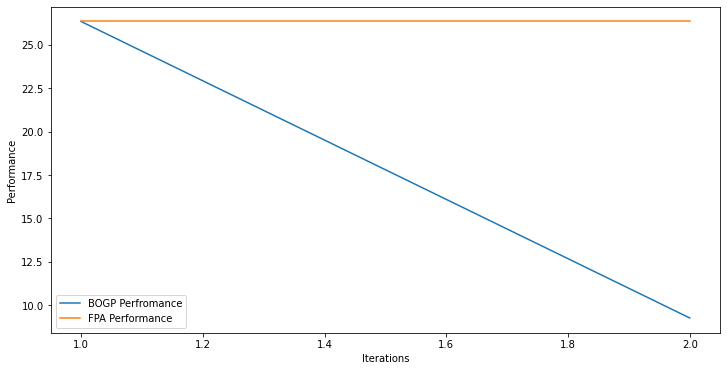

x_next is [ -5.00115097 -17.1381222   -2.62868669 -11.4864633  -13.99541984
 -18.12185959  -2.05326573 -22.61201015  -6.72839478 -18.46132783
 -24.06916431  -7.93243891 -15.04552909 -14.62959951 -19.6099206
  -7.81183105 -17.86012773 -11.29947138 -30.52874651 -13.5324255 ]
f()=13.719956, actual=5.428
1


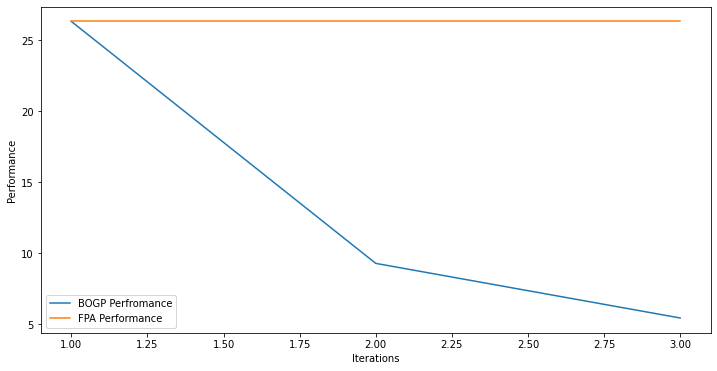

x_next is [-31.   0. -31. -31.   0. -31. -31.   0. -31.   0.   0. -31.   0.   0.
   0. -31.   0.   0.   0. -31.]
f()=10.856869, actual=13.208
2


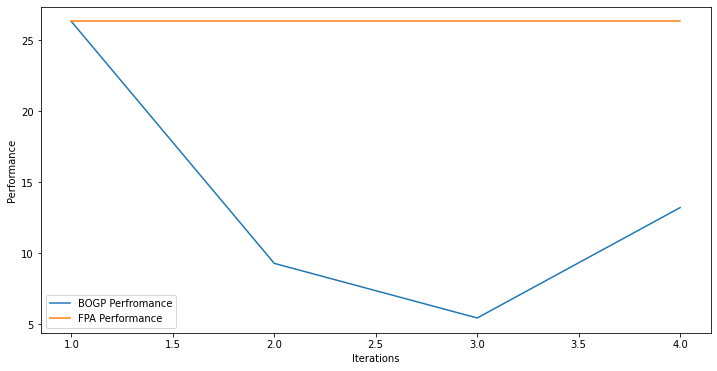

x_next is [  0. -31. -31.   0. -31.   0. -31.   0. -31.   0.   0.   0. -31. -31.
   0.   0.   0.   0.   0.   0.]
f()=13.152916, actual=23.397
3


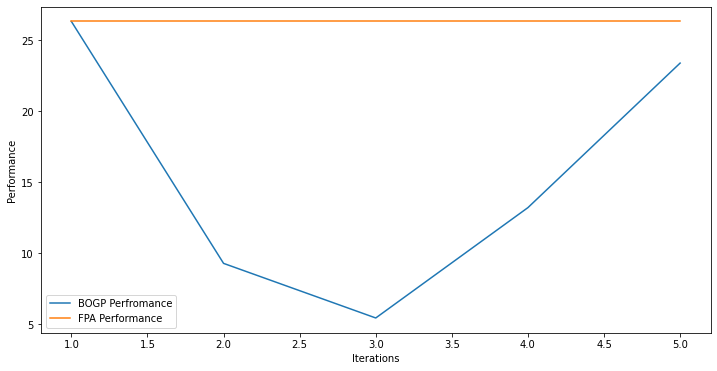

x_next is [  0.   0.   0.   0. -31.   0. -31.   0.   0.   0.   0. -31.   0. -31.
   0. -31.   0. -31.   0.   0.]
f()=17.932500, actual=20.391
4


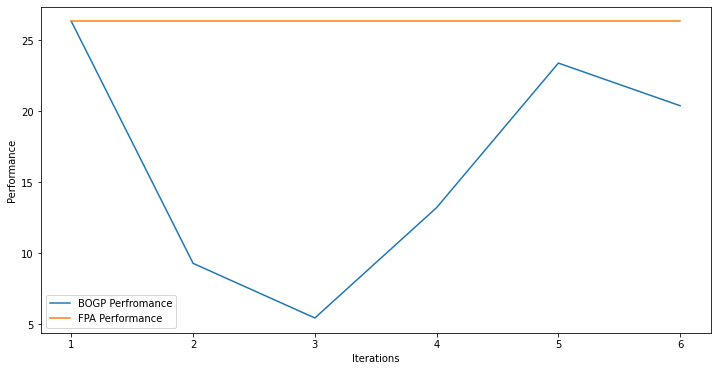

x_next is [-31. -31.   0. -31.   0.   0. -31.   0.   0.   0.   0.   0.   0. -31.
   0.   0. -31.   0.   0.   0.]
f()=17.742036, actual=19.006
5


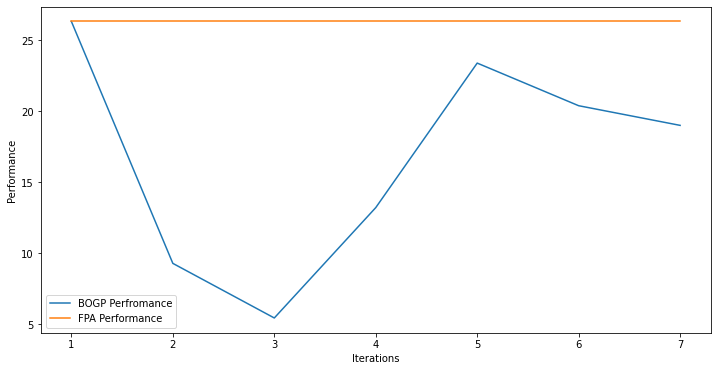

x_next is [  0.   0.   0.   0.   0.   0. -31.   0. -31.   0.   0. -31. -31.   0.
   0.   0. -31.   0.   0.   0.]
f()=20.146743, actual=23.353
6


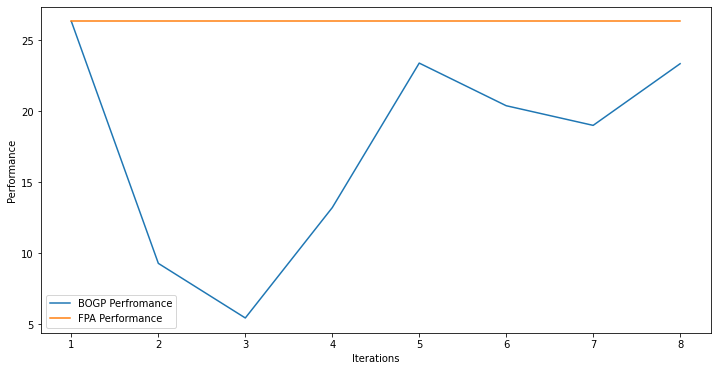

x_next is [-31.   0.   0. -31. -31.   0.   0.   0. -31.   0.   0.   0. -31.   0.
   0.   0.   0. -31.   0.   0.]
f()=18.621671, actual=17.934
7


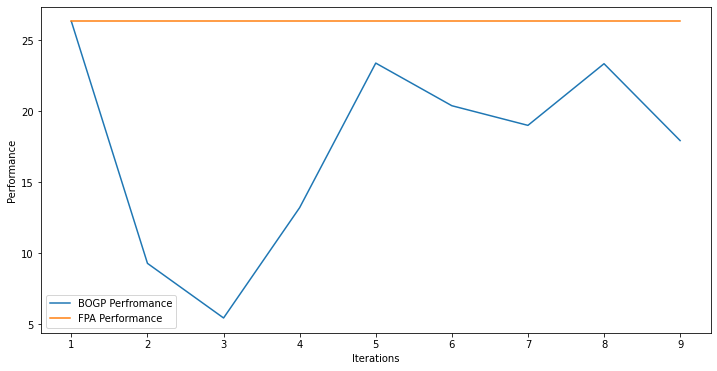

x_next is [-16.05005991  -6.77700729  -8.86150924 -22.79543456 -22.47120494
  -7.7909044  -15.51016193 -12.12297017 -10.25163101  -9.99707586
 -11.31390551  -7.36488154 -17.64478798 -14.46806753 -12.54415237
  -8.16433646  -1.74105331  -7.18317985 -24.31028211  -8.35811421]
f()=17.284046, actual=5.536
8


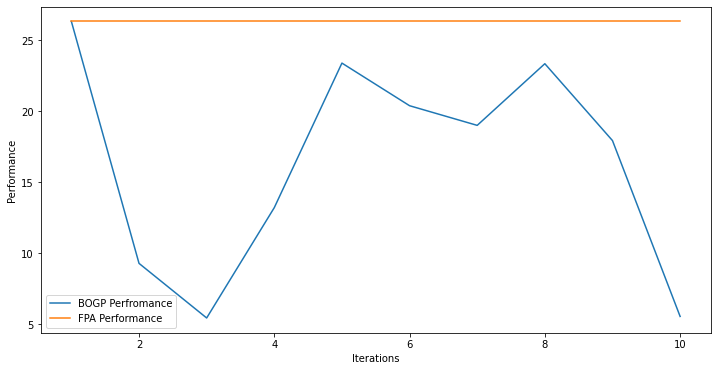

x_next is [ 0.0000000e+00 -3.1000000e+01 -3.1000000e+01  0.0000000e+00
 -8.8817842e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -3.1000000e+01  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00 -3.1000000e+01
 -3.1000000e+01 -3.1000000e+01  0.0000000e+00  0.0000000e+00]
f()=21.532579, actual=21.389
9


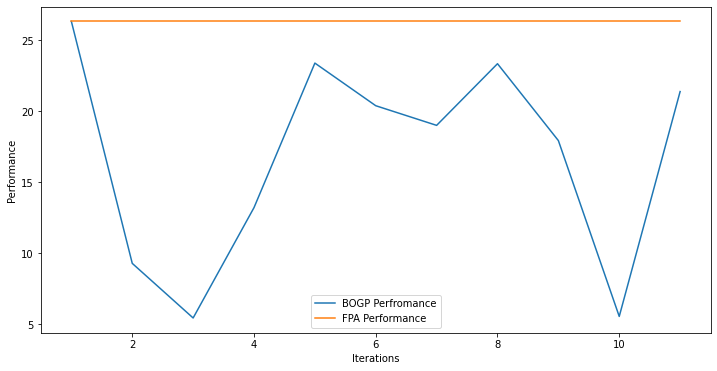

x_next is [  0. -31.   0.   0.   0.   0.   0.   0. -31.   0.   0. -31.   0. -31.
   0.   0.   0.   0.   0.   0.]
f()=23.217756, actual=25.580
10


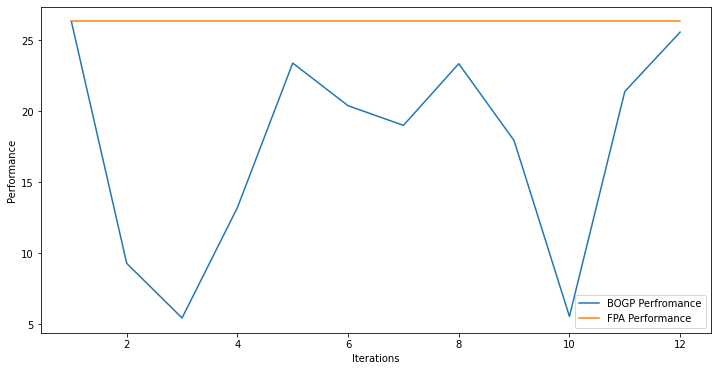

x_next is [  0.   0.   0.   0.   0. -31. -31.   0. -31.   0.   0.   0.   0. -31.
   0.   0.   0. -31.   0.   0.]
f()=21.942900, actual=23.564
11


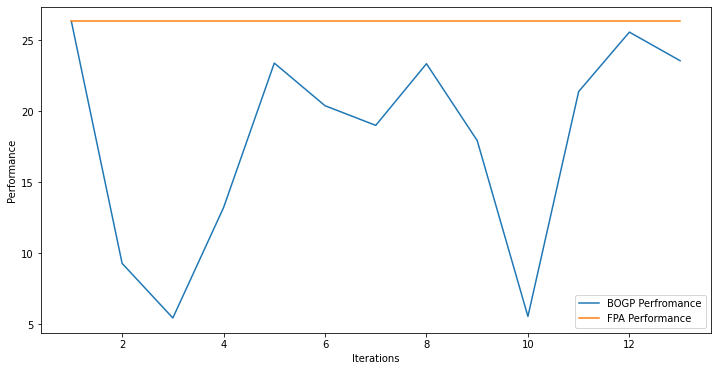

x_next is [  0. -31.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0. -31. -31.
   0.   0.   0. -31.   0. -31.]
f()=22.071651, actual=22.443
12


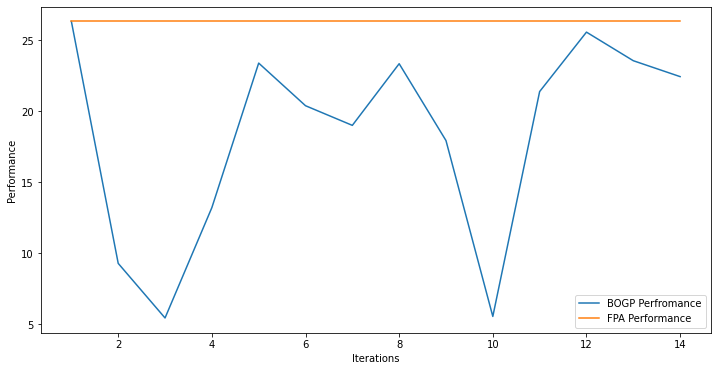

x_next is [-1.67469170e+01 -6.86276228e+00 -1.19755179e+01 -2.26831436e-02
 -2.73651731e+01 -2.34968782e+01 -2.77549217e+01 -9.85311841e+00
 -1.60198948e+01 -1.52119114e+01 -2.10377214e+01 -1.04570793e+01
 -1.45712554e+01 -2.37716202e+01 -1.39237716e+01 -1.85367843e+01
 -2.70790263e+01 -5.39854954e+00 -1.36836066e+01 -1.00770281e+01]
f()=18.146552, actual=6.919
13


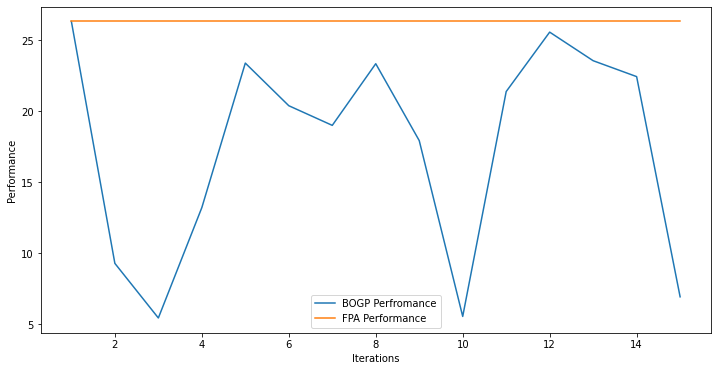

x_next is [  0.   0. -31.   0.   0.   0.   0.   0.   0.   0.   0. -31.   0. -31.
   0.   0. -31. -31.   0.   0.]
f()=22.223085, actual=23.624
14


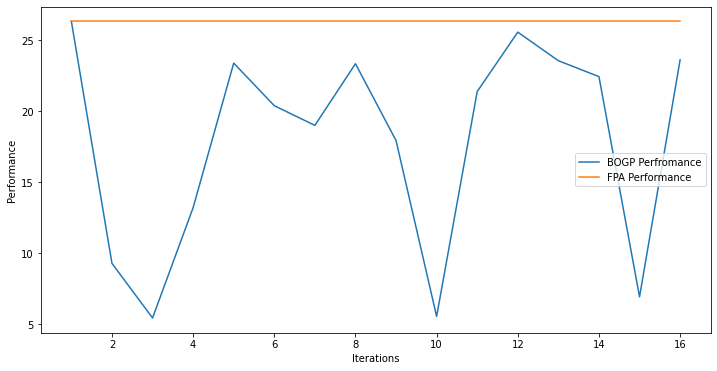

x_next is [-30.46777317 -23.90544726 -25.42519636 -29.36534756 -30.17169948
 -14.73410998 -26.78992011  -9.12316087  -1.13975045  -0.97824579
 -20.25258096 -30.4800633  -28.75231007 -21.38811038  -9.85229336
  -5.23132567  -3.10609691 -27.32566646 -14.50331972 -19.69278374]
f()=17.771014, actual=6.954
15


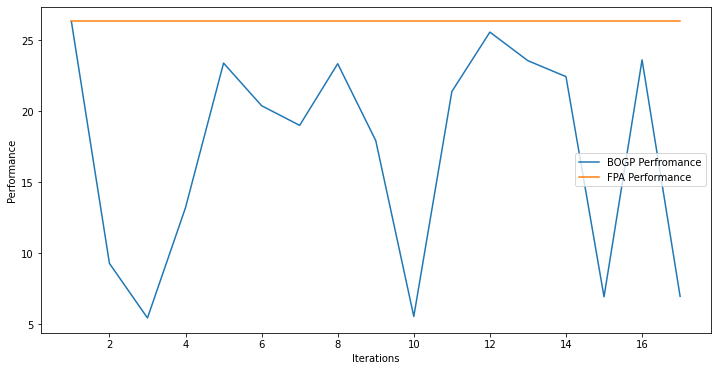

x_next is [  0. -31.   0.   0.   0.   0. -31.   0. -31.   0.   0. -31.   0.   0.
   0.   0.   0. -31.   0.   0.]
f()=25.310475, actual=24.445
16


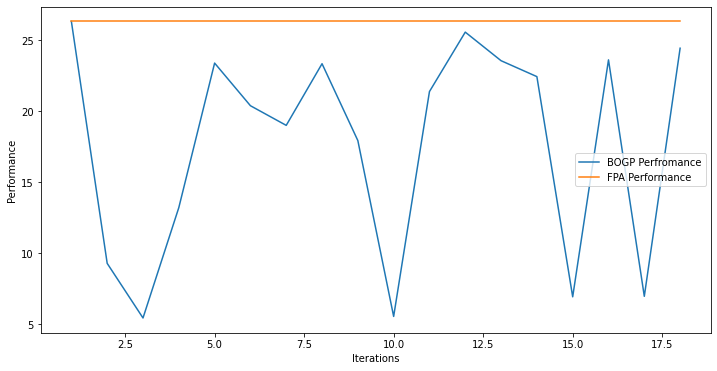

x_next is [  0. -31.   0.   0.   0. -31.   0.   0.   0.   0.   0. -31. -31.   0.
   0.   0.   0.   0.   0.   0.]
f()=22.137214, actual=23.772
17


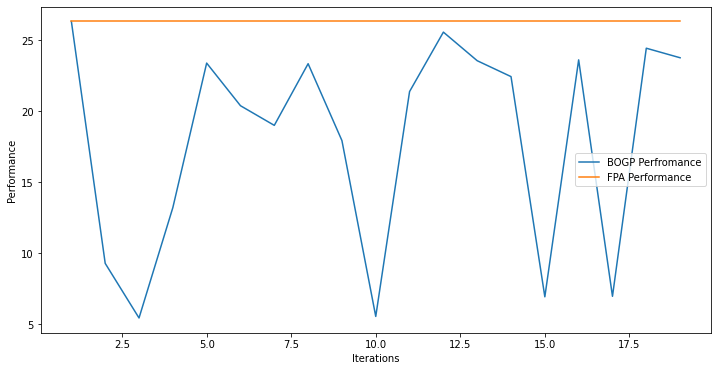

x_next is [  0.   0. -31.   0.   0.   0.   0.   0. -31.   0.   0.   0. -31. -31.
   0.   0.   0.   0.   0.   0.]
f()=24.636625, actual=25.238
18


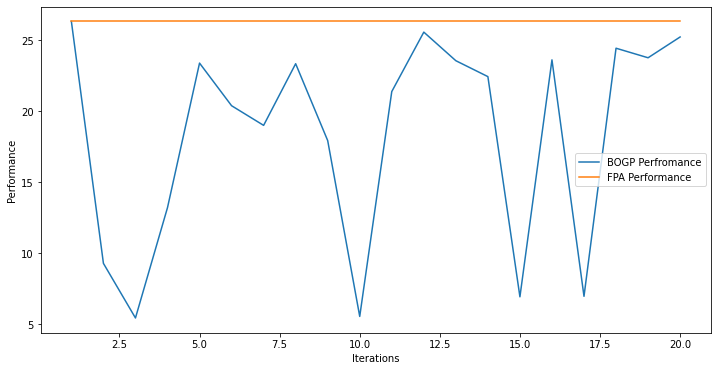

x_next is [ -7.95185583  -6.52045869 -20.69162277 -10.98355262 -19.2600346
 -16.87702964 -20.63098039  -9.21653188  -8.14058821  -2.00413355
  -3.73760314 -21.53930745 -20.15785966 -18.36091873  -9.99266993
 -15.870093   -30.11928406 -20.20306719 -13.315204    -9.35472651]
f()=18.236903, actual=7.179
19


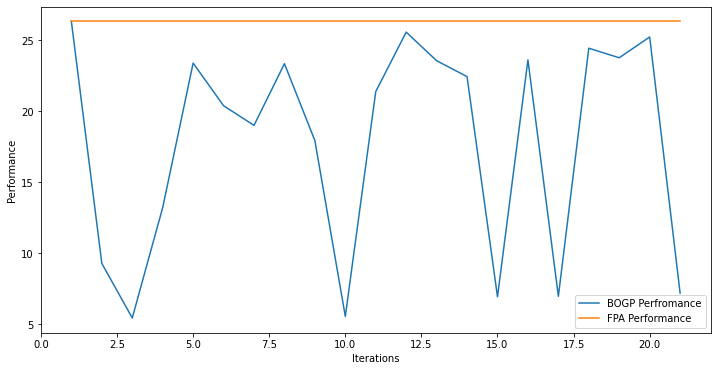

x_next is [-24.58973818 -18.94994997  -9.75478785 -29.99245731  -8.94651384
 -15.92897882 -28.19032638  -2.6807171   -5.03207568  -5.34643729
 -19.25926215 -10.73811562 -24.50388693 -23.48546625 -28.60163396
  -6.73047555  -6.00230804 -30.6200368   -1.19780536 -25.45648887]
f()=17.697508, actual=8.758
20


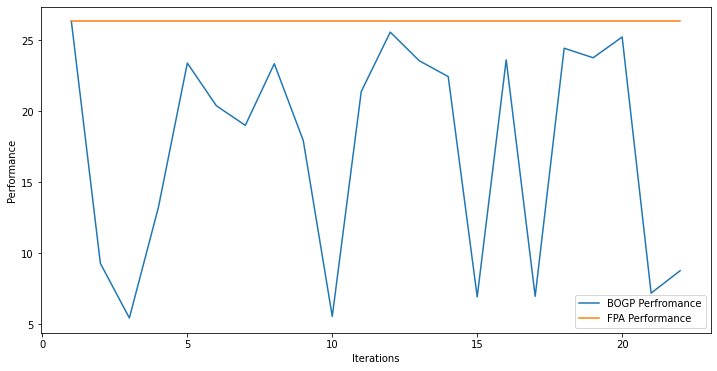

x_next is [  0. -31. -31.   0.   0.   0.   0.   0. -31.   0. -31.   0.   0.   0.
   0.   0.   0.   0.   0.   0.]
f()=25.108500, actual=26.121
21


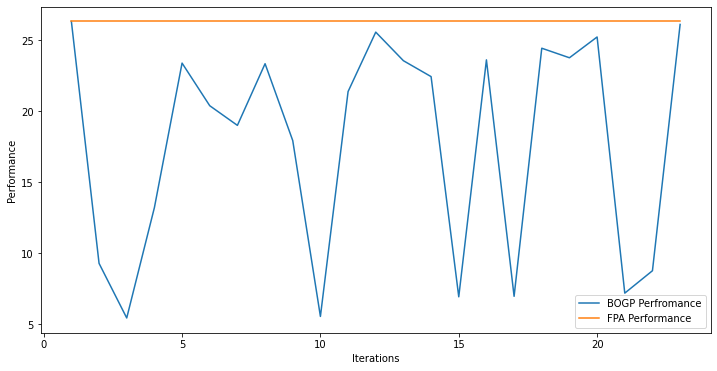

x_next is [-1.05070725e-03 -3.09951786e+01 -5.11133495e-03 -1.12097791e-02
 -2.46103138e-02 -3.56738630e-03 -5.98406265e-04 -1.32451793e-02
 -3.09988868e+01 -3.26375064e-03 -6.39982619e-04 -2.93372692e-02
 -4.77882920e-03 -5.40418629e-02 -2.31529456e-03 -1.23099036e-03
 -1.51772755e-02 -6.50072931e-04 -2.39652120e-03 -1.05143047e-02]
f()=17.671193, actual=26.174
22


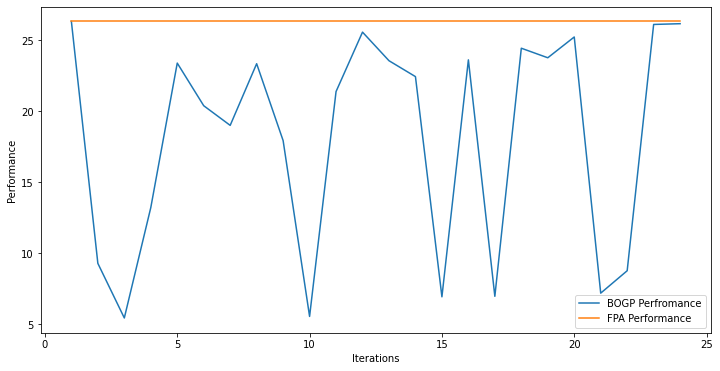

x_next is [  0. -31. -31.   0.   0.   0.   0.   0.   0. -31.   0.   0.   0. -31.
   0.   0.   0.   0.   0.   0.]
f()=24.590406, actual=22.964
23


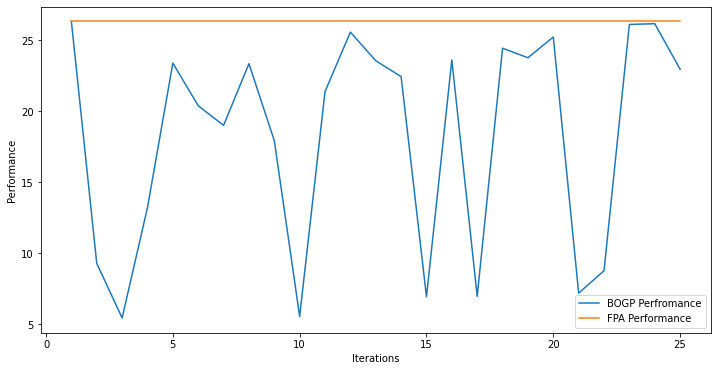

x_next is [-17.64438671 -16.07476388 -20.94576909  -1.36090209 -28.86463352
 -25.7615412  -30.96930036 -17.228859    -1.23662625 -24.12957846
 -15.91132902 -19.57243353 -20.67036282 -27.84983367 -30.4546191
 -11.77581256 -20.36585389 -26.31337104 -12.12595193  -7.85114683]
f()=18.229977, actual=6.648
24


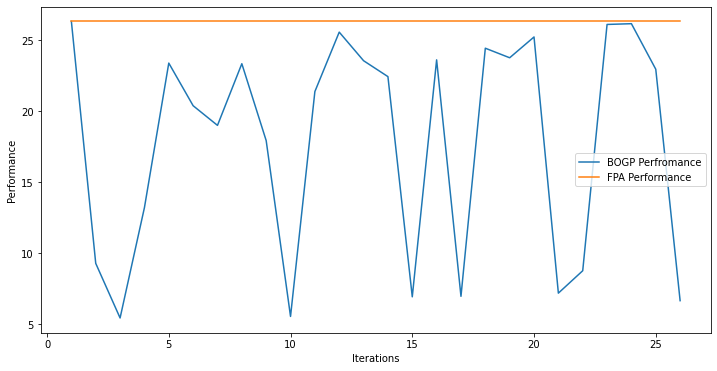

x_next is [-19.98723829  -4.53334294 -19.78218311 -17.98700519 -22.44025218
 -23.06932583 -20.18327185 -11.08770424 -24.87049775 -22.92634788
  -1.75325027 -19.55395723 -12.73712855 -15.96987171 -29.06676659
 -10.03977928 -24.12998125  -2.59201164  -8.45247954 -12.45169124]
f()=17.775160, actual=4.519
25


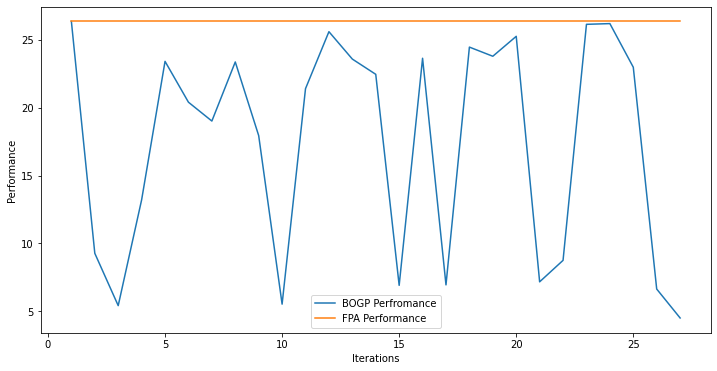

x_next is [  0. -31.   0.   0.   0.   0.   0.   0.   0.   0. -31.   0.   0. -31.
   0.   0.   0. -31.   0.   0.]
f()=26.076382, actual=25.175
26


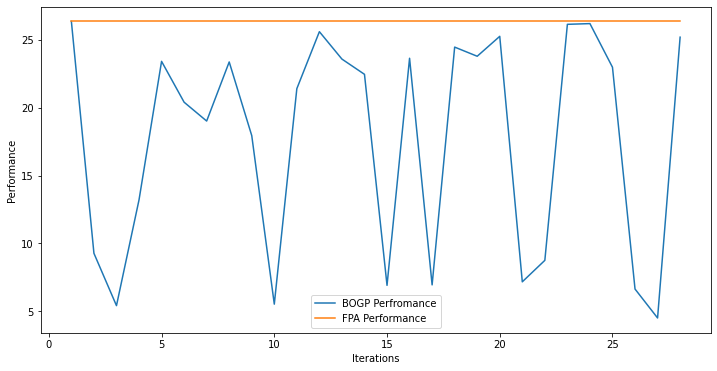

x_next is [-29.44293237  -6.44210186 -12.9695873  -30.2045301   -9.21679931
  -8.62221706  -4.12706246 -17.86726817  -7.32760129 -11.67090264
 -30.39495131 -16.70275698 -26.36664968 -13.43357933 -25.25894278
 -11.91385698 -22.43990778  -5.30925576 -20.30212143 -18.86977065]
f()=17.556565, actual=3.065
27


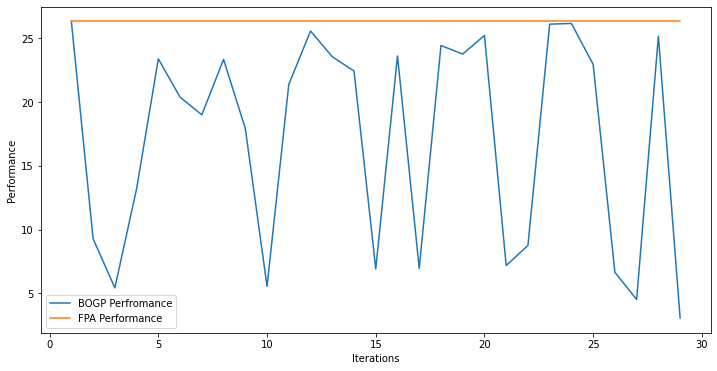

x_next is [  0. -31.   0.   0.   0.   0.   0.   0. -31.   0. -31.   0. -31.   0.
   0.   0.   0.   0.   0.   0.]
f()=25.938918, actual=25.343
28


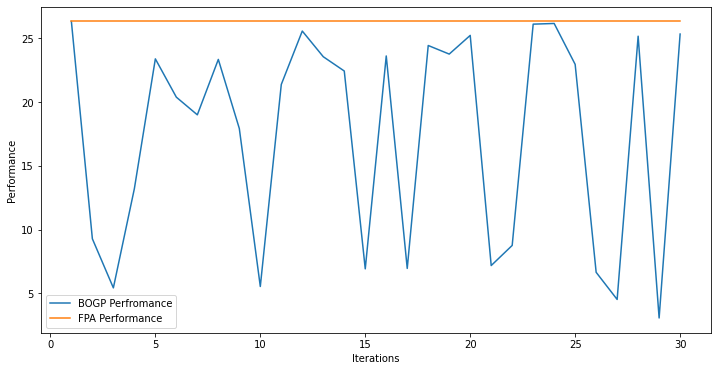

x_next is [-30.13918267 -28.87806025 -22.7073226   -6.40445663 -14.22018342
  -1.44206072 -27.87601951  -4.66535932  -4.73761399 -10.21185644
  -3.29013686 -23.25600801 -18.53612047 -30.45615961 -21.16208443
 -19.34021761  -2.92843975 -26.83892042 -14.48079373  -5.63319053]
f()=17.322322, actual=8.364
29


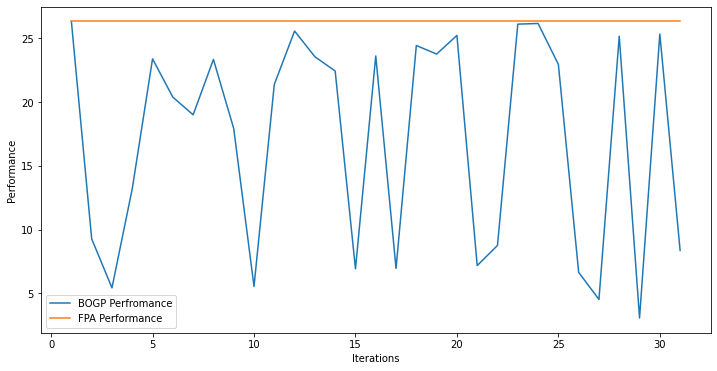

x_next is [  0.   0.   0.   0.   0.   0.   0.   0. -31.   0. -31. -31.   0.   0.
   0.   0.   0.   0.   0.   0.]
f()=25.925420, actual=25.815
30


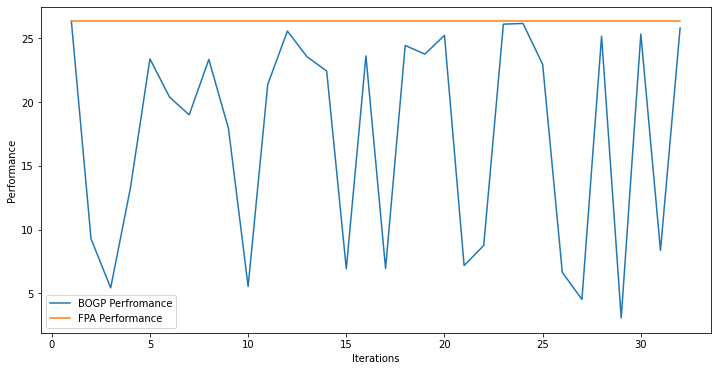

x_next is [-1.08485509e-04 -3.09995281e+01 -1.37616841e-04 -1.06581660e-06
 -6.72940847e-06 -1.91500525e-05 -1.38975827e-04 -2.76530686e-05
 -3.09998689e+01 -1.32152299e-04 -1.17998231e-04 -1.39812214e-04
 -4.26325957e-06 -1.92645222e-04 -7.87067521e-05 -4.91384518e-05
 -1.52227455e-04 -8.08494345e-05 -1.81358532e-04 -2.65564499e-05]
f()=17.307030, actual=26.194
31


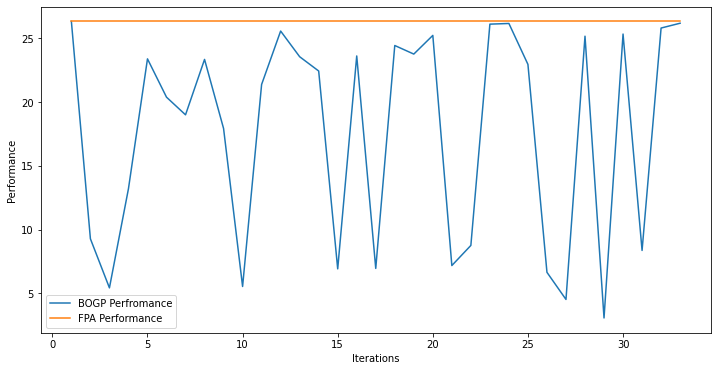

x_next is [-4.98131017e-05 -2.35759220e-04 -3.09999609e+01 -1.96299497e-04
 -2.95898110e-05 -5.88762527e-05 -1.07708328e-04 -5.76358773e-04
 -3.09998415e+01 -1.01886152e-04 -1.09901918e-04 -2.43703073e-04
 -7.36290076e-06 -6.82307651e-05 -2.44197397e-04 -2.97433117e-05
 -2.57347620e-05 -3.09999342e+01 -3.89975642e-04 -3.70743952e-05]
f()=25.830743, actual=25.399
32


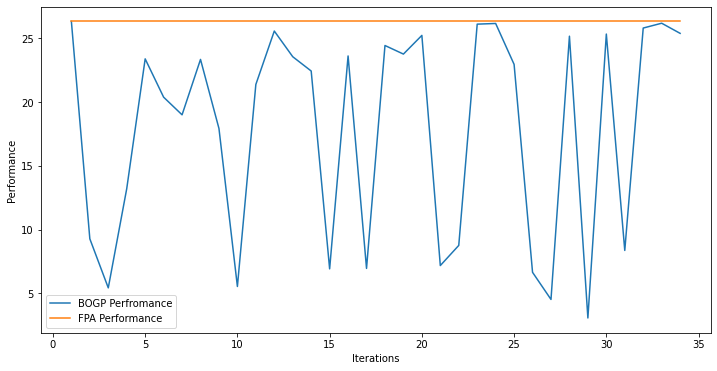

x_next is [-2.10200793e-05 -2.95158673e-06 -1.06221083e-04 -1.17888339e-04
 -3.99554702e-04 -4.92047072e-05 -1.76015234e-04 -2.93592593e-06
 -3.09999256e+01 -1.92048700e-04 -4.89911047e-05 -1.78116772e-04
 -3.16688547e-05 -3.09999319e+01 -1.39494538e-04 -4.73868185e-05
 -1.51721225e-04 -1.21425144e-04 -1.25023620e-05 -1.62436006e-05]
f()=26.096988, actual=26.108
33


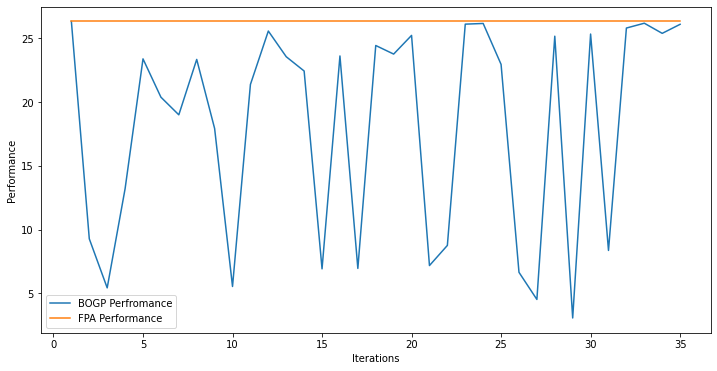

x_next is [-7.67615427e-06 -3.09999195e+01 -1.76209478e-04 -1.43829105e-04
 -1.02667392e-04 -8.08327966e-05 -1.03724645e-04 -9.90175533e-05
 -8.85516540e-05 -1.05933771e-03 -3.09999825e+01 -3.09997858e+01
 -5.08951644e-05 -1.47748971e-04 -1.75966161e-05 -1.36488025e-04
 -1.17483466e-06 -4.47927275e-05 -6.45676282e-05 -5.95836976e-05]
f()=25.648608, actual=25.761
34


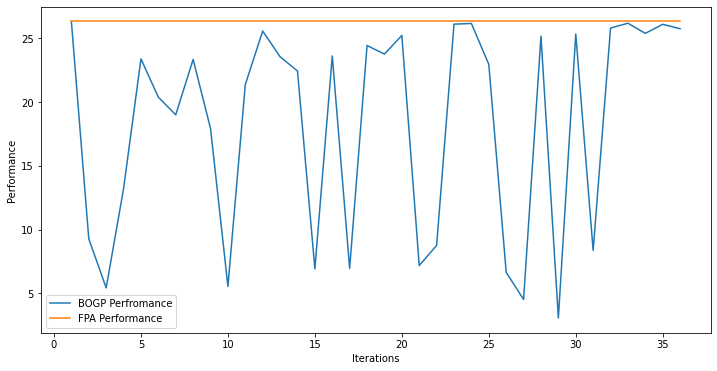

x_next is [-3.11011799e-04 -1.69009359e-04 -1.14856427e-04 -1.22692559e-04
 -5.48791464e-05 -5.04671905e-04 -1.83754680e-05 -2.03134400e-04
 -8.91805242e-05 -1.43889872e-04 -3.09999776e+01 -5.16934872e-06
 -1.81495881e-04 -8.91106191e-05 -3.82256308e-04 -2.61622067e-04
 -2.13089523e-04 -2.33888983e-04 -4.24637195e-05 -3.03131271e-05]
f()=26.034102, actual=26.304
35


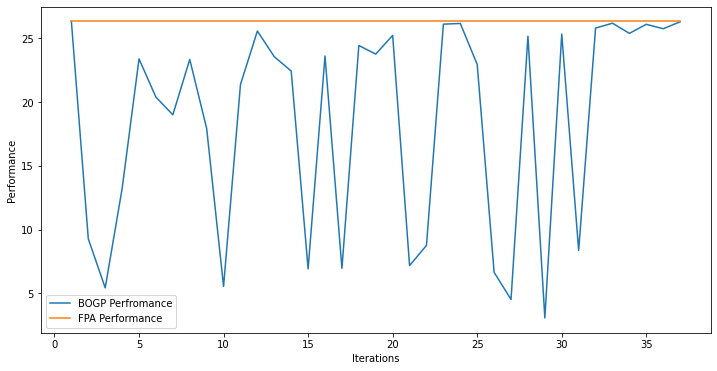

x_next is [-4.33903965e-05 -3.09999480e+01 -2.64855897e-04 -1.81447229e-04
 -7.28525796e-05 -2.28334107e-04 -3.09999892e+01 -2.25696646e-05
 -2.19201690e-04 -1.38001502e-04 -3.09999417e+01 -1.04818500e-04
 -1.72255482e-04 -5.00540092e-06 -1.33375178e-04 -9.38478308e-07
 -6.34587603e-05 -1.93422052e-04 -1.53831676e-04 -5.53305855e-05]
f()=25.454286, actual=25.741
36


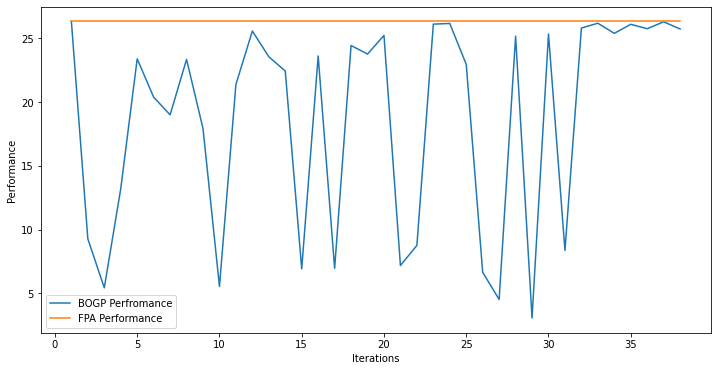

x_next is [-2.37924965e-05 -3.09999067e+01 -2.99477115e-05 -2.62815750e-05
 -1.64050720e-04 -5.08214997e-04 -1.12506360e-04 -1.13968920e-04
 -1.72472447e-05 -3.43080528e-05 -3.74942226e-05 -1.34257686e-04
 -4.56828004e-05 -3.20234117e-04 -7.98324798e-05 -1.27389834e-04
 -1.72161565e-05 -1.75477103e-04 -7.89091795e-05 -2.04121658e-04]
f()=26.140228, actual=26.235
37


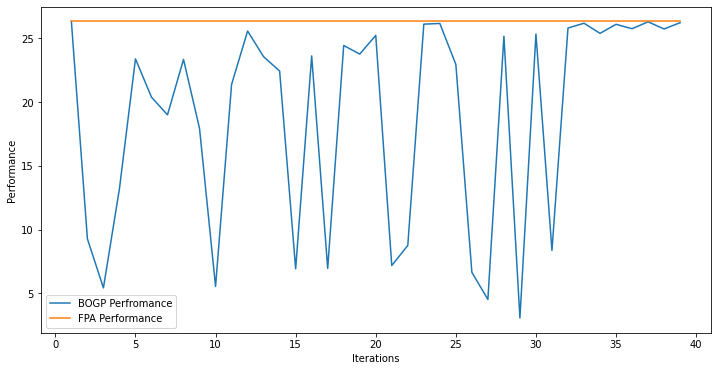

x_next is [-4.46293116e-04 -1.29545732e-05 -3.16883824e-04 -3.11557280e-04
 -1.71176966e-04 -1.32957435e-04 -9.77951671e-05 -1.10198487e-04
 -3.09998472e+01 -1.16586976e-04 -2.36772021e-05 -9.62347412e-05
 -2.47930649e-05 -1.51132817e-04 -5.78717546e-05 -1.10290480e-04
 -3.86545953e-05 -2.77831140e-04 -1.35512070e-04 -1.33459499e-05]
f()=26.345037, actual=26.290
38


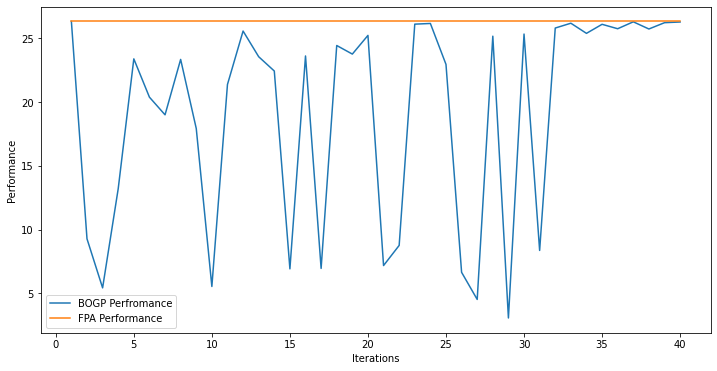

x_next is [-1.12392836e-04 -3.09998507e+01 -4.90009559e-04 -1.04810059e-04
 -1.85559228e-04 -2.12236440e-04 -1.08045303e-04 -1.09299599e-04
 -1.89515875e-04 -6.57571707e-05 -3.09998444e+01 -2.69754960e-05
 -1.10584042e-05 -1.01703585e-04 -1.70218714e-04 -2.89640521e-05
 -2.57070677e-05 -2.42181017e-05 -8.85499165e-05 -1.30205704e-04]
f()=26.181516, actual=26.208
39


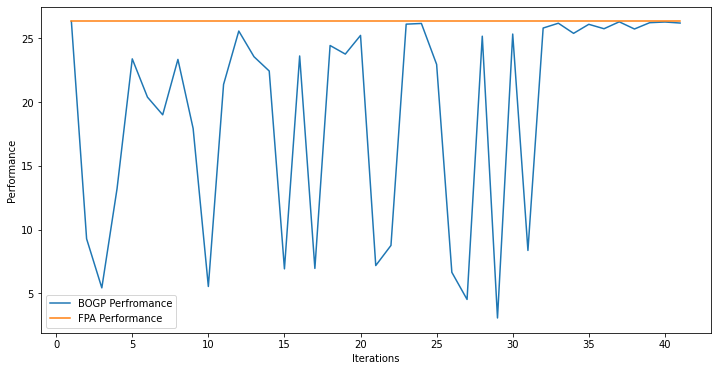

x_next is [-8.11996422e-05 -2.03352365e-05 -3.43144271e-05 -2.33488402e-04
 -1.96440526e-04 -1.40069697e-04 -6.26881101e-05 -2.20552262e-04
 -3.09999785e+01 -4.41085598e-05 -3.09995516e+01 -2.34817221e-04
 -1.66742601e-04 -6.81304585e-05 -3.99321659e-05 -2.38276055e-04
 -3.20904877e-04 -8.27720590e-04 -3.46753849e-05 -8.06406566e-05]
f()=26.169028, actual=26.262
40


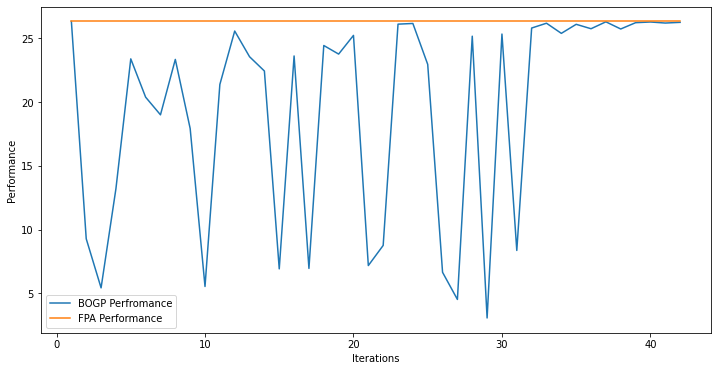

x_next is [-2.19384068e-04 -2.98920588e-04 -4.85056169e-05 -6.65893570e-05
 -2.09009739e-04 -6.61923356e-05 -5.00395481e-04 -1.11930122e-04
 -1.51427631e-04 -2.53815320e-04 -3.09999422e+01 -7.82261927e-04
 -1.81243720e-04 -3.09999343e+01 -3.19382338e-05 -2.16184044e-04
 -2.13753024e-04 -1.57350229e-04 -1.38872583e-05 -7.38694332e-05]
f()=25.956581, actual=26.122
41


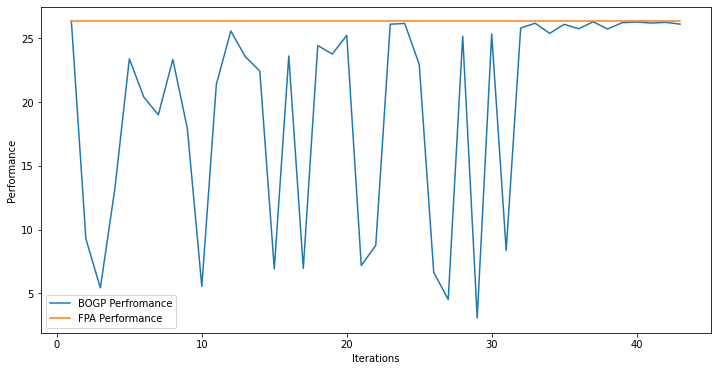

x_next is [-3.90523194e-05 -3.09997952e+01 -2.91655197e-04 -2.50486710e-05
 -4.10352519e-05 -1.49027171e-04 -1.10381770e-04 -1.66360548e-04
 -3.09998582e+01 -1.42706197e-04 -3.09997955e+01 -3.30078078e-04
 -5.30186765e-05 -4.31206999e-05 -5.79694360e-05 -9.26315892e-05
 -2.41924851e-04 -1.00531546e-05 -1.67887342e-06 -1.02170793e-04]
f()=26.130431, actual=26.166
42


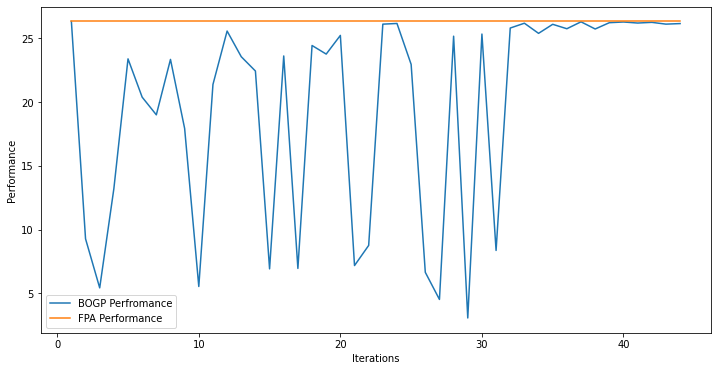

x_next is [-1.52299223e-04 -5.12332342e-05 -3.00217062e-04 -1.25979821e-04
 -4.89647516e-04 -1.29912581e-04 -1.00172412e-04 -1.72530706e-04
 -2.07102101e-04 -1.10473172e-04 -4.00545665e-05 -3.09998951e+01
 -6.71288888e-05 -3.09998349e+01 -2.97375838e-04 -3.35665881e-05
 -3.64225407e-04 -1.24517271e-04 -2.87375928e-05 -2.52168391e-05]
f()=25.943461, actual=25.717
43


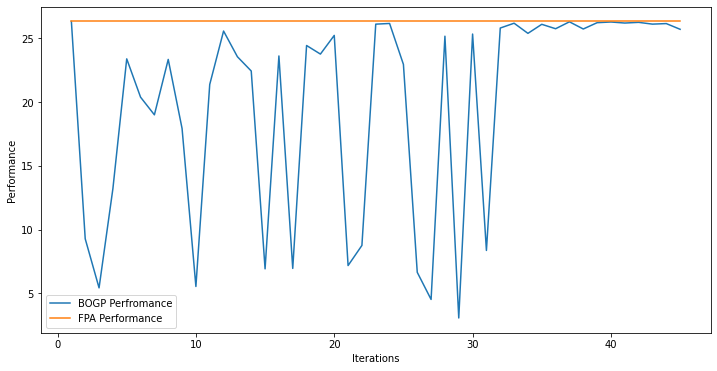

x_next is [-1.67050108e-04 -3.66016279e-04 -4.98627924e-04 -2.59599633e-04
 -2.48711854e-05 -2.35475997e-04 -2.32132726e-04 -1.35307986e-04
 -3.09998981e+01 -2.37229696e-04 -3.09998808e+01 -6.84417950e-05
 -2.34370687e-04 -3.09997999e+01 -6.11142021e-05 -8.04262764e-05
 -1.54415113e-04 -6.20968544e-06 -1.52737055e-04 -1.00074117e-04]
f()=26.077203, actual=26.080
44


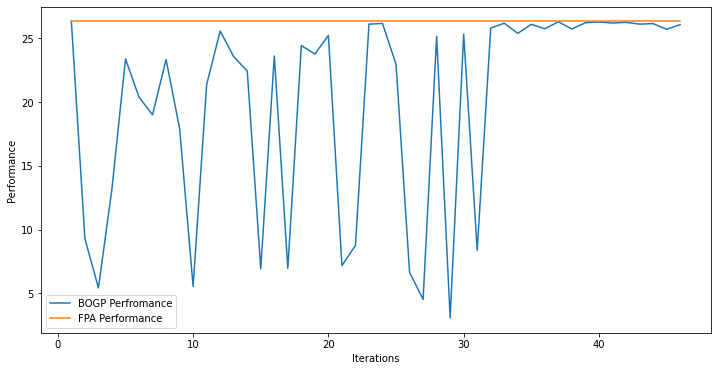

x_next is [-1.73551783e-04 -3.14818095e-05 -3.09997641e+01 -5.58434920e-05
 -3.44054647e-04 -1.52111378e-04 -1.66409145e-04 -5.39934923e-04
 -3.09996736e+01 -4.84568910e-04 -3.09998840e+01 -3.38494566e-05
 -2.07573950e-04 -4.76582747e-04 -1.58188792e-04 -1.47612437e-04
 -5.67010158e-06 -1.43991478e-04 -1.31725665e-04 -2.56491176e-04]
f()=26.018081, actual=26.217
45


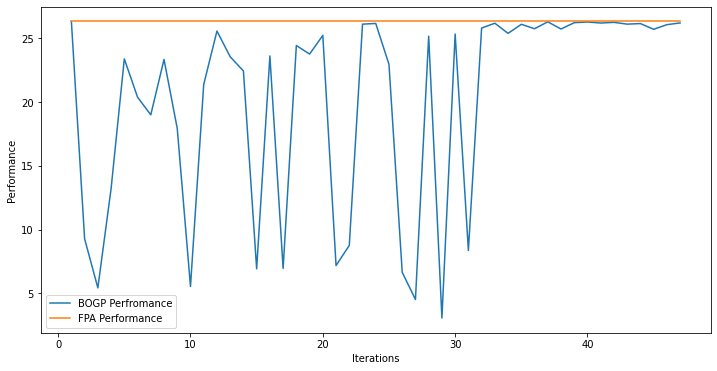

x_next is [-8.65443795e-05 -6.27074992e-05 -1.05696033e-04 -5.89484231e-04
 -1.63461569e-04 -9.48561797e-05 -6.21471622e-05 -1.38875396e-04
 -5.58601376e-04 -9.54840847e-05 -4.97831155e-04 -1.75766174e-04
 -1.06495134e-04 -3.09998805e+01 -2.01119475e-04 -1.66762204e-04
 -8.84268138e-05 -1.18290386e-04 -6.70628029e-05 -1.24291409e-04]
f()=26.072953, actual=26.149
46


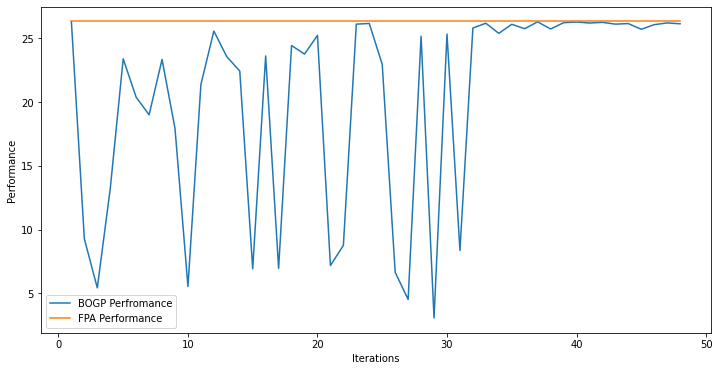

x_next is [-6.08361374e-05 -1.27132382e-04 -3.09999621e+01 -6.45859605e-05
 -2.39021841e-04 -2.47010412e-04 -1.83879261e-04 -8.34776374e-05
 -5.51931314e-04 -2.52544727e-04 -3.09997650e+01 -4.62146569e-05
 -1.41075446e-04 -6.44985720e-05 -3.17835040e-04 -6.45798839e-04
 -6.66747797e-05 -1.50434122e-04 -4.07127320e-04 -6.11657742e-05]
f()=25.955337, actual=26.259
47


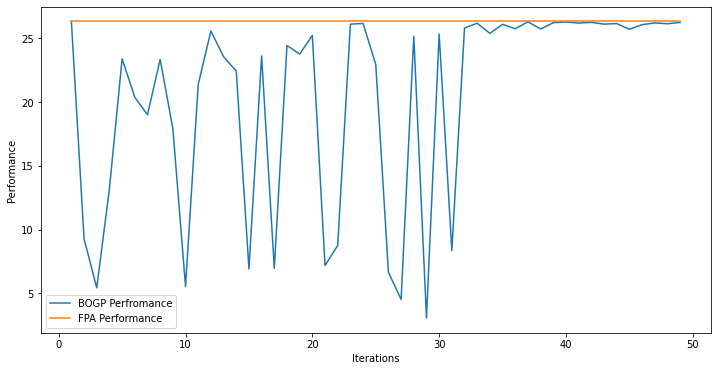

x_next is [-2.37420043e-04 -3.04479661e-04 -3.09998054e+01 -1.60347828e-04
 -8.90445140e-05 -3.35871682e-04 -3.07691091e-04 -5.02096448e-04
 -3.09999232e+01 -8.37706382e-05 -4.07615693e-04 -8.63736558e-05
 -4.80697260e-04 -1.60270520e-05 -2.03517097e-04 -8.09525880e-05
 -1.62721087e-04 -1.99884033e-04 -1.50633774e-04 -4.19312749e-04]
f()=26.090639, actual=26.245
48


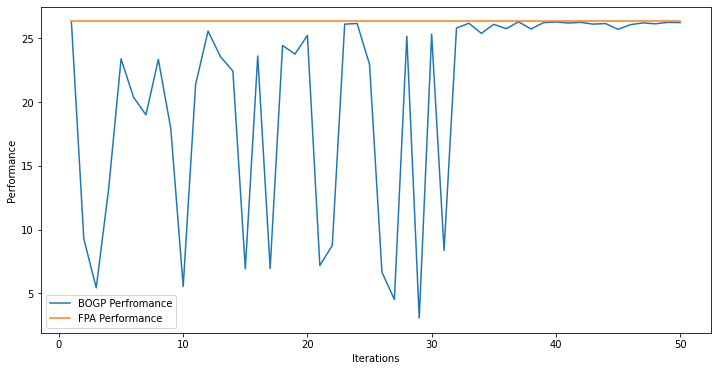

x_next is [-1.30098764e-04 -3.33692789e-04 -3.09999589e+01 -1.51699941e-04
 -8.20364179e-05 -1.28612133e-04 -1.40166169e-04 -1.45294067e-04
 -4.42381734e-04 -1.53603138e-04 -2.67995120e-05 -1.14050807e-04
 -3.72588279e-05 -1.04135338e-05 -9.38129784e-05 -2.68436953e-05
 -1.66127539e-04 -2.47639695e-04 -1.96709354e-06 -5.50738607e-05]
f()=26.124711, actual=26.286
49


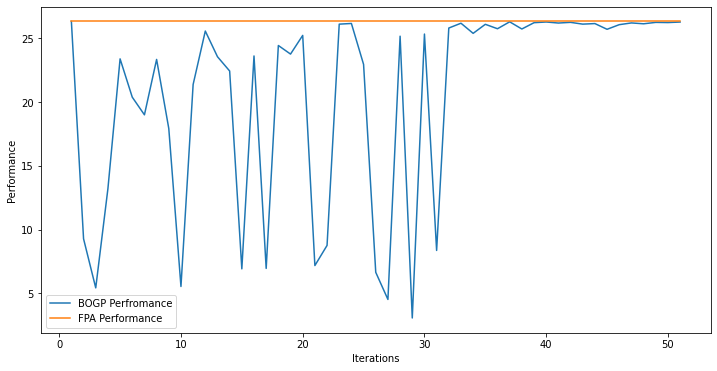

x_next is [-4.14807273e-03 -7.48681702e-03 -1.46091315e-03 -1.93844226e-03
 -1.06430950e-04 -8.15915892e-04 -2.42266094e-03 -6.24555791e-03
 -3.14124053e-05 -9.88262894e-05 -6.23434856e-05 -1.11858629e-02
 -6.47252046e-03 -1.89278715e-04 -1.18049553e-03 -1.03152869e-03
 -6.47111865e-04 -3.04753265e-03 -2.12564807e-04 -2.40317708e-04]
f()=26.328780, actual=26.326
50


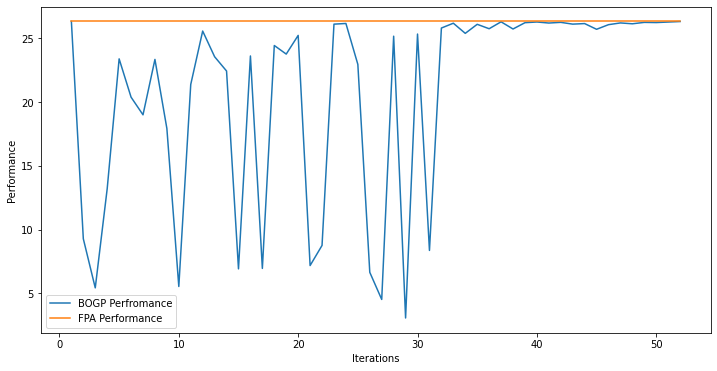

x_next is [-9.19697839e-04 -3.09990158e+01 -3.09990407e+01 -1.87632107e-04
 -1.93032202e-05 -3.13500591e-04 -1.24151677e-04 -7.95198503e-05
 -3.09999844e+01 -1.52850144e-04 -2.29291416e-04 -7.55284493e-04
 -1.39040759e-03 -1.00143232e-03 -2.96665582e-06 -3.04978080e-04
 -2.08606840e-05 -4.43917045e-04 -1.95112930e-04 -6.71691490e-04]
f()=26.164504, actual=26.148
51


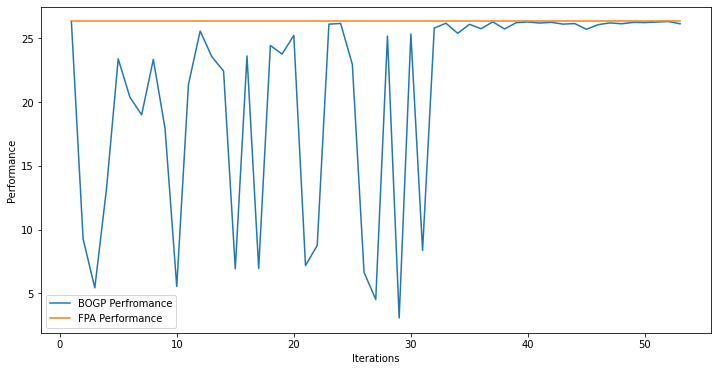

x_next is [-2.87427436e-03 -3.89926287e-02 -7.88871302e-03 -1.05733666e-03
 -1.29620010e-02 -1.05163907e-03 -1.21577003e-02 -1.08128170e-03
 -4.07445902e-02 -4.64830038e-05 -3.31246512e-02 -4.71940244e-03
 -1.44118126e-02 -5.41537001e-03 -4.35441675e-03 -1.88962829e-03
 -2.57619196e-03 -9.10288901e-03 -1.92295995e-03 -1.76654516e-03]
f()=26.322434, actual=26.320
52


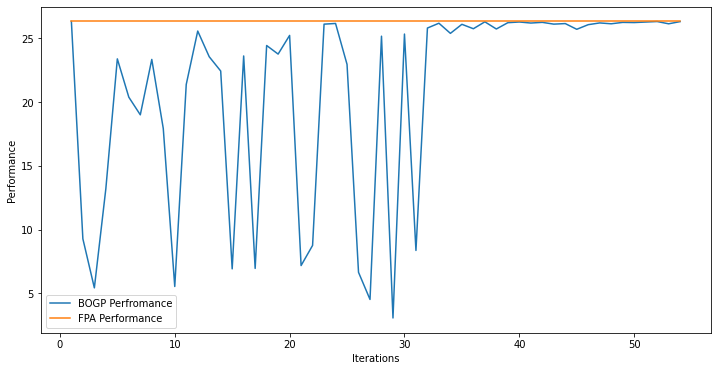

x_next is [ 0.00000000e+00 -2.27188383e-03 -3.58634960e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -3.46401661e-05 -6.26675414e-03  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -9.03090742e-03  0.00000000e+00  0.00000000e+00]
f()=26.327745, actual=26.329
53


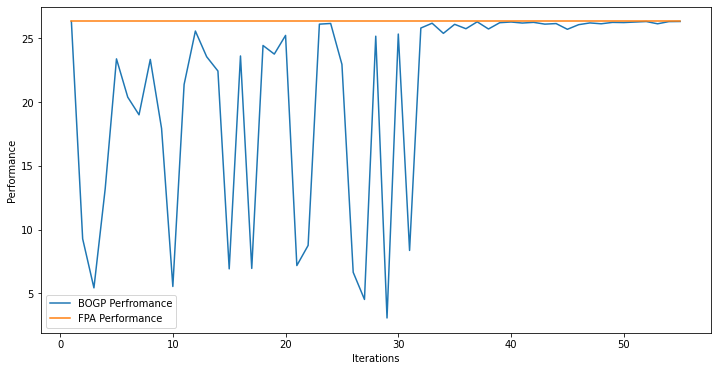

x_next is [ 0.00000000e+00  0.00000000e+00 -1.66977805e-11 -3.62386684e-03
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -5.18667192e-04  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
f()=26.329179, actual=26.331
54


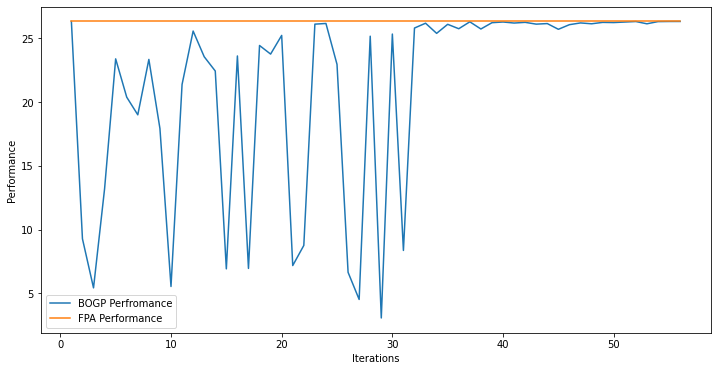

x_next is [ 0.00000000e+00  0.00000000e+00 -1.88620792e-25  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.81741783e-02
 -4.23848324e-02 -1.81198996e-03 -4.49379859e-03 -6.76795638e-03
  0.00000000e+00 -1.06666871e-02  0.00000000e+00 -9.04704807e-03
 -2.20896555e-26  0.00000000e+00  0.00000000e+00  0.00000000e+00]
f()=26.325629, actual=26.325
55


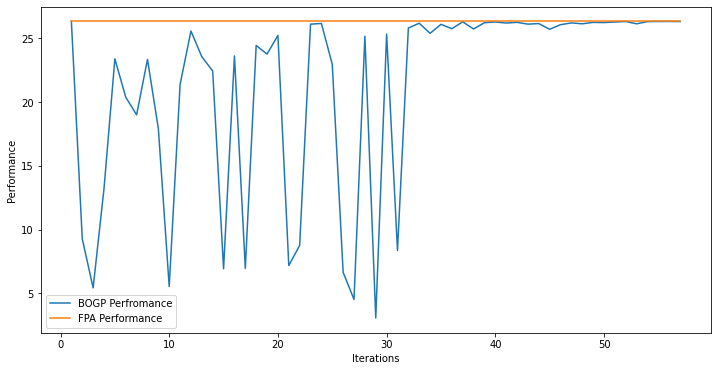

x_next is [-0.03746816 -0.02214871 -0.00536677 -0.00217615 -0.01604638 -0.01989567
 -0.01815244 -0.00311358 -0.00201479 -0.03956506 -0.06657378 -0.07153016
 -0.06816761 -0.04314722 -0.00662567 -0.02576779 -0.04629092 -0.056677
 -0.00087182 -0.0065468 ]
f()=26.297273, actual=26.264
56


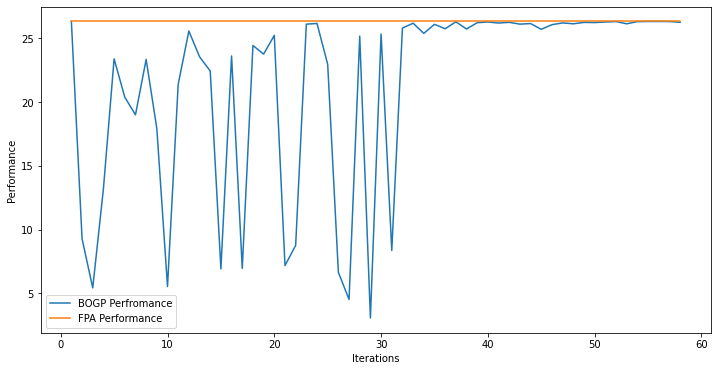

x_next is [-9.71096825e-04 -8.22845292e-03 -4.08225550e-03 -6.96937861e-04
 -4.74520411e-04 -2.33109290e-03 -2.30035102e-03 -1.63136440e-04
 -2.25671829e-03 -1.22048171e-03 -7.25191100e-04 -5.31635492e-03
 -7.85814332e-04 -1.12554254e-02 -7.62538163e-08 -1.51565390e-03
 -2.45019514e-03 -6.83094104e-05 -8.25915690e-04 -1.95925315e-03]
f()=26.323192, actual=26.327
57


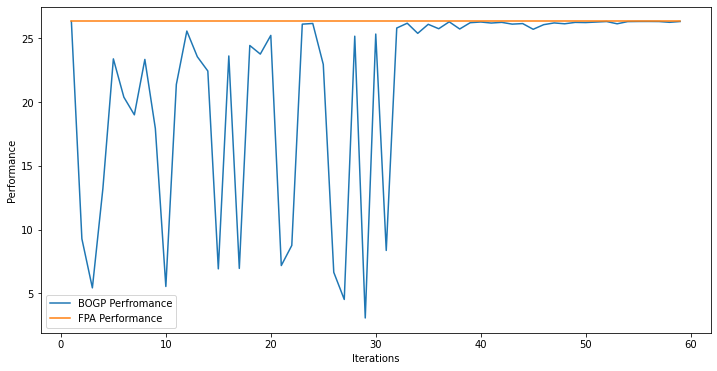

x_next is [-4.84830963e-04 -4.33902030e-03 -4.45193769e-03 -5.69431324e-05
 -8.26947332e-04 -2.41539862e-03 -4.44839416e-03 -5.27939517e-03
 -1.45788844e-03 -1.28613579e-03 -4.55387876e-03 -1.01197029e-03
 -1.61546030e-03 -7.15149051e-03 -2.45060654e-03 -3.74395313e-04
 -3.96596046e-03 -8.32719581e-03 -1.21598424e-04 -6.65818843e-03]
f()=26.322851, actual=26.325
58


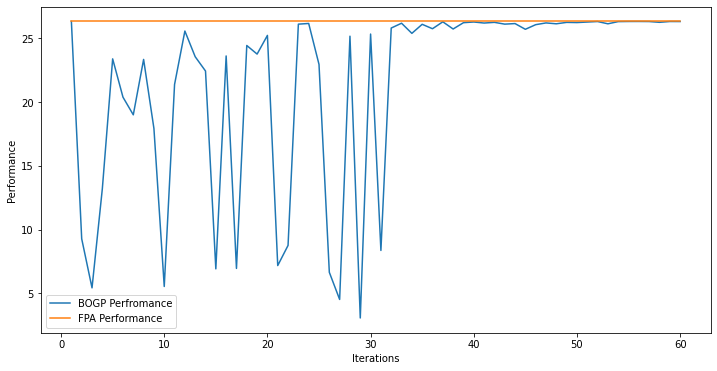

x_next is [-2.95578414e-03 -2.95435151e-02 -3.09854519e+01 -5.51375517e-03
 -4.23046687e-03 -1.05003356e-02 -3.09791668e+01 -6.46020302e-03
 -3.09967948e+01 -8.37405873e-03 -3.87600952e-03 -7.12474825e-03
 -1.54178340e-02 -3.09957911e+01 -4.16837717e-03 -5.46467598e-03
 -1.88770133e-03 -2.99158512e-02 -1.13238100e-03 -4.16003060e-03]
f()=26.111378, actual=25.579
59


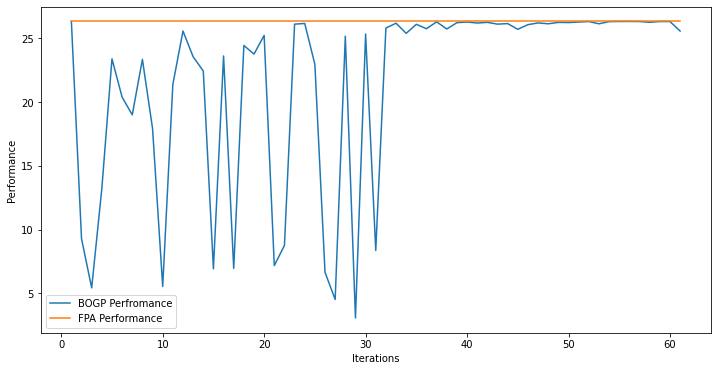

x_next is [-1.28963130e-03 -3.09825249e+01 -3.09994360e+01 -3.90394689e-03
 -1.25471039e-03 -4.50330663e-03 -5.17290665e-03 -7.01178618e-03
 -2.94830295e-02 -8.60643054e-03 -3.68240033e-02 -1.24151948e-04
 -8.47188756e-03 -3.09989085e+01 -1.02376624e-03 -1.70416262e-03
 -5.02960888e-03 -9.55583015e-03 -3.87885602e-04 -1.79694897e-03]
f()=26.176805, actual=25.998
60


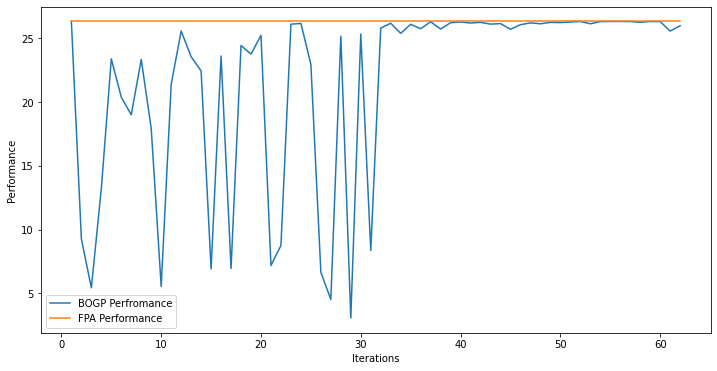

x_next is [-9.90582281e-03 -2.56903538e-02 -3.09929923e+01 -7.67881600e-03
 -1.69711859e-03 -3.63115117e-03 -8.01444021e-03 -1.68805548e-03
 -2.41073171e-02 -1.12122371e-02 -3.09890833e+01 -3.28786164e-02
 -5.77333846e-03 -3.09828428e+01 -3.64666758e-03 -5.10356044e-04
 -1.16332096e-03 -2.04967881e-02 -6.60527503e-03 -2.72592168e-03]
f()=26.105151, actual=26.061
61


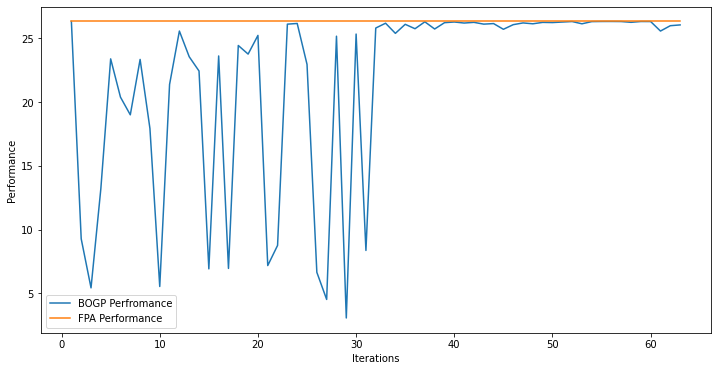

x_next is [-2.49532492e-02 -3.09663807e+01 -3.09677257e+01 -2.98377402e-03
 -1.36334894e-02 -1.08904981e-02 -2.87527513e-04 -2.46260642e-02
 -6.45322154e-02 -1.78624704e-03 -3.78674120e-02 -1.33909457e-02
 -1.16267462e-02 -5.35990127e-03 -1.68360828e-02 -8.91996891e-04
 -3.13553996e-02 -6.57248372e-02 -5.14005089e-03 -1.69524272e-02]
f()=26.244151, actual=26.152
62


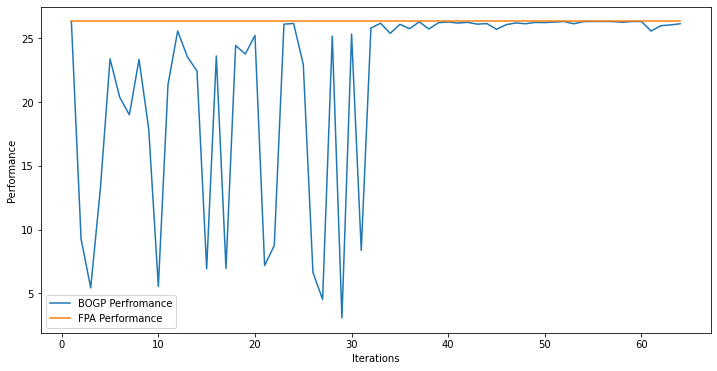

x_next is [-2.10439997e-03 -1.13656452e-01 -3.09444122e+01 -5.89523137e-03
 -2.64910494e-03 -1.11620353e-04 -2.99114949e-02 -1.86443361e-03
 -1.63626195e-02 -4.18161269e-03 -3.09991562e+01 -3.09895213e+01
 -1.69232840e-03 -3.09868224e+01 -1.27875688e-03 -4.67791883e-03
 -4.41040685e-02 -1.68396290e-02 -5.24274552e-04 -1.50211544e-02]
f()=25.912897, actual=25.608
63


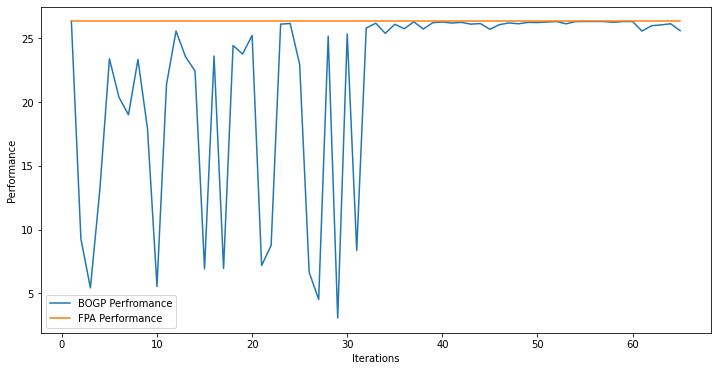

x_next is [-1.52682082e-02 -1.89684586e-02 -3.35983398e-02 -7.92744848e-03
 -6.98537371e-03 -5.00502151e-03 -3.09556546e+01 -1.11860490e-02
 -3.09980438e+01 -2.27585976e-02 -2.38930840e-03 -2.57579271e-04
 -1.60596798e-02 -3.40284888e-02 -4.71273401e-03 -1.40211711e-02
 -3.88077808e-03 -7.52875621e-03 -7.25666058e-03 -6.69107239e-03]
f()=26.058867, actual=25.798
64


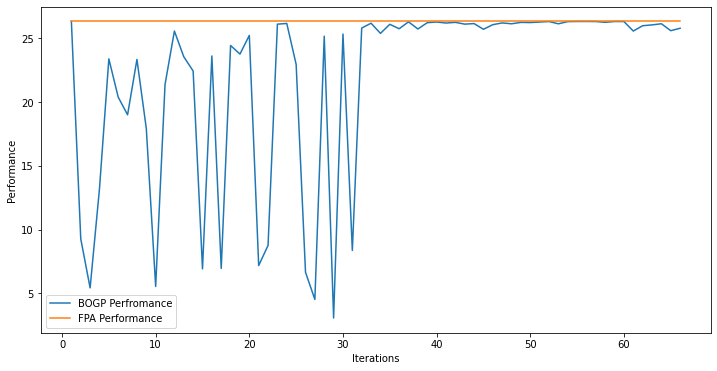

x_next is [-0.00599853 -0.01292453 -0.00704867 -0.00110821 -0.0112421  -0.00749734
 -0.00132002 -0.00443137 -0.0195188  -0.00130247 -0.00054804 -0.00631985
 -0.00038718 -0.00979515 -0.00315627 -0.00126469 -0.00068149 -0.00887972
 -0.00186149 -0.00363873]
f()=26.320184, actual=26.321
65


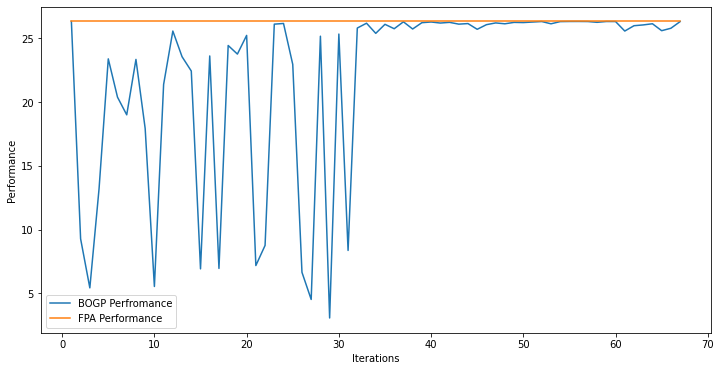

x_next is [-2.85606498e-03 -3.09954103e+01 -3.18870068e-02 -2.10930307e-03
 -1.87537823e-02 -1.96506642e-02 -3.09927082e+01 -1.27781173e-03
 -3.04491069e-03 -6.63488115e-03 -3.67740681e-03 -2.02447511e-02
 -1.98398820e-02 -3.09902647e+01 -1.57636033e-03 -2.99640015e-02
 -1.14507772e-02 -3.29919273e-03 -3.01854610e-03 -3.96232414e-03]
f()=25.973979, actual=25.562
66


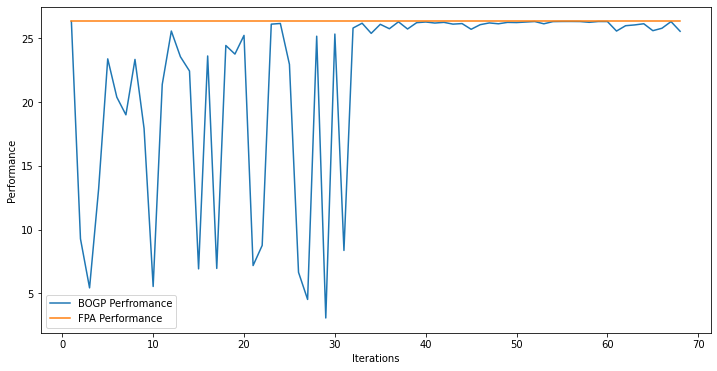

x_next is [-0.00028975 -0.0012966  -0.00906303 -0.0051118  -0.00266667 -0.00271961
 -0.01293393 -0.0022746  -0.01034675 -0.002763   -0.02594275 -0.02264683
 -0.00085237 -0.0164014  -0.00085133 -0.00043755 -0.01249682 -0.0020966
 -0.00022819 -0.00104469]
f()=26.320197, actual=26.322
67


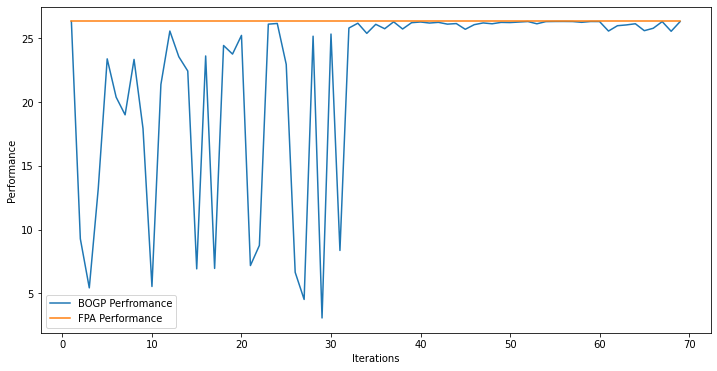

x_next is [-0.09130879 -0.11619225 -0.67038947 -0.1285967  -0.02038767 -0.02337239
 -0.02651968 -0.04716891 -0.27621636 -0.00879527 -0.00552217 -0.06619982
 -0.0614942  -0.02824235 -0.0057081  -0.07382369 -0.04269952 -0.01412728
 -0.02732728 -0.00321187]
f()=26.234907, actual=26.223
68


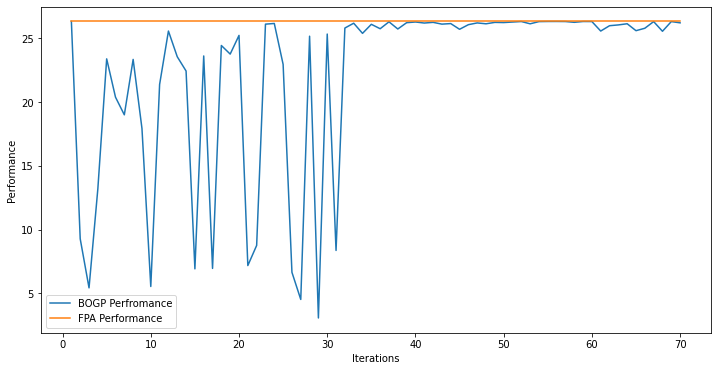

x_next is [-1.08714168e-02 -3.42997667e-01 -2.80412886e-02 -4.54633090e-02
 -5.05485688e-02 -5.12129500e-02 -1.49231483e-01 -2.52935660e-02
 -9.41460307e-01 -2.10194640e-04 -1.07148631e-01 -1.17512253e-01
 -2.20614546e-02 -1.31790044e-02 -1.53716680e-02 -1.42219265e-03
 -1.49430621e-02 -4.54612794e-02 -5.08784040e-02 -8.48185731e-02]
f()=26.222877, actual=26.221
69


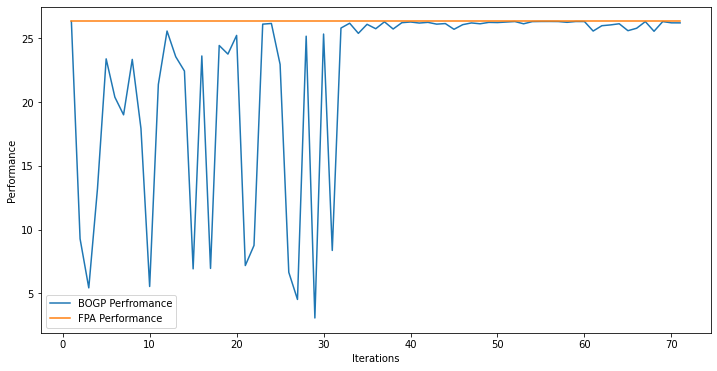

x_next is [-0.05786473 -0.32133703 -0.24224963 -0.225168   -0.00162539 -0.00510835
 -0.07567784 -0.00506767 -0.07521121 -0.02428015 -0.28632399 -0.05839013
 -0.0023872  -0.13183361 -0.08698213 -0.06828101 -0.04082394 -0.11339935
 -0.00973089 -0.05549794]
f()=26.198798, actual=26.211
70


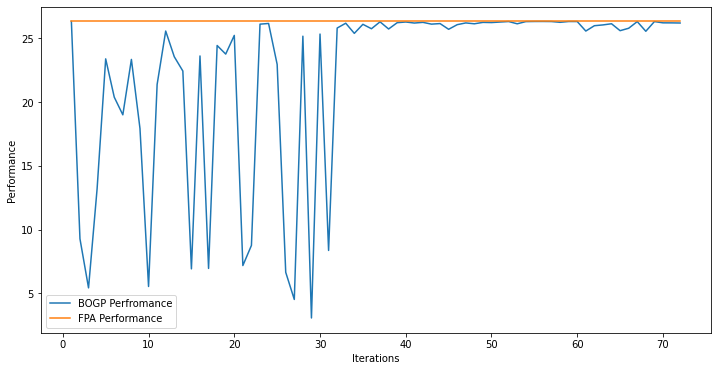

x_next is [-0.00266486 -0.0068582  -0.0025929  -0.00022799 -0.00307583 -0.00502086
 -0.00173817 -0.02035918 -0.0122301  -0.00553088 -0.00787498 -0.01148693
 -0.00719377 -0.01517117 -0.00553256 -0.00167903 -0.00715838 -0.00434456
 -0.00385339 -0.00767268]
f()=26.318154, actual=26.317
71


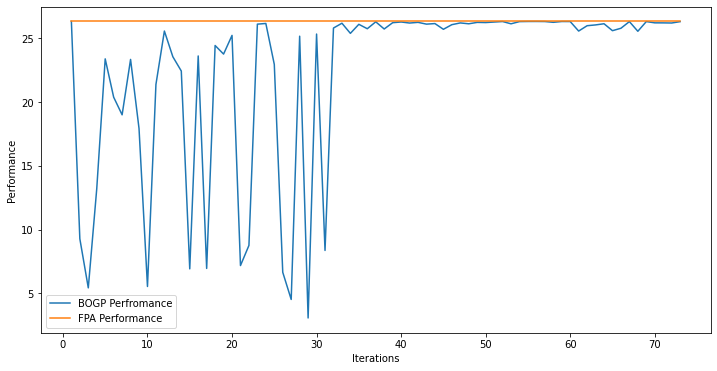

x_next is [-6.39042505e-04 -5.40058462e-01 -6.63393960e-01 -4.81142879e-02
 -1.21481425e-08 -6.38368047e-02 -4.41771461e-02 -2.18587384e-11
 -8.43643482e-01 -5.14583544e-09 -4.52536895e-02 -3.66765569e-08
 -5.97234662e-02 -3.27392703e-08 -2.16735235e-11 -2.71589379e-08
 -2.27535279e-12 -3.47365989e-02 -5.14471041e-09 -1.05854110e-08]
f()=26.271859, actual=26.274
72


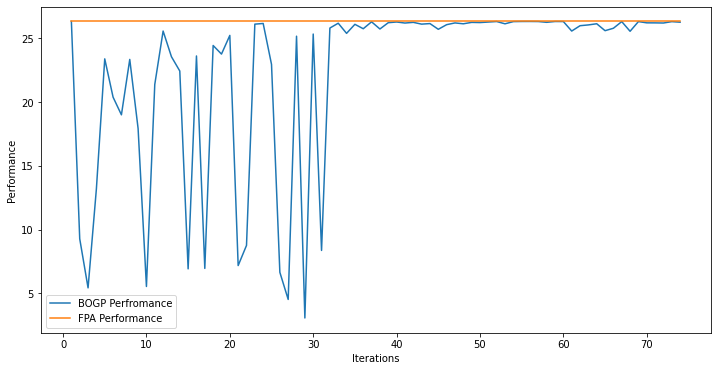

x_next is [-3.50868098e-02 -2.64922745e-02 -4.54907741e-02 -5.47879065e-02
 -2.84758222e-03 -2.88561746e-02 -2.06986313e-01 -1.81099547e-02
 -1.95639952e-01 -5.83181204e-03 -3.07419314e+01 -2.00843738e-02
 -1.29171132e-01 -3.71495928e-01 -5.89232590e-02 -9.93473211e-02
 -3.38453184e-02 -9.62712815e-02 -7.81501510e-02 -1.01521745e-02]
f()=26.178110, actual=26.165
73


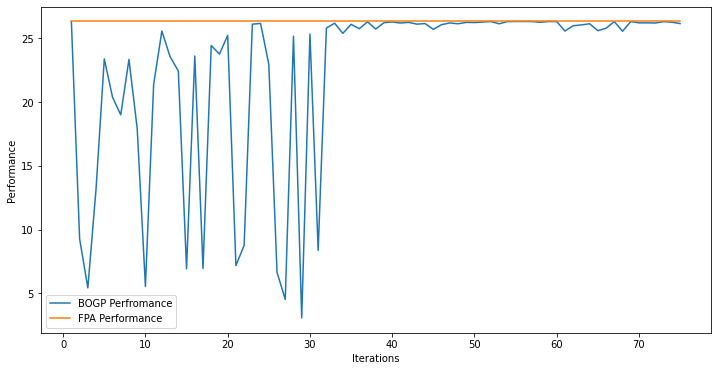

x_next is [-4.89150995e-02 -5.60102290e-01 -9.41020393e-02 -2.96391071e-02
 -2.45536549e-02 -4.65787002e-02 -2.23600191e-01 -1.41585183e-01
 -2.06960006e-01 -4.07715275e-02 -3.09053305e+01 -2.38794213e-02
 -3.17502916e-01 -1.83876371e-01 -1.22255781e-01 -8.10535588e-02
 -1.80481030e-01 -1.20580497e-01 -6.34217581e-02 -6.02656416e-02]
f()=26.086099, actual=26.064
74


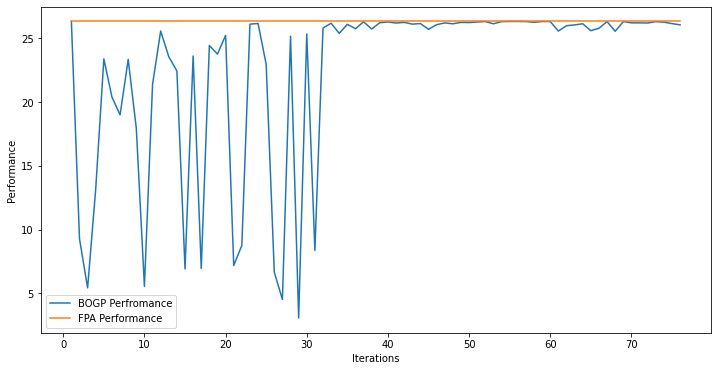

x_next is [-0.01136441 -0.00666295 -1.01478669 -0.01675129 -0.06923933 -0.09613641
 -0.14768249 -0.07581177 -0.34192781 -0.0162815  -0.04259007 -0.01054965
 -0.0255841  -0.09842924 -0.00671491 -0.1686378  -0.11867006 -0.08400995
 -0.02714843 -0.08547879]
f()=26.164147, actual=26.157
75


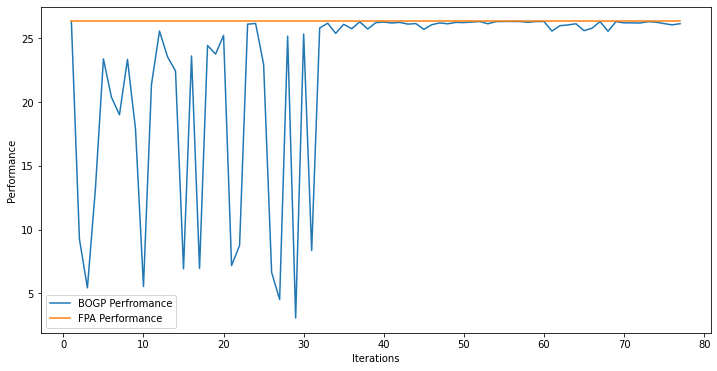

x_next is [-0.06464297 -0.20990003 -0.16087862 -0.02584432 -0.01138796 -0.03228037
 -0.08696375 -0.00981791 -0.38068837 -0.10672156 -1.63040435 -0.17075609
 -0.01105621 -0.12388861 -0.28968807 -0.01390227 -0.0691142  -0.11041938
 -0.09381553 -0.17865597]
f()=26.122189, actual=26.136
76


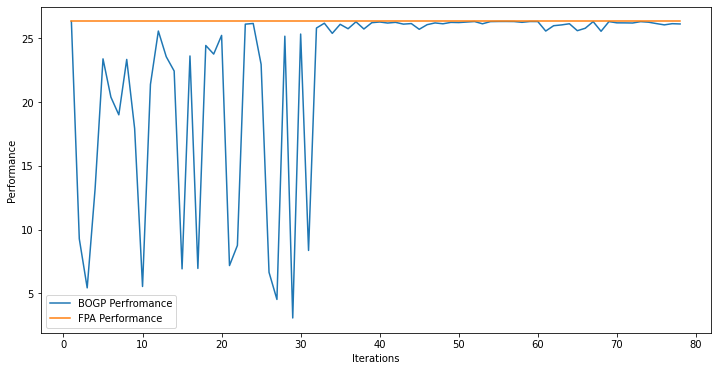

x_next is [-1.70691966e-02 -9.67572741e-01 -2.15389636e-01 -2.90682431e-02
 -1.04725977e-02 -1.34619293e-01 -5.94461210e-02 -3.12479674e-02
 -1.38209532e-01 -4.75456183e-02 -4.52649994e+00 -7.04550564e-02
 -1.90590784e-03 -3.51437055e-01 -6.61952714e-02 -1.00449029e-01
 -5.85265402e-02 -7.60224356e-03 -2.89899586e-04 -2.55775662e-02]
f()=26.206833, actual=26.180
77


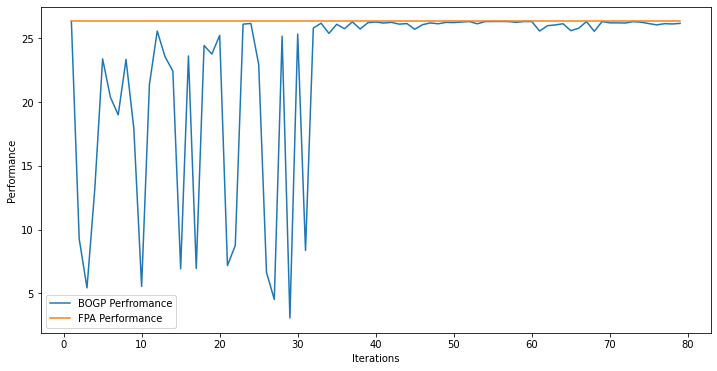

x_next is [-1.17563785e-01 -3.30255570e-01 -3.56888046e-01 -2.65956779e-01
 -6.86972897e-03 -2.53181469e-01 -7.32756041e-01 -3.19334368e-01
 -3.09756290e+01 -6.97574028e-02 -3.02005138e+01 -2.78541222e-01
 -9.29346336e-07 -9.32537942e-07 -2.11016813e-01 -1.04225664e-01
 -2.12711905e-01 -1.43537475e-02 -9.59485365e-02 -1.78192779e-02]
f()=25.953718, actual=25.913
78


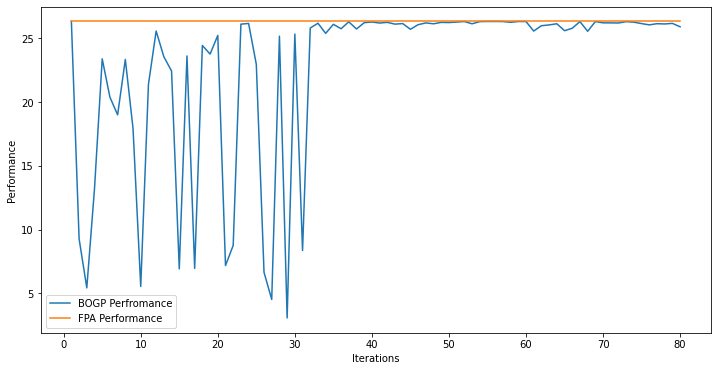

x_next is [-3.77228674e-02 -5.57645725e-01 -3.04224845e+01 -4.28559418e-02
 -8.02676778e-03 -4.87082416e-02 -3.98191372e-02 -2.39386097e-01
 -6.43564199e-01 -1.25470491e-01 -3.09049784e+01 -3.12943696e-01
 -2.14281639e-01 -2.48999609e-02 -1.50378970e-01 -1.12350525e-01
 -7.95406597e-02 -3.12020967e-02 -9.94759068e-02 -7.67279659e-02]
f()=26.013835, actual=26.010
79


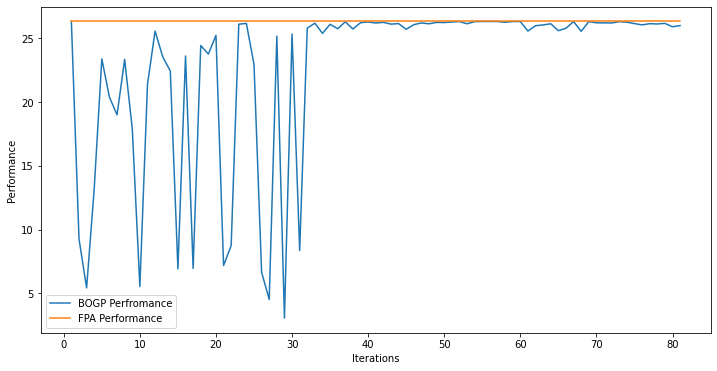

x_next is [-0.04332101 -0.16511596 -0.32898478 -0.30354367 -0.03801434 -0.08487827
 -0.11823722 -0.18865161 -0.49954532 -0.09900512 -0.08921604 -0.08388971
 -0.15878471 -0.0586658  -0.00548906 -0.11674517 -0.09569275 -0.04688773
 -0.0784665  -0.03174966]
f()=26.105058, actual=26.098
80


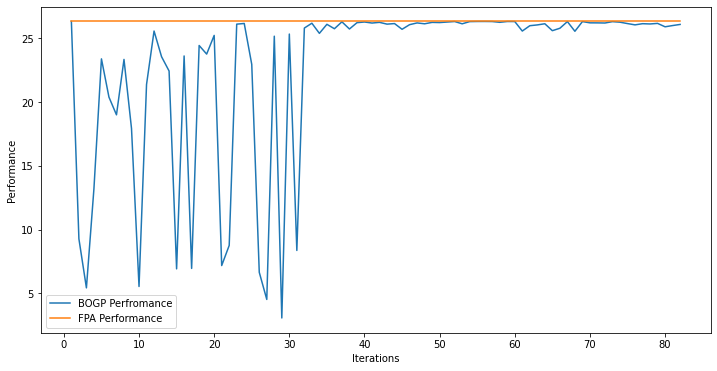

x_next is [-4.54301272e-03 -1.21822333e-01 -3.87450567e-01 -3.48500320e-04
 -1.23372735e-01 -5.28540106e-02 -3.76935215e-01 -1.63166915e-03
 -1.25053241e-02 -8.61646550e-02 -2.95129696e+01 -9.16938500e-02
 -2.52775731e-02 -9.78081441e-02 -3.78409515e-01 -8.93277770e-02
 -5.72722479e-03 -3.13198524e-01 -2.97848650e-02 -7.57061459e-02]
f()=26.079411, actual=26.099
81


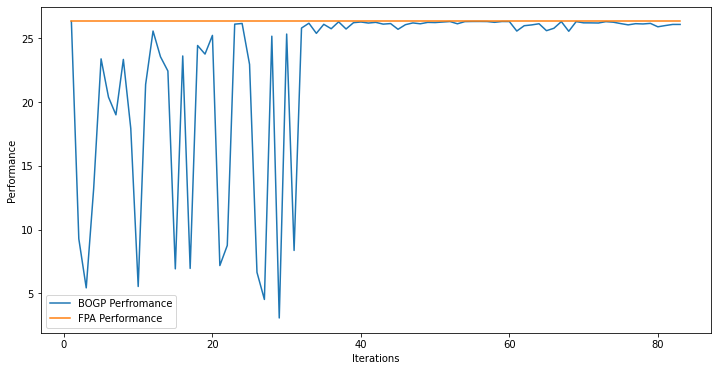

x_next is [-20.97089148  -3.56070307 -26.13289967 -16.37196912 -27.90979163
 -30.68568224 -22.76370819 -26.29746197  -2.67803148 -28.03107572
 -25.62465619  -0.6991394  -30.48690131 -12.56635882 -30.78475949
  -0.71518581 -28.72132609  -5.9256189  -29.17961427 -16.0320357 ]
f()=22.745102, actual=5.139
82


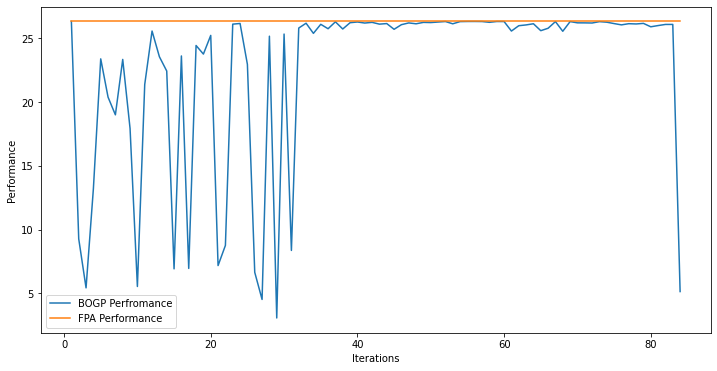

x_next is [-0.14490894 -0.23299591 -0.3578535  -0.18653015 -0.04208771 -0.05014936
 -0.16256998 -0.2423887  -0.61079282 -0.11472496 -0.10584516 -0.09041071
 -0.1263924  -0.13781629 -0.3838143  -0.04362303 -0.06164016 -0.06862522
 -0.20943473 -0.11076087]
f()=26.016565, actual=26.031
83


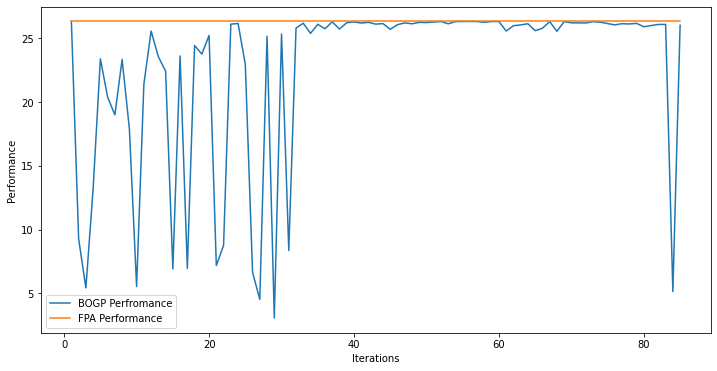

x_next is [-1.47987387e-02 -9.31964923e-01 -4.09238540e-01 -5.32813796e-02
 -1.97717443e-03 -4.09028947e-02 -1.02471038e-01 -3.10416551e-02
 -2.21314588e-01 -1.09213157e-03 -2.51415487e+00 -9.34057283e-02
 -1.46275082e-01 -5.25396413e-02 -3.02176965e-01 -4.82861268e-02
 -4.93710343e-02 -1.11041258e-01 -1.75835786e-02 -5.84602040e-02]
f()=26.172697, actual=26.175
84


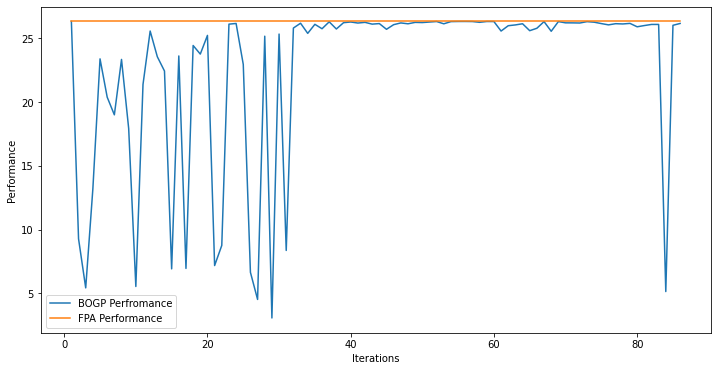

x_next is [-0.10212692 -0.45616029 -0.28043767 -0.10142022 -0.1015058  -0.05312587
 -0.08358976 -0.15877402 -0.73380814 -0.03527003 -0.16666429 -0.02848435
 -0.02033823 -0.24746561 -0.30076001 -0.01081227 -0.02010481 -0.02000991
 -0.00782052 -0.10083361]
f()=26.155403, actual=26.157
85


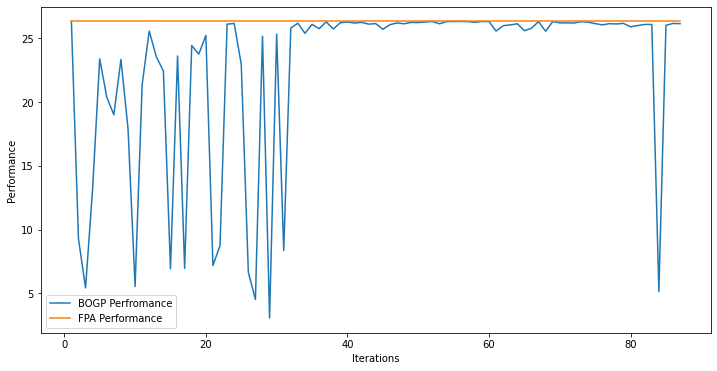

x_next is [ 0.          0.          0.          0.         -0.2036191   0.
  0.          0.          0.          0.         -2.35441064  0.
  0.          0.          0.          0.          0.         -0.00395062
  0.          0.        ]
f()=26.281770, actual=26.283
86


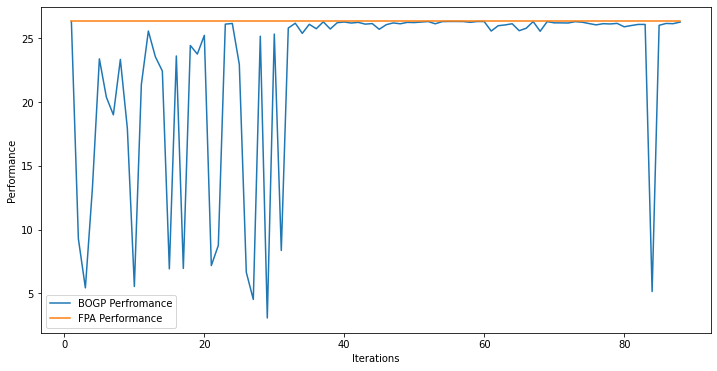

x_next is [-5.63573992e-02 -8.64730984e-01 -3.06180770e+00 -8.97470754e-02
 -5.77017525e-02 -3.08037695e-02 -7.84783352e-02 -1.72255566e-01
 -4.78456485e-02 -2.67643988e-02 -5.39121978e-01 -3.90420829e-01
 -3.04168176e-02 -3.16386701e-01 -4.46835817e-01 -1.69632725e-01
 -1.62323573e-01 -1.17212318e-01 -2.71628072e-03 -2.16383347e-02]
f()=26.058714, actual=26.066
87


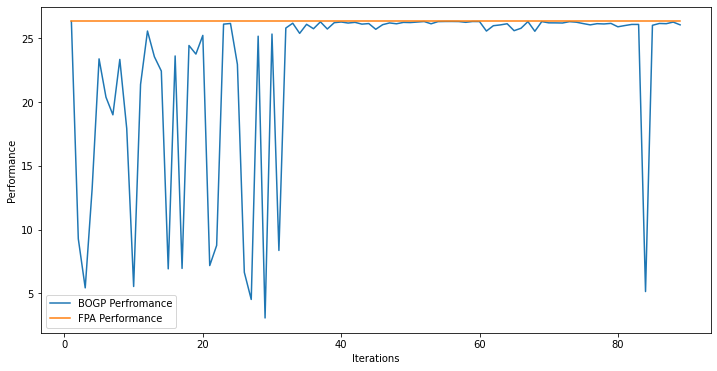

x_next is [-18.70424798 -17.83383726  -2.00092762 -12.00276201 -28.90973095
  -9.83290685  -5.65967494 -29.6305458  -17.55881001 -24.18724308
 -22.49597281 -10.06608867 -23.03107887 -17.89295133 -17.77279011
  -6.3641256  -13.38095648  -0.37615733 -30.43845955  -3.04242183]
f()=22.737571, actual=6.584
88


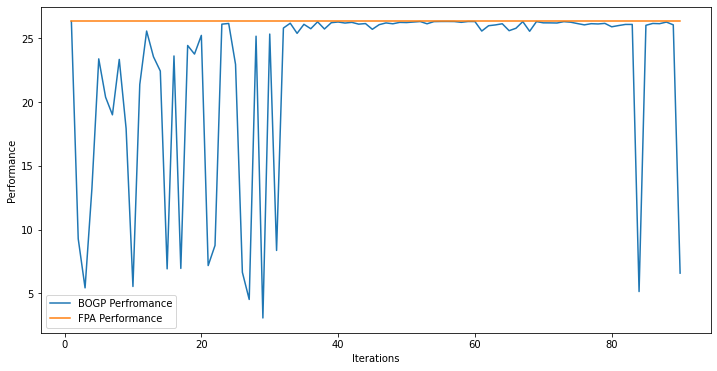

x_next is [-8.59505963e-10 -1.71870030e-01 -2.44181289e+00 -2.86649095e-08
 -1.96539856e-08 -2.30442464e-12 -3.96512913e-09 -1.89074468e-09
 -1.38285239e+00  0.00000000e+00 -4.33838366e-12 -1.46045082e-09
 -2.97284842e-10 -1.37519968e-08 -1.06563945e-08 -9.75082311e-10
 -3.85739289e-04 -2.19807365e-09 -1.04555469e-09 -6.64803668e-09]
f()=26.293959, actual=26.297
89


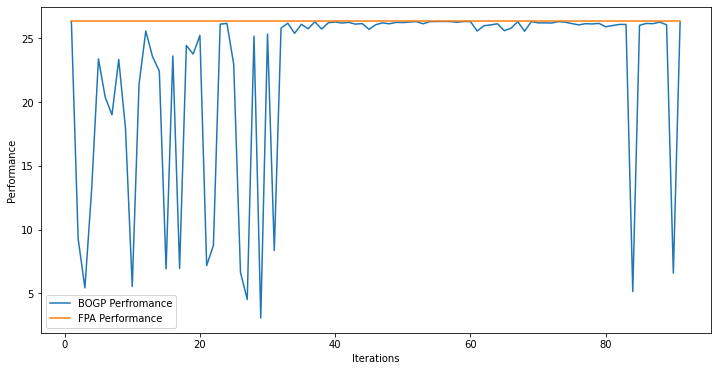

x_next is [-4.52656477e-07 -7.65645125e+00 -1.15933057e-06 -9.99653617e-08
 -1.44251919e-07 -4.49083060e-08 -1.72625492e-04 -5.16339090e-07
 -2.03653847e-05 -1.00609018e-06 -7.61215140e-07 -9.07130120e-05
 -1.07055472e-07 -3.48119036e-07 -2.14441300e-07 -3.76792425e-07
 -5.00934243e-05 -3.78045151e-05 -2.86561984e-07 -2.26112058e-07]
f()=26.337063, actual=26.252
90


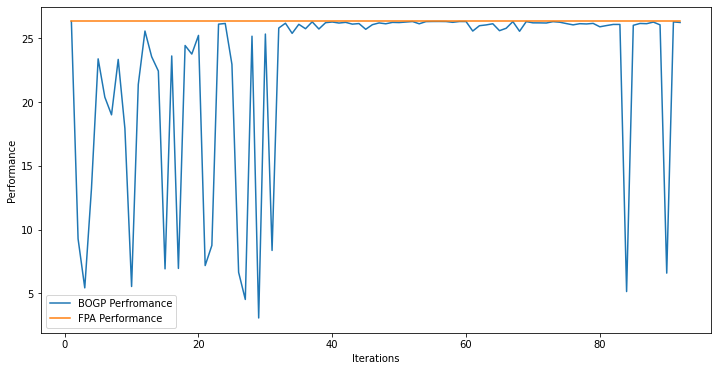

x_next is [ -0.14249197 -21.198531    -0.80493495 -24.20359052 -29.15546229
  -6.84984241 -30.76631452 -13.91226477 -18.76295448 -23.3728935
  -9.09736711  -9.88005602 -25.95093565 -14.67323655 -17.32476085
 -16.52856773  -3.01416355  -0.67334897  -0.14450821 -12.71255342]
f()=22.638017, actual=8.618
91


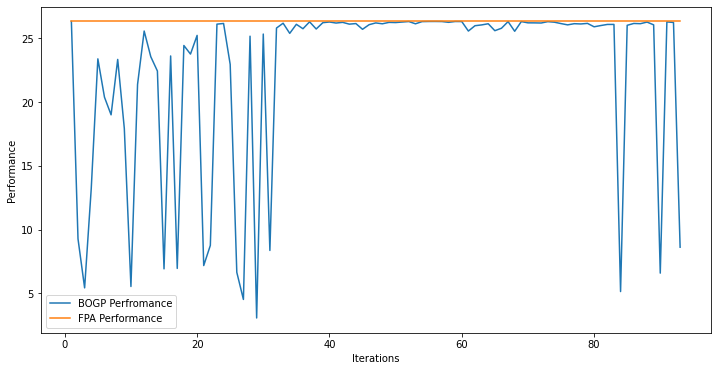

x_next is [  0.          -7.99204739   0.           0.           0.
   0.           0.           0.         -31.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.        ]
f()=26.448820, actual=26.210
92


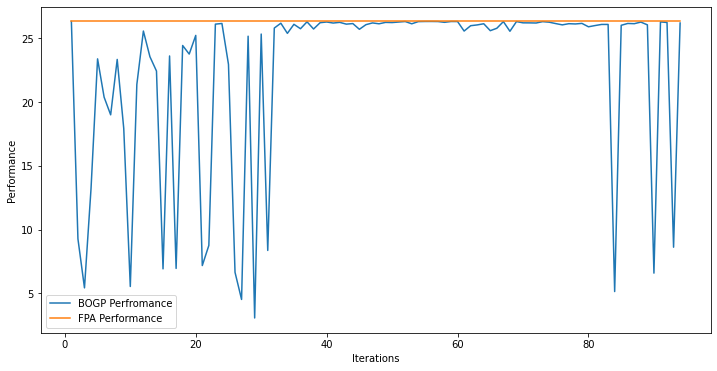

x_next is [-5.61241071e+00 -1.15473401e+01 -2.03051264e+01 -1.32599081e+01
 -2.66598889e+01 -2.34224361e+01 -7.17571442e+00 -2.61006116e+01
 -6.18315282e+00 -2.36949986e+01 -2.34811270e+01 -2.14758431e-02
 -6.49687713e+00 -2.28437693e+00 -2.31647799e+01 -2.18177655e+01
 -1.85389379e+01 -2.55495022e+01 -2.57955095e+01 -1.40382456e+01]
f()=22.526183, actual=3.927
93


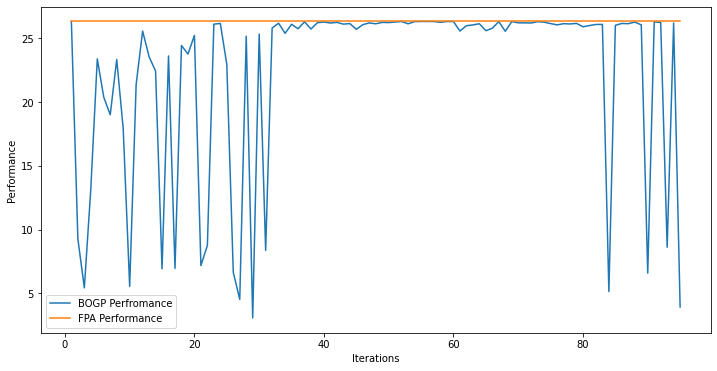

x_next is [-0.15117227 -0.66977847 -0.23521241 -0.18040265 -0.06521573 -0.0403696
 -0.07234688 -0.25424628 -0.69782267 -0.02008301 -2.76468653 -0.18066886
 -0.08273271 -0.02577804 -0.55254804 -0.06916919 -0.00431874 -0.06983617
 -0.03540869 -0.16339181]
f()=26.066203, actual=26.066
94


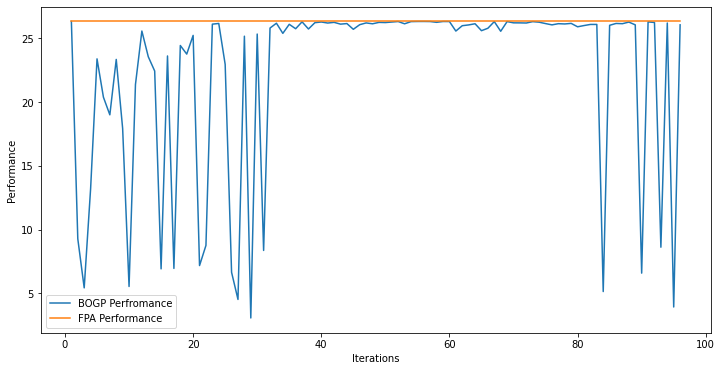

x_next is [ -3.89075857 -17.74939276  -3.30588366 -24.89140829 -17.82824087
  -7.50987048  -8.50213473 -14.66615729 -22.02307626  -0.81678153
  -7.15771829 -15.78810824  -4.50242251 -21.28433535 -29.09311503
 -21.41427607 -23.51616319  -6.028807   -12.66658394 -30.20012989]
f()=22.367889, actual=6.516
95


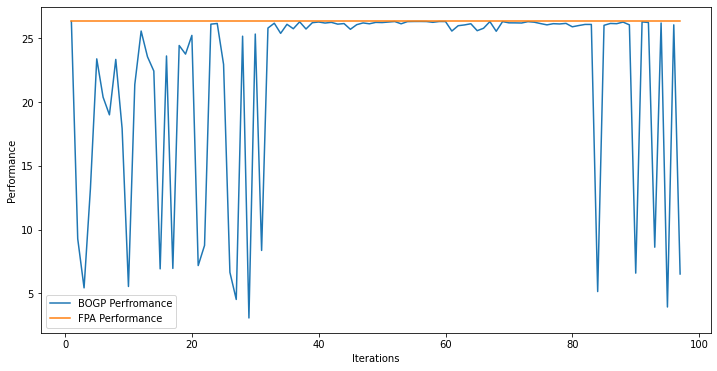

x_next is [-0.04045296 -0.0324622  -0.14175865 -0.10151946 -0.16480816 -0.0273752
 -0.0782639  -0.01026573 -0.03013717 -0.00197096 -1.07097753 -0.01038443
 -0.07038761 -0.41431617 -0.38372702 -0.02793101 -0.0347467  -0.03322817
 -0.04450191 -0.00935383]
f()=26.191424, actual=26.194
96


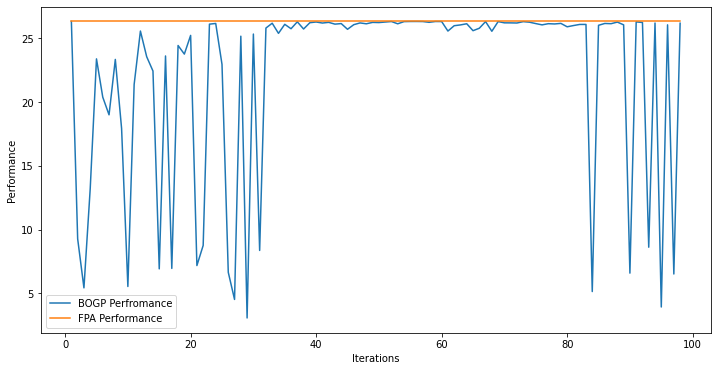

x_next is [-3.63274849e-02 -1.87019063e-01 -5.21407125e-01 -6.12985522e-02
 -1.85860480e-01 -5.05179349e-02 -6.63806077e-01 -1.08063620e-01
 -1.63689655e+00 -1.01032486e-01 -2.67891716e-01 -2.91076202e-01
 -1.34532688e-01 -5.47813780e-02 -3.63561310e-01 -1.07186196e-02
 -4.03977899e-02 -3.99992693e-02 -1.02604714e-03 -4.89713824e-04]
f()=26.081231, actual=26.085
97


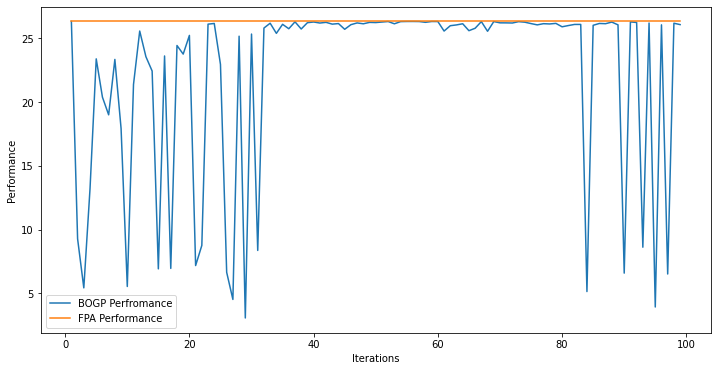

x_next is [-0.16654606 -0.09736656 -1.31220502 -0.13584412 -0.2318867  -0.09148098
 -0.01221689 -0.01525083 -0.66268131 -0.09855937 -0.19440089 -0.04394868
 -0.04053254 -0.12650437 -0.15425382 -0.11514524 -0.0186465  -0.00314032
 -0.08635299 -0.00980213]
f()=26.111564, actual=26.111
98


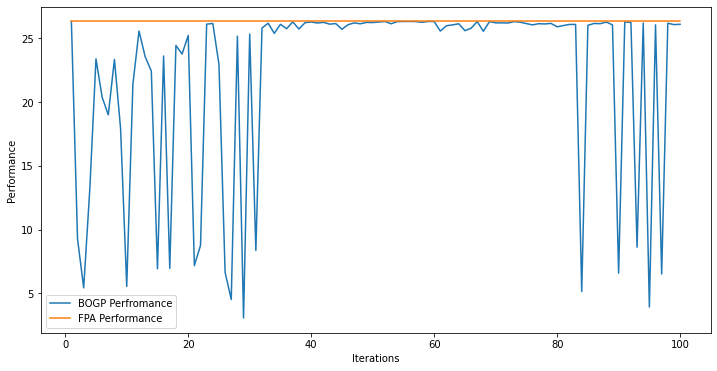

x_next is [-0.00728811 -0.18313252 -0.20747482 -0.02048942 -0.07234041 -0.03266025
 -0.09585847 -0.00922667 -0.41698363 -0.0191979  -0.01174639 -0.12572359
 -0.08213334 -0.02162998 -0.19332701 -0.02788474 -0.22982035 -0.09191503
 -0.09087446 -0.15474285]
f()=26.144071, actual=26.143
99


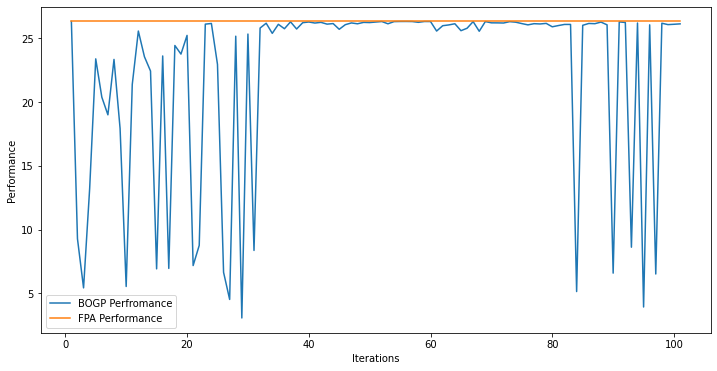

x_next is [-1.02144675e-04 -1.07536429e-04 -5.15054605e-02 -3.97566396e-01
 -1.64697138e-04 -1.05273587e-04 -7.16786415e-05 -1.11510264e-04
 -1.17421489e-04 -3.49165004e-09 -7.30581092e-09 -5.98341103e-05
 -1.60812616e-04 -1.27487873e-04 -7.77821647e-05 -5.61929983e-05
 -1.59721944e-04 -1.06112386e-04 -1.04996335e-04 -5.78587502e-05]
f()=26.299372, actual=26.297
100


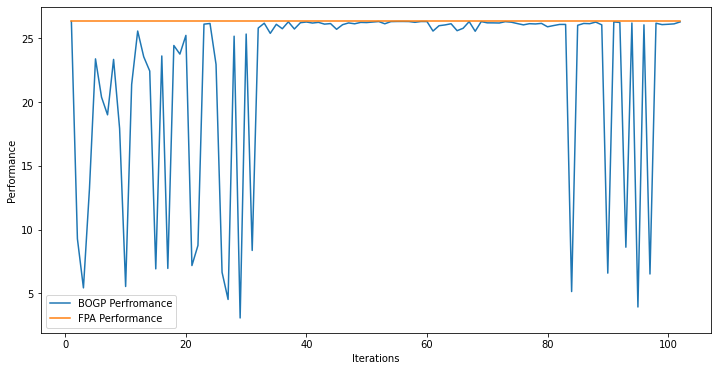

x_next is [-1.84094296e-05 -1.14542251e-04 -1.74019413e-04 -4.89427278e-05
 -1.10154964e-04 -5.57151292e-05 -9.62129049e-05 -9.73378298e-05
 -2.58910528e-04 -2.19902363e-05 -1.65233820e-04 -1.87800944e-04
 -7.02269951e-05 -8.41373318e-05 -1.32646022e-04 -3.80953175e-04
 -2.51969117e-04 -3.28072781e-06 -4.74461010e-05 -9.84163525e-05]
f()=22.398636, actual=26.331
101


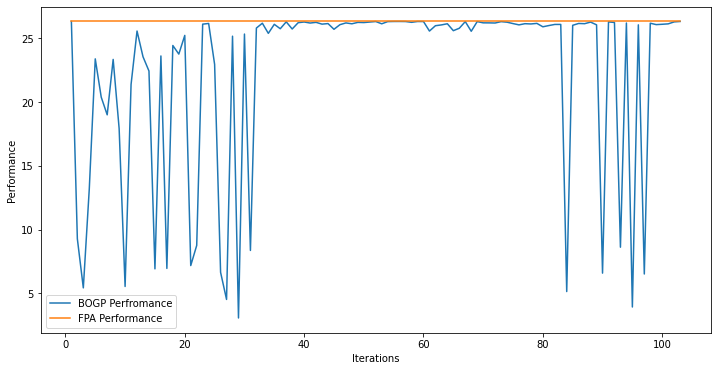

x_next is [ -1.29205636  -0.51913772 -30.6468388   -0.4090219   -0.09484373
  -0.56597877  -0.88246889  -0.10623931  -0.28115509  -0.38854569
 -29.40017961  -0.83398418  -0.51417006  -0.45647516  -0.62797637
  -0.05049804  -1.16737725  -0.45556909  -0.09376328  -0.26313726]
f()=25.273779, actual=25.118
102


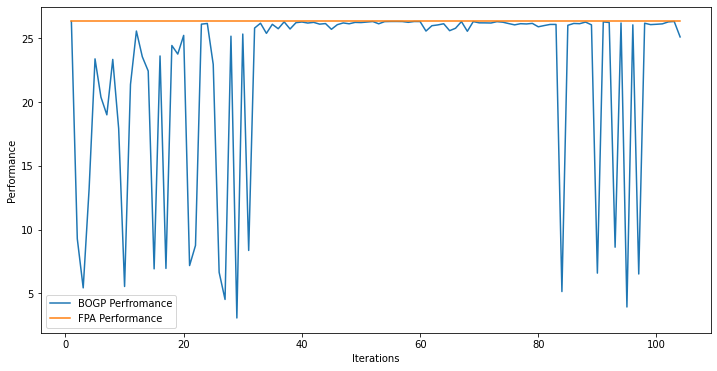

x_next is [-5.53045919e-02 -1.09598917e+00 -8.86867125e-01 -1.46683205e-01
 -2.31960282e-01 -3.74014913e-03 -4.65530026e-01 -6.84540261e-02
 -8.12126418e-01 -3.88180481e-02 -3.74480818e+00 -1.24144629e-01
 -1.99182345e-01 -1.24673670e+00 -1.66762706e-01 -2.10730114e-01
 -1.19462413e-01 -5.18332047e-01 -2.81516953e-02 -2.25137663e-02]
f()=25.913892, actual=25.920
103


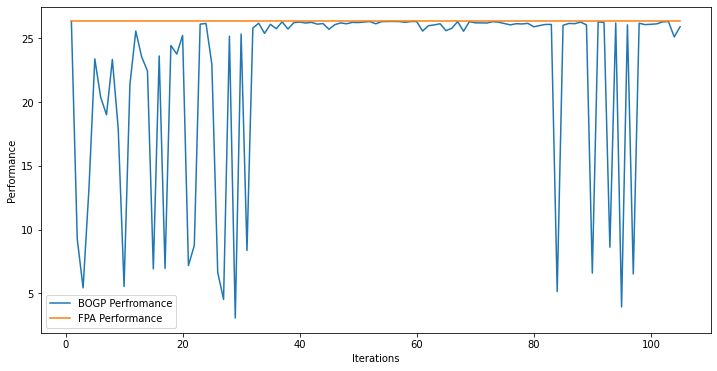

x_next is [-3.79447204e-03 -2.85110097e-01 -7.34604391e-01 -2.28608822e-01
 -6.82662324e-01 -2.33622917e-01 -3.01330446e-01 -3.21437745e-02
 -3.05222925e+01 -3.95716766e-01 -2.90551948e+01 -7.43403360e-01
 -7.83114659e-03 -2.44824700e-01 -2.06050918e+00 -3.83247818e-01
 -9.84205884e-03 -2.21342602e-01 -8.87454059e-02 -4.13797196e-02]
f()=25.618563, actual=25.675
104


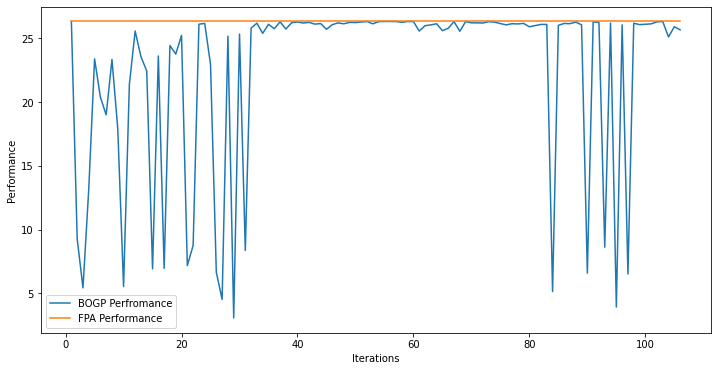

x_next is [-0.23703445 -0.8646941  -0.9408108  -0.49477973 -0.1655403  -0.15568131
 -0.01772114 -0.44100286 -2.60064414 -0.07011664 -2.96416724 -0.03063449
 -0.08585696 -1.10667638 -0.05392098 -0.1129467  -0.35893729 -0.03691144
 -0.36577787 -0.34411201]
f()=25.729327, actual=25.733
105


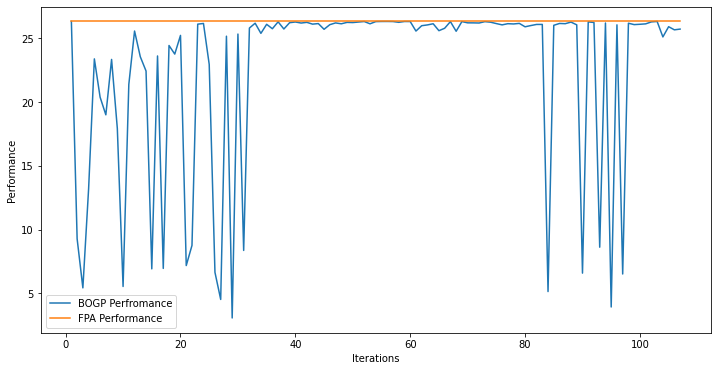

x_next is [-2.20022379e-21 -7.65484357e-01 -9.08034548e+00 -2.53983015e-07
 -3.48226598e-07 -2.22039110e-21 -2.53983015e-07 -2.81420241e-21
 -5.31606293e-01  0.00000000e+00 -2.53983015e-07 -2.49763868e-01
 -2.43045488e-02 -6.48256472e-01 -2.60601278e-07 -6.40216960e-09
 -2.53983015e-07 -2.53983015e-07 -6.01566174e-21 -2.53983015e-07]
f()=26.192332, actual=26.225
106


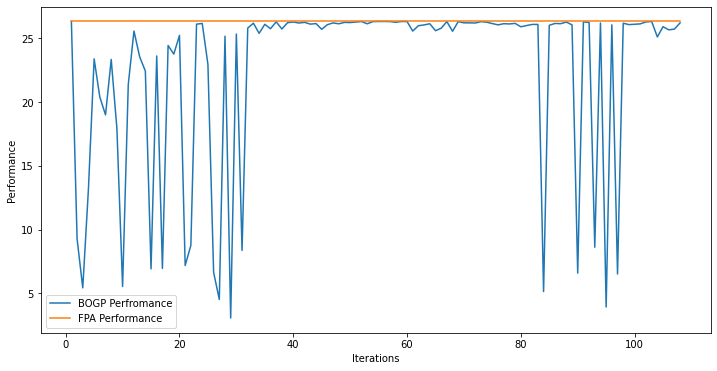

x_next is [-5.85486850e-02 -3.00929753e+01 -2.43586122e-02 -3.16336258e-01
 -1.17307485e-01 -3.30587082e-02 -6.08164340e-02 -2.30815242e-01
 -1.29154839e+00 -2.70961090e-01 -3.04853929e+01 -1.11047958e-01
 -4.55481470e-01 -8.61178790e-03 -8.62009651e-01 -3.33259562e-01
 -7.40739933e-02 -1.60558294e-01 -1.04744409e-01 -1.24146750e-01]
f()=25.765680, actual=25.775
107


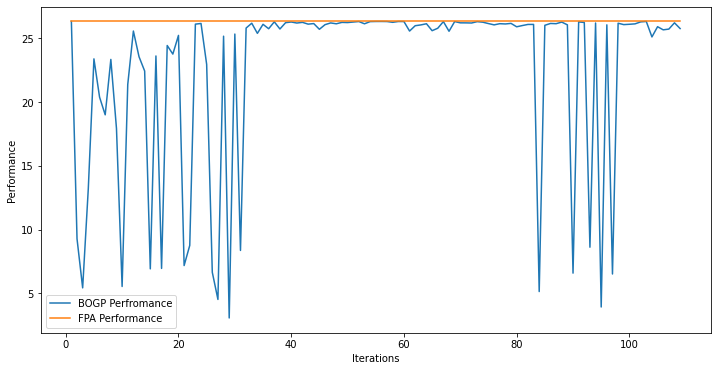

x_next is [-1.80508620e-02 -2.04787556e-01 -3.49711674e-01 -5.30448991e-02
 -4.93593563e-01 -6.39939026e-03 -2.00203120e-02 -2.09397817e-02
 -2.96086200e+01 -5.15446540e-03 -3.07130154e+01 -1.93740818e-03
 -7.99006840e-03 -1.04105817e-01 -3.08598955e+01 -4.58850069e-02
 -1.56840377e-01 -3.28418518e-01 -2.15748134e-03 -6.96358868e-03]
f()=26.122169, actual=25.892
108


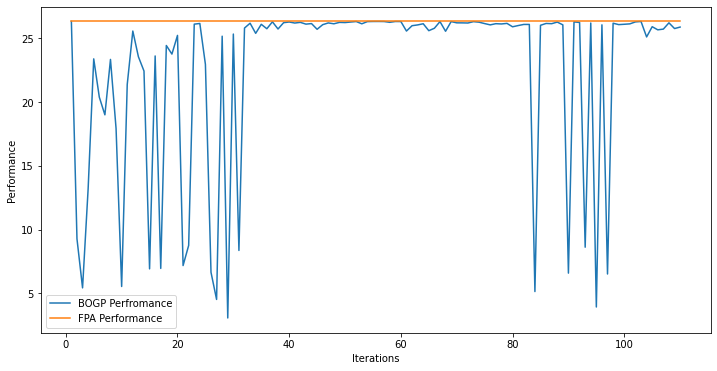

x_next is [-1.46002974e-03 -1.68059817e-01 -9.81183963e-01 -5.51404831e-01
 -4.81014966e-01 -7.75780571e-02 -8.71794540e-02 -1.40685316e-01
 -3.09596982e+01 -2.96860134e-01 -3.09160242e+01 -7.17292683e-01
 -4.10790325e-01 -1.00318022e-01 -3.03738072e-01 -2.66688565e-01
 -5.79810441e-01 -3.64986010e-01 -3.41606832e-01 -3.82385233e-02]
f()=25.672518, actual=25.583
109


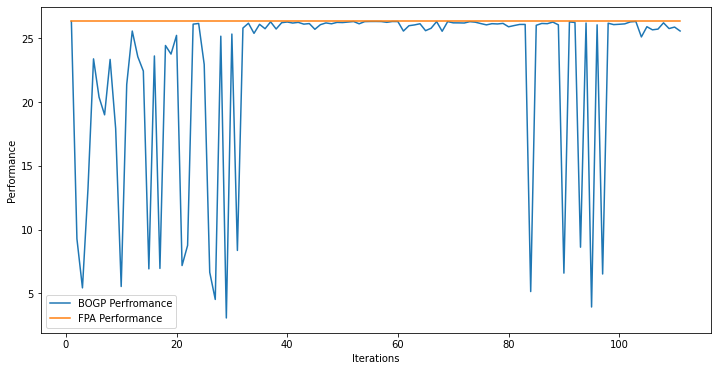

x_next is [  0.         -20.94304246 -24.11175405   0.           0.
   0.          -0.56572666   0.         -25.85683821   0.
  -7.58705366   0.           0.         -23.89036074   0.
   0.           0.          -1.27831247   0.           0.        ]
f()=26.609469, actual=25.727
110


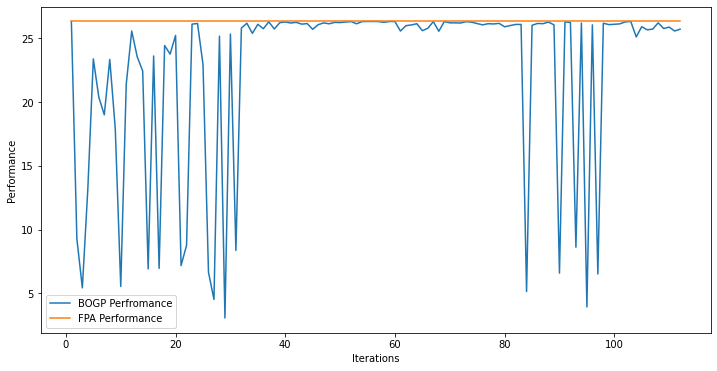

x_next is [-4.47396704e-02 -3.05506453e+01 -3.01373773e+01 -2.15935620e-01
 -6.15617166e-02 -3.24598414e-01 -6.52419003e-02 -1.17558630e-02
 -3.06372834e+01 -2.25200401e-02 -1.33033464e+00 -2.05750355e-01
 -2.40387109e-01 -3.09203793e+01 -3.67981749e-02 -9.95459390e-02
 -1.29501489e-01 -3.34823523e-01 -1.92720276e-01 -1.63301586e-02]
f()=26.365360, actual=25.660
111


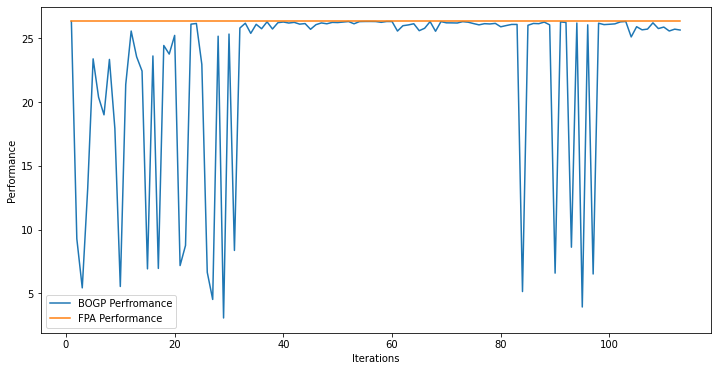

x_next is [-2.10492626e-04 -2.67559395e-05 -6.61710421e-04 -6.15618621e-05
 -1.21693225e-04 -3.28422782e-04 -1.15201414e-04 -1.03213593e-05
 -1.82862345e-04 -2.13821636e-04 -9.49858522e-05 -1.16438797e-04
 -1.70404867e-04 -7.96994303e-05 -1.27277052e-04 -2.03792434e-04
 -1.15629131e-04 -1.28997771e-04 -6.70967398e-05 -1.97518451e-04]
f()=22.730198, actual=26.331
112


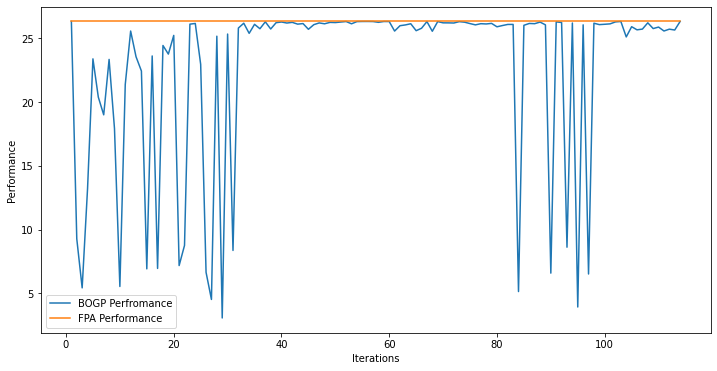

x_next is [-3.84048153e-04 -1.49812668e-01 -3.24167308e-04  0.00000000e+00
 -3.84149567e-04 -3.84048153e-04 -7.68096305e-04  0.00000000e+00
 -1.37709137e+00 -7.68246200e-04 -6.94265071e+00 -7.68098794e-04
 -5.16421422e-04 -7.08215461e-04 -5.16191384e-04  0.00000000e+00
 -3.84048153e-04 -1.39237488e-07  0.00000000e+00 -1.32143232e-04]
f()=26.287605, actual=26.295
113


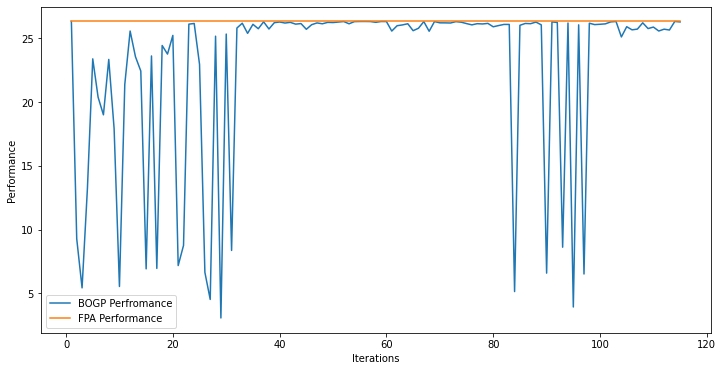

x_next is [-1.54210550e-01 -1.24291358e-01 -2.98062018e+01 -6.78128165e-02
 -2.57820178e-07 -1.65901763e-02 -2.85368541e-01 -3.08668140e-07
 -2.97639635e+01 -2.13574218e-02 -1.73224536e+00 -1.87973271e-07
 -2.58634457e-07 -3.05297012e+01 -7.38825445e-03 -4.35906486e-07
 -3.92609482e-02 -9.93139865e-07 -2.56402942e-07 -8.59431692e-07]
f()=26.126172, actual=25.973
114


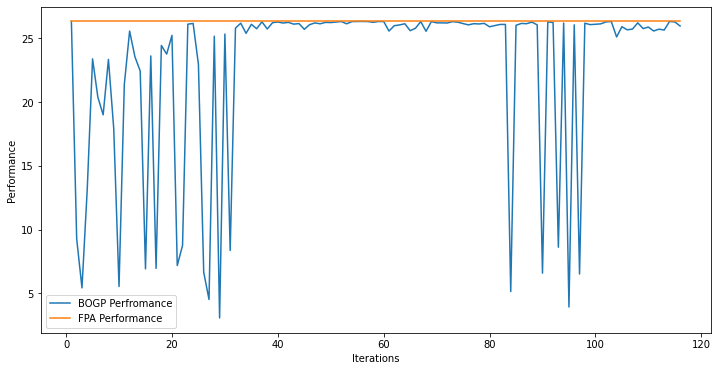

x_next is [-1.27047077e-08 -1.62371540e+00 -1.42553410e-08 -1.25038018e+00
 -1.47143327e-08 -1.27035596e-08 -1.27041905e-08 -1.47150743e-08
 -2.16491855e-02 -1.47151427e-08 -8.20894038e-01 -1.89507265e-12
 -1.27036496e-08 -1.95701233e-08 -1.98112639e-02 -1.27041977e-08
 -1.80312768e-08 -1.27038660e-08 -7.33897601e-09 -1.47137455e-08]
f()=26.191119, actual=26.173
115


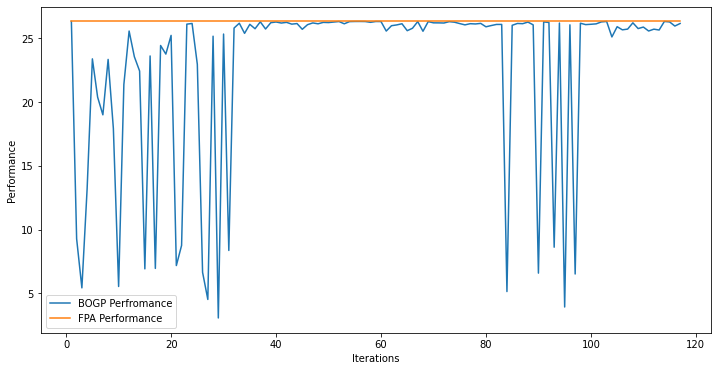

x_next is [-7.39557333e-05 -8.49161899e-05 -9.58708448e-05 -3.19817582e-05
 -5.36756788e-05 -2.51733057e-05 -3.44075400e-04 -6.54439808e-05
 -3.29358510e-06 -4.34137098e-04 -1.03329454e-04 -2.45352846e-04
 -7.91827257e-05 -3.77685438e-06 -7.21399407e-06 -1.92310670e-04
 -1.37556608e-04 -1.53265551e-04 -2.84539226e-04 -4.08866786e-05]
f()=22.849135, actual=26.331
116


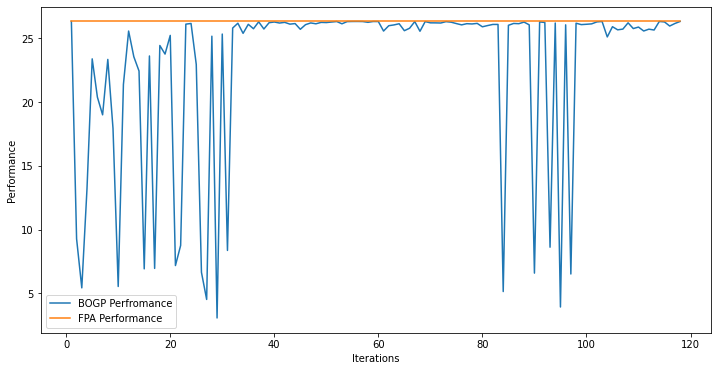

x_next is [-1.54615195e-01 -1.13852866e+00 -2.19977039e+00 -5.02146527e-02
 -3.59096734e-01 -8.06344180e-02 -4.92272832e-02 -1.75508207e-01
 -2.54773727e-01 -2.57764860e-01 -3.74834160e+00 -9.50623959e-02
 -4.90881497e-01 -2.80692765e-01 -7.38176882e-01 -2.21862493e-02
 -1.28315808e-01 -4.73354645e-01 -1.97526645e-03 -4.00615600e-01]
f()=25.786577, actual=25.782
117


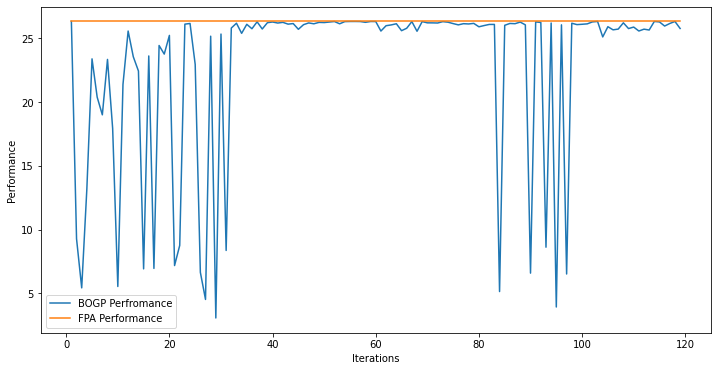

x_next is [-20.88750733  -0.14061655  -7.05780103 -10.22646505 -20.75986137
 -24.73508506  -6.3405754  -18.61572841  -9.00997578 -14.56293412
 -30.45252354  -7.40354637  -7.51249394 -14.75484076 -30.4090355
 -24.7127437  -24.66564043 -24.98447678 -26.15761708  -7.83073783]
f()=22.903304, actual=4.037
118


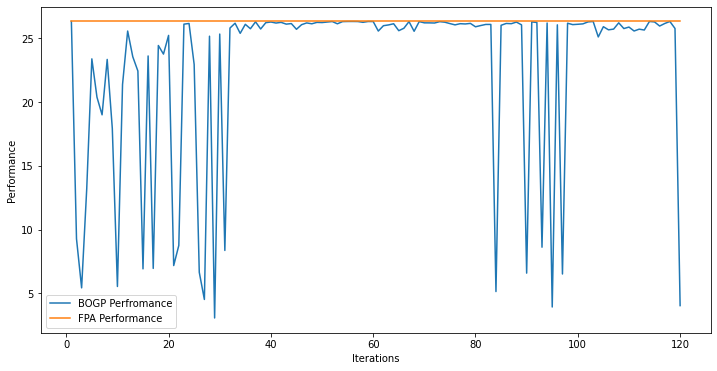

x_next is [-19.5293775   -7.28524454 -28.9491503  -17.4695228  -25.31799806
 -20.30603127 -21.44880769  -2.98353645  -6.34675597 -24.12941433
 -15.30494073  -8.89569098 -20.64382744 -30.44597955 -14.30672178
  -5.2903891  -27.45860371 -22.44524608  -5.78761256 -16.37892861]
f()=22.745019, actual=6.040
119


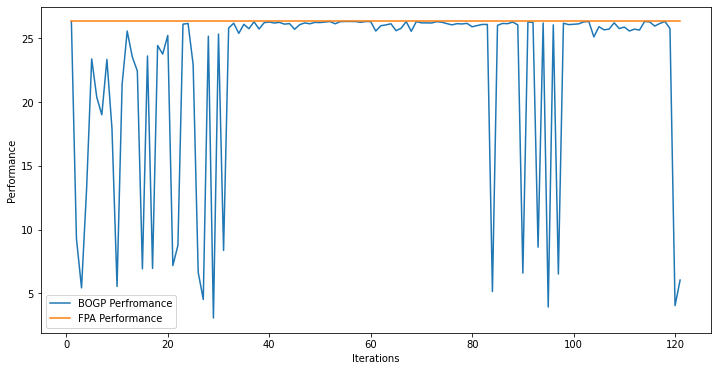

x_next is [-1.45594584e-01 -7.15465692e-01 -3.01748038e+01 -1.28254518e-01
 -1.17122506e-01 -1.64182745e-01 -2.31111648e-01 -2.28834421e-01
 -3.07880104e+01 -1.49644954e-01 -3.09285264e+01 -3.31588002e-01
 -6.32741702e-02 -3.06922868e-01 -6.88788561e-02 -1.12607292e-01
 -5.54739214e-02 -1.14772396e-01 -2.49941897e-02 -1.68370125e-01]
f()=25.903277, actual=25.881
120


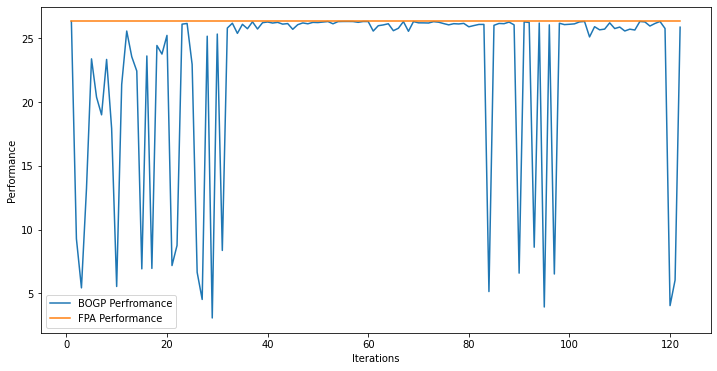

x_next is [-7.49174742e-04 -4.30769902e-03 -1.04162900e-01 -1.38621161e-03
 -1.63234498e-03 -2.41291480e-03 -5.21754597e-03 -6.63696746e-03
 -9.35399828e-04 -6.42855043e-04 -1.55874734e-01 -1.98955721e-02
 -1.44609475e-02 -8.08620482e-03 -1.33681380e-02 -6.78355815e-04
 -1.49129849e-06 -2.38893416e-03 -4.98020543e-03 -1.04121107e-06]
f()=26.320607, actual=26.320
121


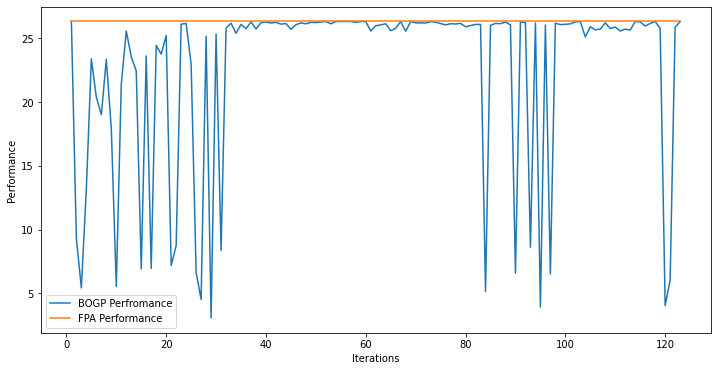

x_next is [-0.08185386 -0.52102449 -0.24621795 -0.00330902 -0.0555523  -0.09046087
 -0.05403617 -0.05366045 -0.03599081 -0.11562493 -0.23385276 -0.27630352
 -0.07259889 -0.02017862 -0.63462803 -0.04928262 -0.03383516 -0.01843044
 -0.00578185 -0.04475896]
f()=26.147599, actual=26.149
122


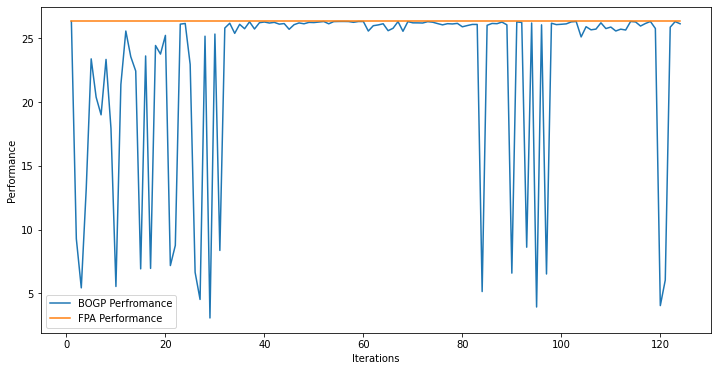

x_next is [-1.67469170e+01 -6.86276234e+00 -1.19755181e+01 -2.26833825e-02
 -2.73651728e+01 -2.34968783e+01 -2.77549219e+01 -9.85311865e+00
 -1.60198944e+01 -1.52119113e+01 -2.10377214e+01 -1.04570790e+01
 -1.45712556e+01 -2.37716203e+01 -1.39237716e+01 -1.85367846e+01
 -2.70790262e+01 -5.39854945e+00 -1.36836068e+01 -1.00770282e+01]
f()=6.885031, actual=6.919
123


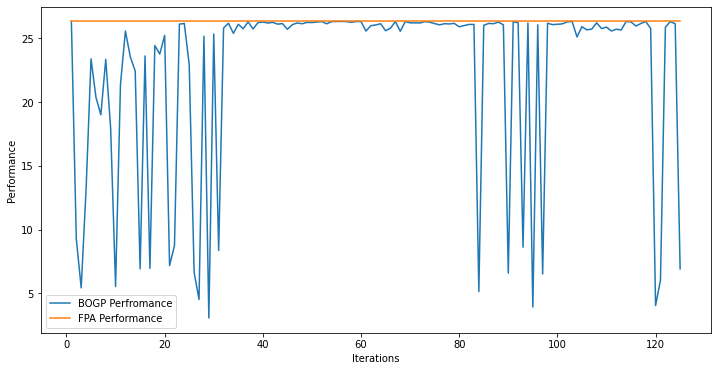

x_next is [-1.06877657e-01 -2.70873470e+01 -2.89185425e+01 -3.86951347e+00
 -1.32952956e+00 -9.82423747e-03 -7.11357718e-01 -3.25864366e+00
 -3.09467863e+01 -1.37282363e+00 -3.05556351e+01 -6.50892609e-01
 -8.13075772e-01 -2.72878192e+01 -1.76212075e-01 -1.86298106e-01
 -2.23691624e+00 -7.14989804e-01 -3.98423202e-01 -6.50260528e-01]
f()=23.972907, actual=23.417
124


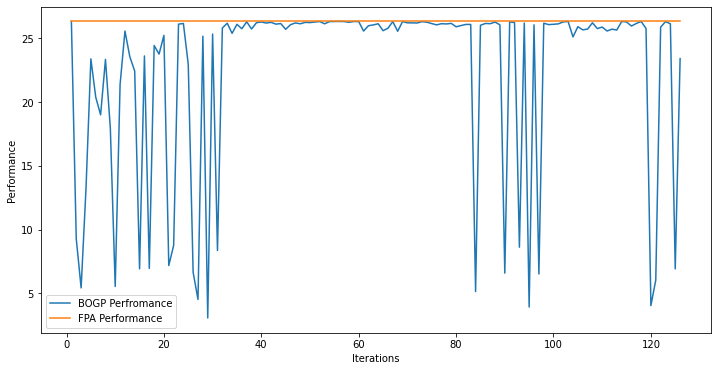

x_next is [-1.45238374e-06 -1.63929555e+00 -1.25928700e+00 -1.56664974e-06
 -2.25064702e-07 -2.46780097e-01 -3.14955997e-01 -8.07558386e-07
 -1.22289575e+00 -7.75584495e-07 -1.03712599e+01 -1.26832170e-06
 -3.64602868e-02 -4.42290881e-01 -2.88467609e-08 -7.91688338e-07
 -2.43339165e-07 -1.96514676e-07 -4.14724253e-01 -1.42589444e-06]
f()=26.044427, actual=26.064
125


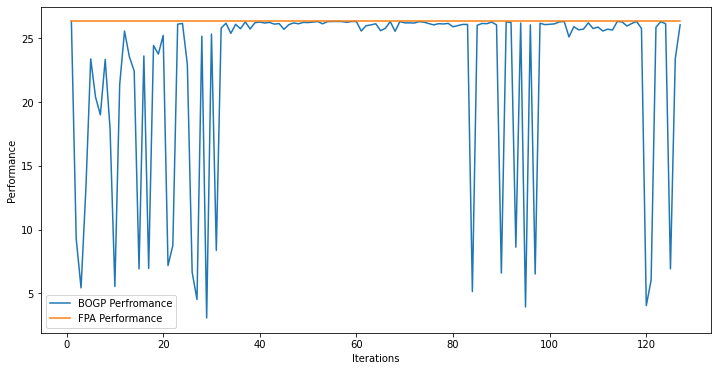

x_next is [ -0.27173054  -5.36288821  -5.64192866  -4.19155878  -3.45907822
  -6.14937309  -1.22063764  -6.15981571 -30.42784326  -4.98624577
  -0.86188018  -6.9496219   -6.70828896 -29.56902832  -5.38386259
  -2.50022317  -1.62827023  -0.14172778  -0.89080873  -0.22524009]
f()=20.384966, actual=19.769
126


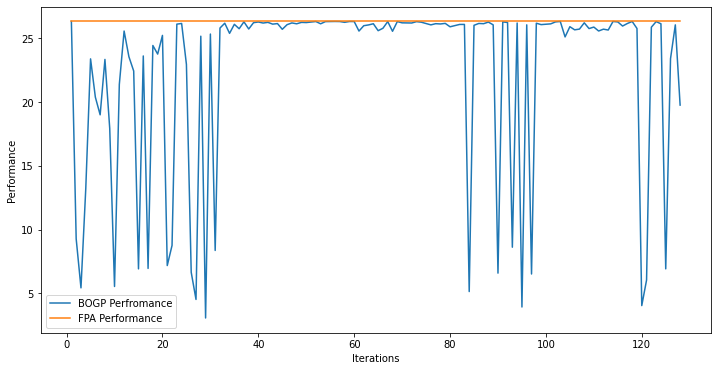

x_next is [-21.01138724 -16.41572656  -5.08711046 -22.2401595  -12.12757513
  -2.54630849 -23.94223384 -13.29243988 -13.93753812  -4.59729429
  -8.02850741 -14.16568841  -6.83133732  -7.13355163 -19.53916952
 -11.81967061 -21.16814696 -16.91987508  -2.98534311  -3.4938579 ]
f()=22.577184, actual=9.022
127


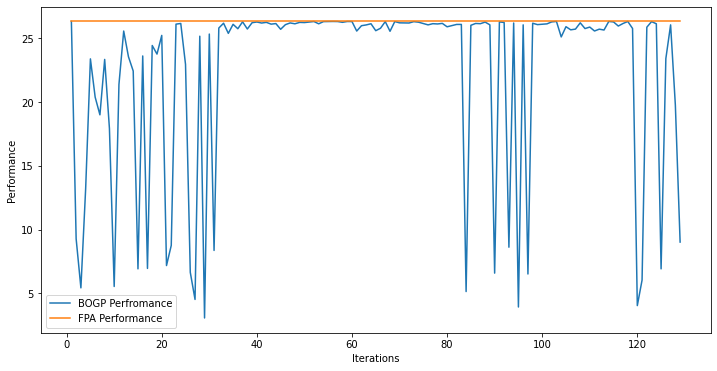

x_next is [ 0.00000000e+00  0.00000000e+00 -8.63881709e-09 -1.07170915e-05
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -2.83117582e+00  0.00000000e+00
 -2.04574766e-08  0.00000000e+00  0.00000000e+00 -1.01229041e-08
 -4.34137060e-06 -2.02351312e-02  0.00000000e+00  0.00000000e+00]
f()=26.315449, actual=26.316
128


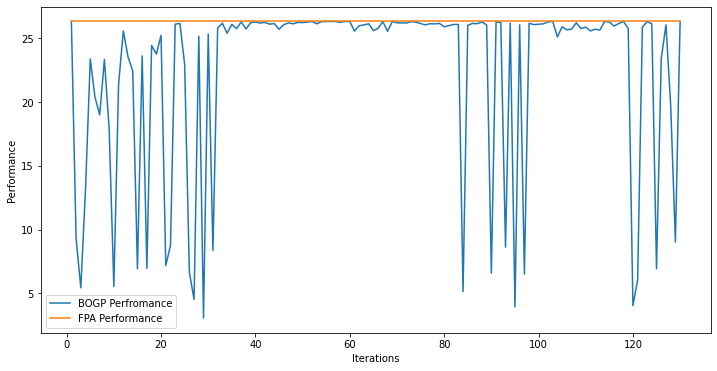

x_next is [-4.81159540e-03 -1.28862453e-01 -6.53253149e-01  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -8.29336280e-13  0.00000000e+00  0.00000000e+00]
f()=26.321168, actual=26.321
129


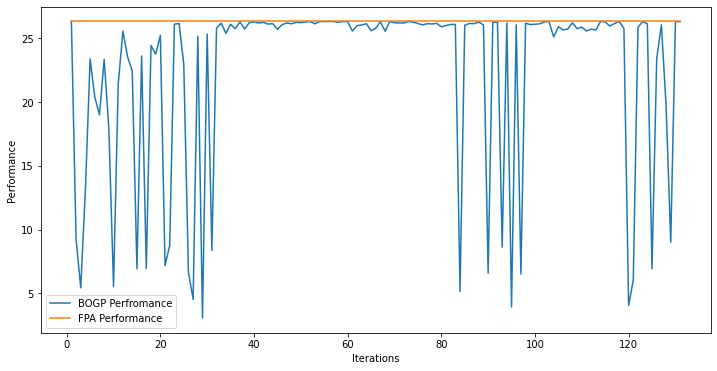

x_next is [-3.62320127e-06 -8.35835671e-01 -2.93799888e+00 -5.77577017e-06
 -1.13298004e-07 -9.87854784e-08 -1.83148999e-06 -1.81485529e-01
 -1.60958288e+00 -9.87854784e-08 -5.71256982e-06 -3.81195636e-06
 -9.88095845e-08 -1.88104039e-06 -3.66998739e-06 -3.63758509e-06
 -1.85319803e-06 -2.11493774e-06 -1.13311824e-07 -3.75762779e-06]
f()=26.253693, actual=26.253
130


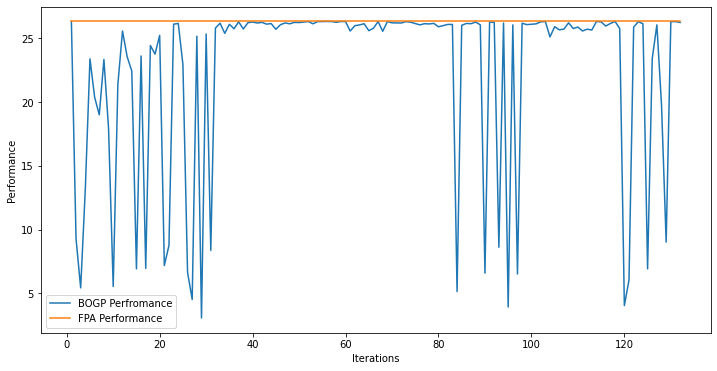

x_next is [-4.42446365e-02 -1.53531889e-01 -4.54751462e-01 -1.93626931e-02
 -1.02072376e-01 -6.83677396e-03 -1.00729128e-01 -3.92572378e-02
 -1.30998868e-01 -5.76961873e-03 -4.35522300e+00 -9.73327135e-02
 -9.64301139e-03 -1.35404900e-01 -1.21405446e-01 -1.61396164e-03
 -7.99488456e-02 -8.42390777e-02 -2.27673748e-02 -1.09350967e-02]
f()=26.206502, actual=26.205
131


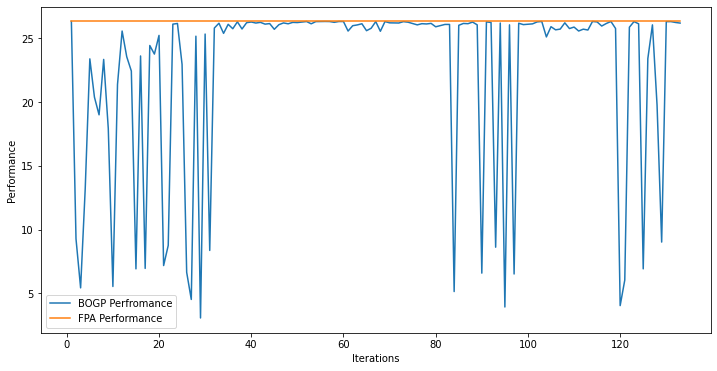

x_next is [-0.03385343 -0.11317963 -0.64441676 -0.2552075  -0.08173524 -0.138754
 -0.0986593  -0.20731676 -1.07641501 -0.12938991 -0.02102421 -0.12985686
 -0.02829782 -0.49116514 -0.15808282 -0.02716774 -0.06424898 -0.07330198
 -0.00989595 -0.00903294]
f()=26.106060, actual=26.107
132


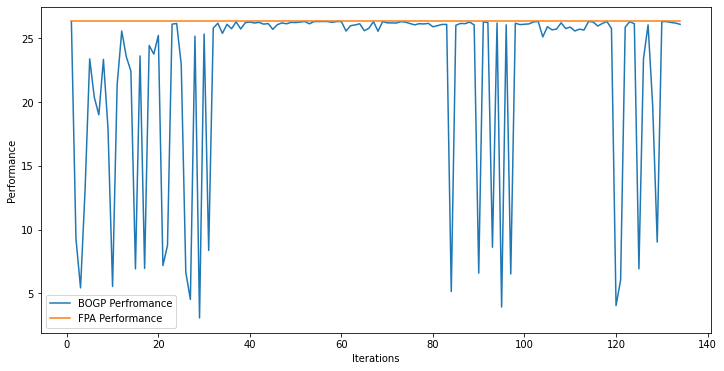

x_next is [-20.41268055  -7.16142993 -22.38703868  -9.66030713 -16.79048473
 -17.70703967  -6.74882615 -20.62840493 -20.45338373  -5.25162021
 -15.90179698 -16.92342935  -9.75354013 -20.95659724 -18.76465571
 -10.73220145  -8.39871423 -27.24821209 -16.2601223  -20.51719198]
f()=22.628378, actual=6.099
133


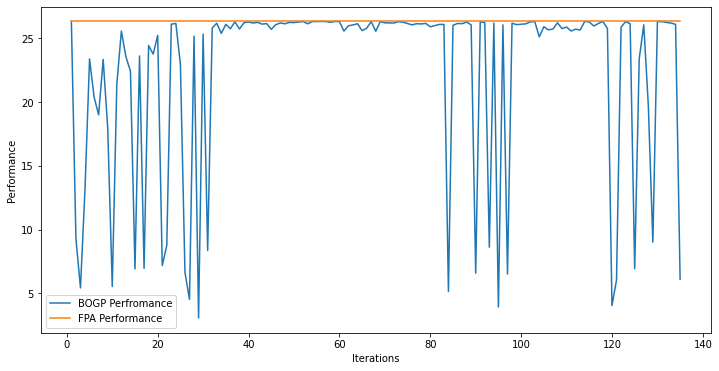

x_next is [-3.43457569e-02 -2.07496939e-07 -3.36055130e-02 -1.40280249e-07
 -1.56671297e-07 -1.82430231e-01 -1.25415468e-07 -2.01645392e-07
 -1.75110152e-07 -1.72928470e-07 -1.85310323e+01 -1.78769532e-07
 -1.57623989e-07 -2.61071589e-07 -1.26143105e-07 -2.10217066e-07
 -1.25415468e-07 -1.79686843e-07 -1.71808968e-07 -1.74049521e-07]
f()=26.256064, actual=26.264
134


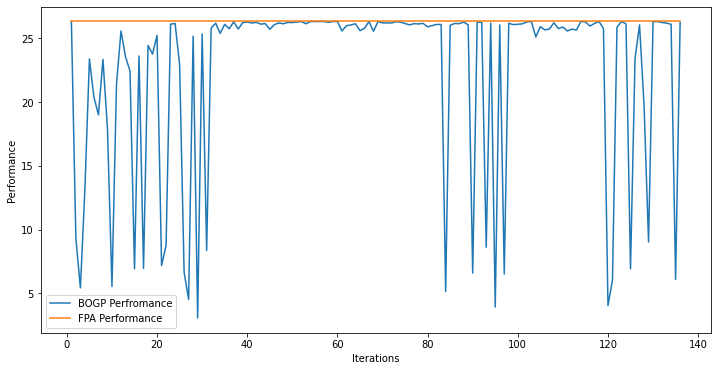

x_next is [ -0.39754892 -15.5369128   -3.9295872   -1.39753778  -0.96901271
  -1.7929594  -28.41139954  -9.15195647  -7.53798584  -3.02119752
 -29.78802314 -22.02752557  -0.10240014 -30.72810703  -1.90974648
  -8.59787973  -3.53838231  -1.66850906  -1.97232643  -6.29185836]
f()=19.021044, actual=18.329
135


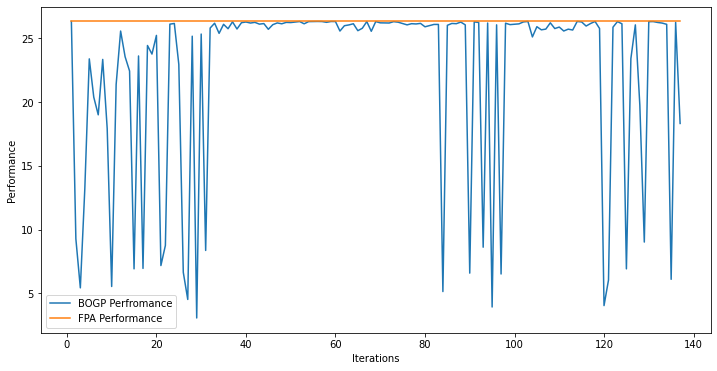

x_next is [ 0.00000000e+00 -1.27578518e-16 -2.25680297e-03  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.43345457e-06  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -4.64316251e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
f()=26.331255, actual=26.331
136


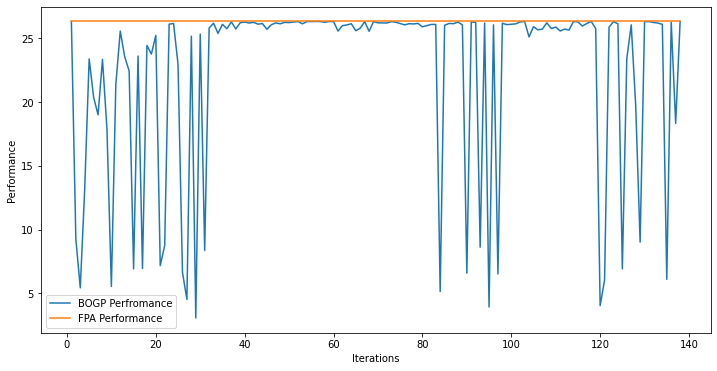

x_next is [ 0.00000000e+00 -5.16966217e-01 -1.83615213e-02  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.84542429e-02  0.00000000e+00
 -3.19308136e-01  0.00000000e+00 -3.88899840e+00 -3.84542429e-02
 -7.58791211e-02 -3.39776424e-02  0.00000000e+00  0.00000000e+00
 -4.57440407e-02  0.00000000e+00 -2.92951728e-07  0.00000000e+00]
f()=26.275771, actual=26.275
137


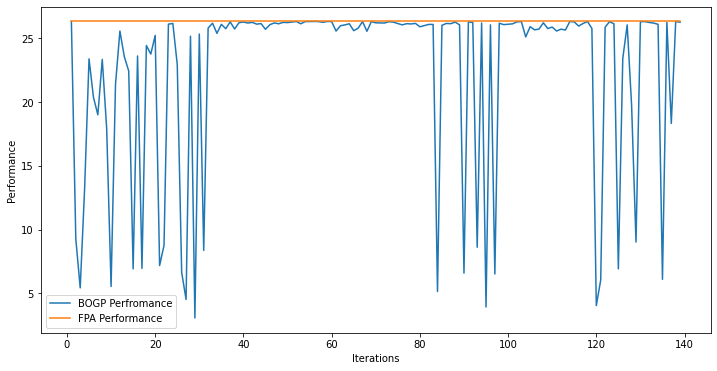

x_next is [-8.43801616e-02 -4.63406516e-01 -4.62596583e-04 -1.73571942e-01
 -5.28230498e-03 -2.13636232e-02 -2.09466944e-01 -3.40055530e-03
 -1.94549773e+00 -1.36722312e-02 -2.15285457e+00 -2.45071174e-02
 -6.68265807e-02 -3.16065239e-01 -8.98279875e-02 -1.36644699e-03
 -5.41904104e-02 -1.23840288e-01 -2.43371172e-02 -9.12112444e-02]
f()=26.159545, actual=26.159
138


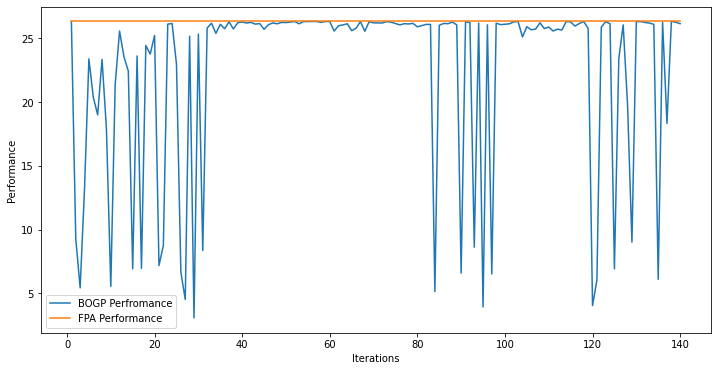

x_next is [-1.98673374e-04 -1.67906285e-03 -3.08654056e-03 -2.55115696e-03
 -4.29427005e-04 -1.71631848e-03 -2.27736070e-03 -9.10774954e-05
 -1.44665199e-02 -4.18781583e-05 -1.51499946e-02 -1.66215504e-03
 -1.38661275e-03 -1.62678088e-03 -3.62400173e-03 -7.44020058e-04
 -3.55511923e-04 -6.84619215e-05 -3.47311746e-04 -9.07027308e-04]
f()=26.329127, actual=26.329
139


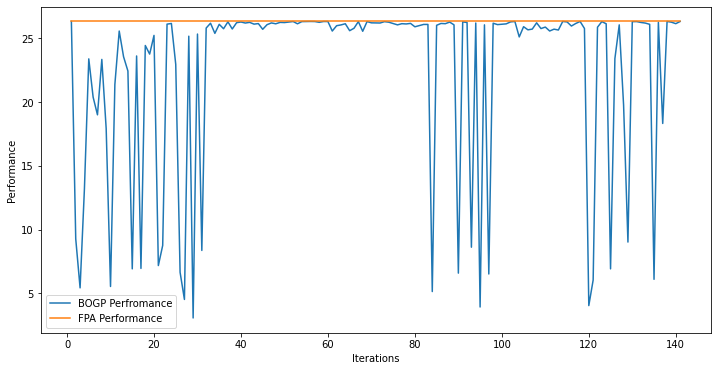

x_next is [-7.03043505e-07 -1.38637061e+00 -6.84908540e-02  0.00000000e+00
 -1.56678318e-02 -1.47677183e-01 -1.75424825e-01 -7.04982003e-07
 -1.71732784e+00 -9.92044149e-05 -1.46797505e-01 -1.42875735e-05
 -3.08726881e-04 -1.17487353e+00 -6.22109404e-21 -7.04982003e-07
 -7.03043505e-07 -7.03043505e-07 -3.80547582e-03 -1.50264566e-06]
f()=26.202342, actual=26.204
140


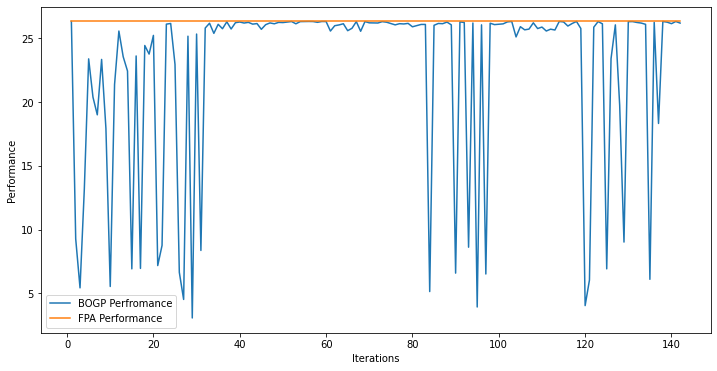

x_next is [-9.30956095e-11 -3.14404685e+00 -1.24864894e-02 -6.62435940e-08
 -1.49755096e-08 -2.61305684e-05 -4.77320100e-08 -1.22025422e-01
 -1.04282435e-07 -9.20134133e-09 -9.02875054e+00 -2.55839314e-05
 -1.12246818e-09  0.00000000e+00 -4.44315341e-02 -5.10279293e-09
 -2.96387565e-09 -8.39798951e-19 -7.66976388e-02 -1.61646427e-16]
f()=26.214244, actual=26.221
141


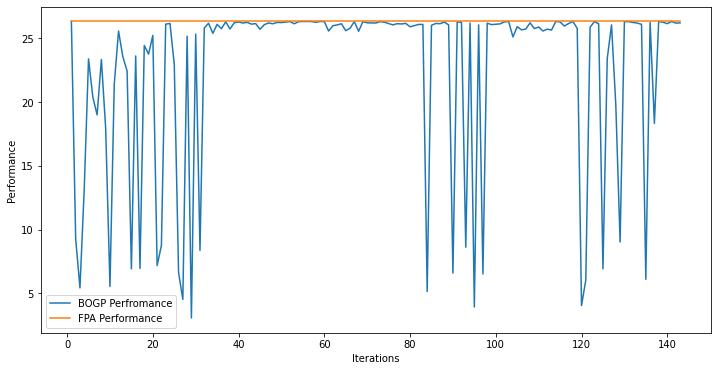

x_next is [ -6.11606437 -20.13653839 -11.6142954  -29.65541492  -2.77047262
  -3.4232506   -0.93331795  -2.40175853 -22.3046283   -8.49180349
  -4.70392425 -18.20831974  -8.64480203 -10.91855781  -9.36745414
  -1.4985519   -9.7437614   -3.87576732  -7.21554161  -3.9546698 ]
f()=22.645849, actual=12.184
142


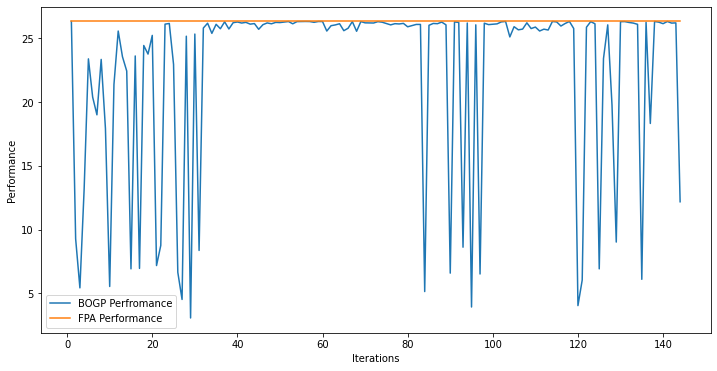

x_next is [-2.27062832e-02 -1.70277875e-01 -6.63042638e+00 -1.27970852e-01
 -1.95846453e-02 -1.76626132e-02 -2.31945126e-02 -2.28824327e-01
 -1.86073219e-01 -4.78268384e-03 -7.01859938e-01 -2.16037974e-01
 -1.53144904e-01 -5.52735850e-01 -6.31126757e-03 -1.13040610e-02
 -7.74007079e-02 -1.68412528e-02 -4.11970441e-03 -1.16612446e-01]
f()=26.122720, actual=26.124
143


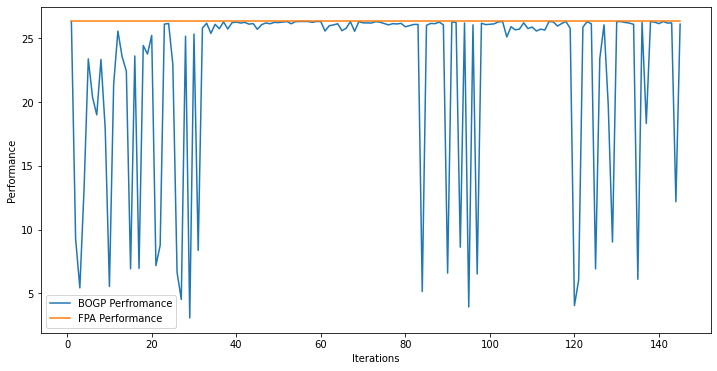

x_next is [-0.03044841 -0.01118981 -0.00696622 -0.00033815 -0.00073523 -0.0132431
 -0.01102372 -0.01898858 -0.00178814 -0.0405604  -0.01866065 -0.00270507
 -0.03690272 -0.01837304 -0.00204183 -0.01250606 -0.0139524  -0.02619141
 -0.0403625  -0.02630155]
f()=22.597605, actual=26.279
144


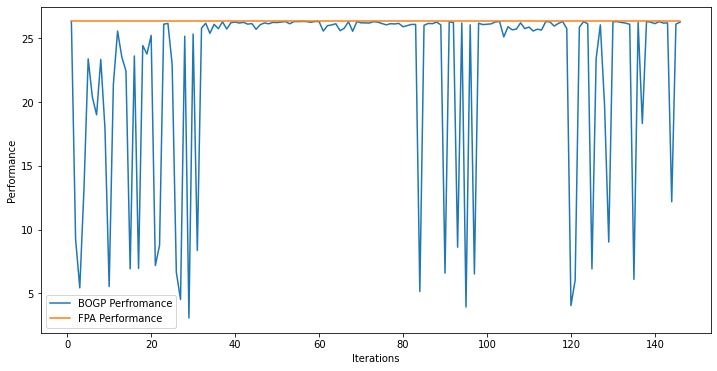

x_next is [-4.40982476e-02 -5.05958278e-01 -2.33073745e-01 -1.32765336e-02
 -1.21984587e-01 -1.02696030e-02 -3.16658972e-02 -7.88746512e-02
 -4.33465007e-02 -1.71224402e-02 -1.21189535e+01 -2.20686559e-03
 -1.08112277e-01 -2.11766075e-02 -9.70409849e-02 -1.45272994e-02
 -7.10245604e-03 -3.34682496e-02 -3.87072403e-02 -3.70991150e-02]
f()=26.204419, actual=26.194
145


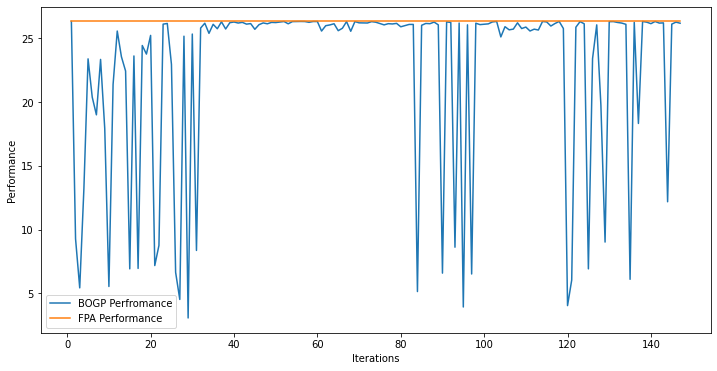

x_next is [-9.45371127e-02 -4.67996742e-01 -4.84594233e-01 -2.28558531e-02
 -4.49743348e-04 -7.61498095e-02 -1.49665274e-01 -7.74726314e-03
 -1.34127103e-01 -1.04305368e-03 -3.45877426e-01 -2.15053366e-01
 -3.84048394e-02 -6.21306478e-02 -9.81603786e-02 -2.13131837e-02
 -6.83835649e-02 -1.25716570e-01 -3.89858685e-02 -5.38578103e-02]
f()=26.180135, actual=26.179
146


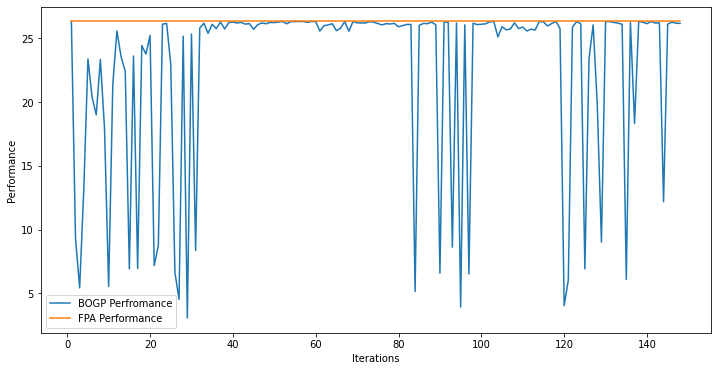

x_next is [ -0.44922049  -1.51689691  -6.63494503  -9.00463397  -7.41606988
  -1.11686005  -5.08085615  -0.46172101 -16.99730648  -0.35407338
 -29.33757087  -0.75185712  -4.18706339 -29.47966976 -25.03221677
  -5.36199837  -7.744483    -3.92457864  -2.00646491  -2.32956146]
f()=19.041171, actual=18.538
147


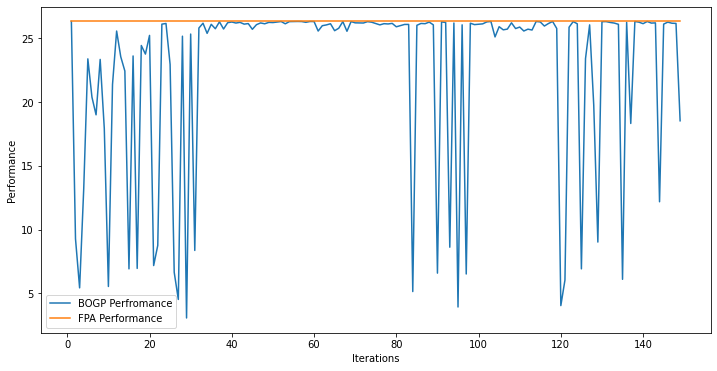

x_next is [ 0.         -0.01682214 -0.00176766  0.          0.          0.
  0.          0.          0.          0.         -0.00196329  0.
  0.         -0.02103848  0.          0.         -0.00147656  0.
  0.          0.        ]
f()=26.329832, actual=26.330
148


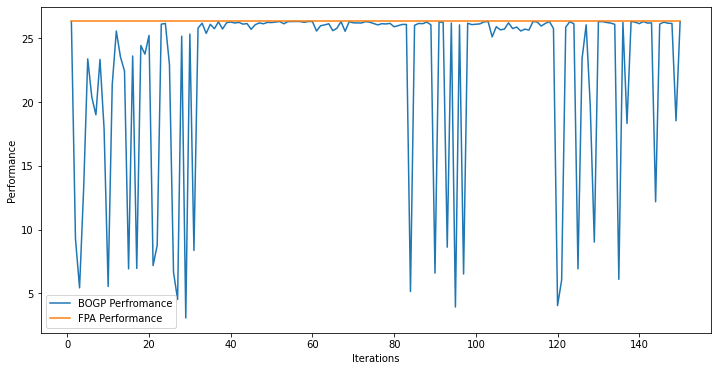

x_next is [-1.18731530e-01 -8.73704407e-01 -2.84935024e-01 -7.18457059e-08
 -2.14035742e-09 -9.64834676e-03 -3.77792543e-08 -4.98265316e-03
 -6.88145232e+00 -2.46396676e-09 -7.74342034e-01 -1.23357705e-08
 -1.91442263e-01 -7.01925682e-03 -1.02234223e-08 -9.86920442e-09
 -8.26260841e-10 -1.64594981e-08 -9.88368047e-03 -1.25886899e-01]
f()=26.190368, actual=26.190
149


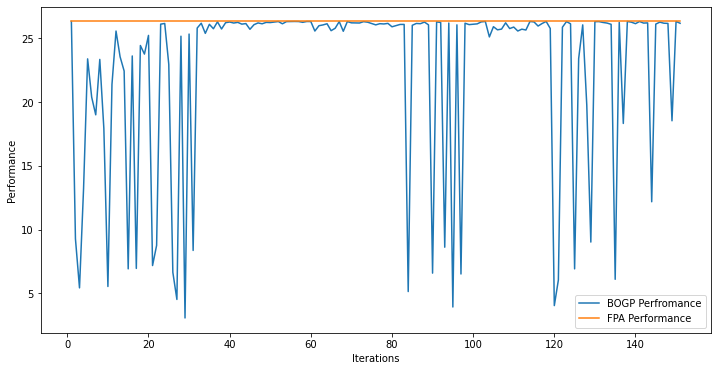

x_next is [-9.39917115e-04 -2.43042733e-03 -2.44700532e-02 -9.53604649e-03
 -7.45918377e-03 -7.97741529e-03 -5.94530571e-03 -7.25053874e-03
 -2.74482650e-02 -2.86451314e-03 -1.24506492e-01 -6.61191551e-03
 -5.22638310e-03 -2.68222240e-03 -8.92487602e-03 -2.52512656e-03
 -5.72699942e-03 -6.03067283e-03 -1.08504454e-04 -7.99039975e-03]
f()=26.318127, actual=26.318
150


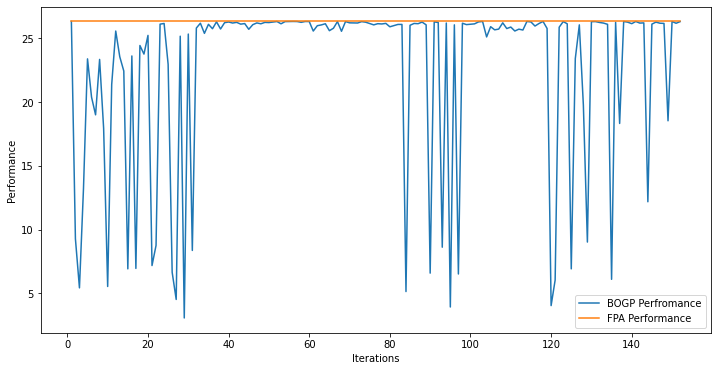

x_next is [ 0.00000000e+00 -2.19562351e-11 -1.25215248e-01 -3.20808390e-11
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -6.98789017e-12  0.00000000e+00 -9.68191607e-03  0.00000000e+00
  0.00000000e+00 -4.71902678e-12  0.00000000e+00  0.00000000e+00]
f()=26.329700, actual=26.330
151


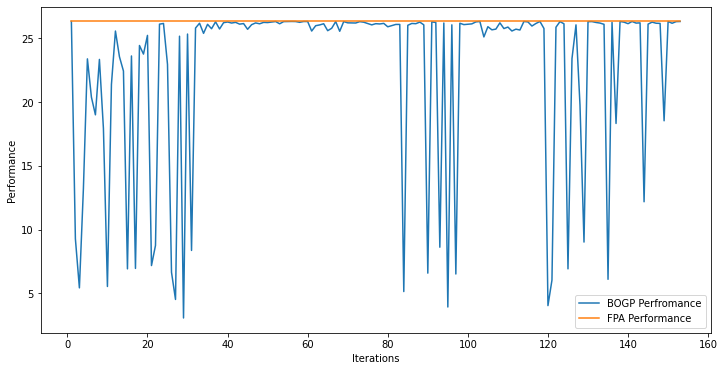

x_next is [-6.17360162e-08 -3.64294754e-21 -1.12439907e+00 -5.10821562e-21
 -5.86341181e-21 -1.17120898e-21 -6.17360162e-08 -1.52472277e-21
 -1.87977416e+00 -1.66863107e-21 -2.88305391e-01 -8.26655021e-03
 -7.94706352e-21 -2.26221641e-02 -2.02476046e-21 -1.48513416e-21
 -1.08758393e-02 -1.60810704e-21 -2.84877603e-03 -3.27960912e-21]
f()=26.302021, actual=26.301
152


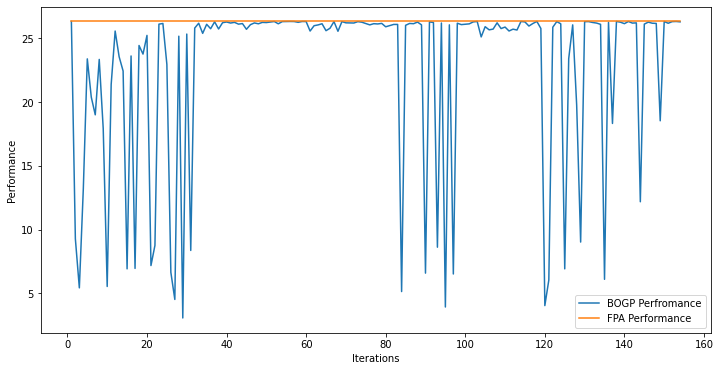

x_next is [-1.33523322e-01 -3.09836216e-03 -1.28618078e+00 -3.99050498e-06
 -5.11126810e-07 -3.90230711e-06 -2.49701359e-02 -1.30313159e-06
 -1.16363077e-06 -3.90209506e-06 -1.43048846e+00 -4.32540339e-01
 -4.27938007e-01 -1.83456199e-01 -2.03616934e-01 -4.20451690e-07
 -1.55029431e-06 -7.20527827e-07 -1.50490393e-06 -4.59367558e-07]
f()=26.172111, actual=26.174
153


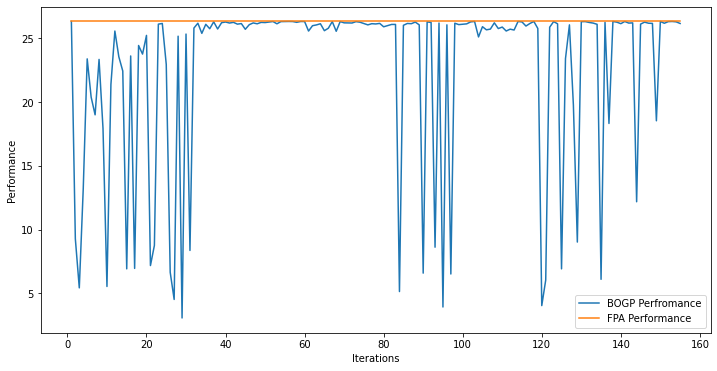

x_next is [-2.04576344e-08 -5.72055809e-08 -8.22208302e-08 -8.19605690e-09
 -4.78027695e-09 -8.49022383e-09 -5.23185247e-04 -1.42554168e-05
 -5.29652774e-08 -2.30003712e-08 -1.62460412e-04 -3.13912913e-08
 -2.37299834e-09 -2.18419530e-08 -1.34155556e-07 -9.38589628e-10
 -6.38900835e-04 -2.21354464e-08 -9.30124788e-10 -2.62383647e-09]
f()=26.331132, actual=26.331
154


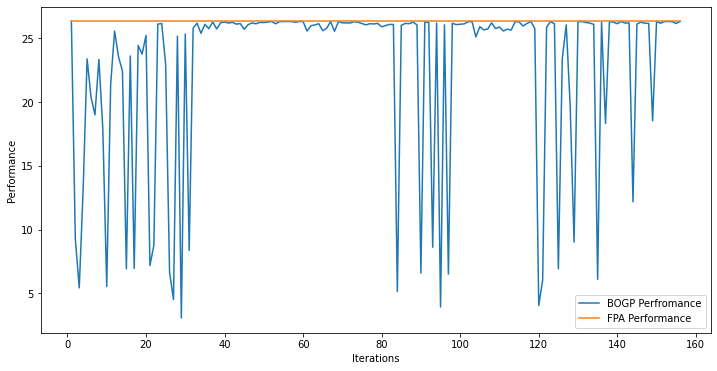

x_next is [-0.02020256 -0.11257418 -0.09211485 -0.15914048 -0.0216115  -0.06756954
 -0.05309784 -0.01777581 -0.21684623 -0.01771413 -0.12449815 -0.05763505
 -0.11601946 -0.31628088 -0.2150787  -0.01321192 -0.03285521 -0.00192842
 -0.04435291 -0.02235418]
f()=26.216266, actual=26.216
155


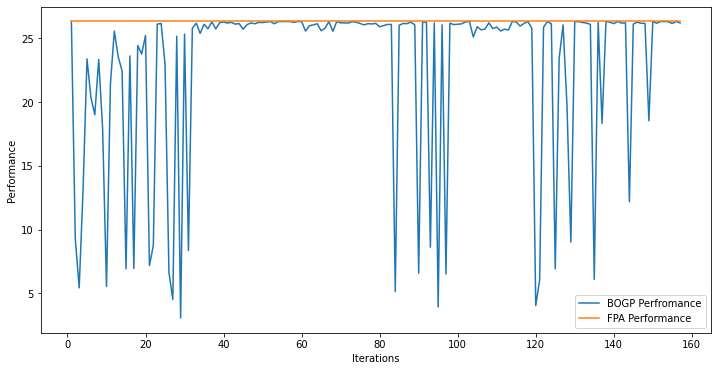

x_next is [ 0.00000000e+00  0.00000000e+00 -1.80110867e+00 -1.35483087e-08
  0.00000000e+00  0.00000000e+00 -2.10308157e-05  0.00000000e+00
 -2.15953455e+00 -2.16810442e-08 -1.78932145e+00  0.00000000e+00
 -2.25952025e-08  0.00000000e+00  0.00000000e+00 -3.51238915e-08
 -9.91724636e-09  0.00000000e+00 -2.20596119e-21  0.00000000e+00]
f()=26.290358, actual=26.291
156


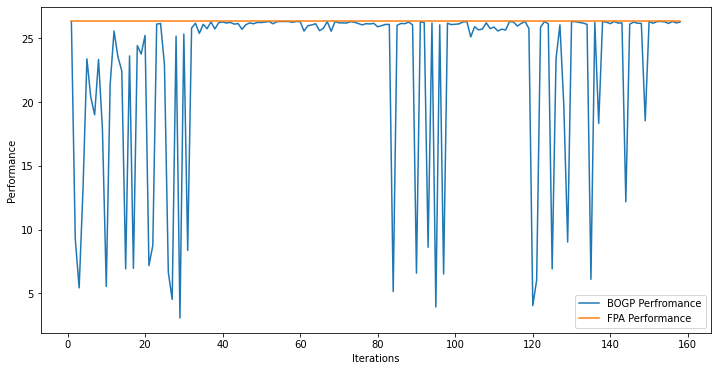

x_next is [-2.52632139e-08 -4.10913098e-02 -2.52631861e-08 -2.52632229e-08
 -1.92297891e-03 -1.01826300e-06 -1.11612688e-02 -1.13691134e-01
 -3.53242799e-01 -3.64729674e-08 -1.02755580e+00 -2.52632033e-08
 -1.09211760e-02 -3.06358133e-01 -9.37715043e-02 -1.12097846e-08
 -4.34790925e-08 -3.40562994e-03 -5.09522683e-08 -1.27870864e-02]
f()=26.283168, actual=26.283
157


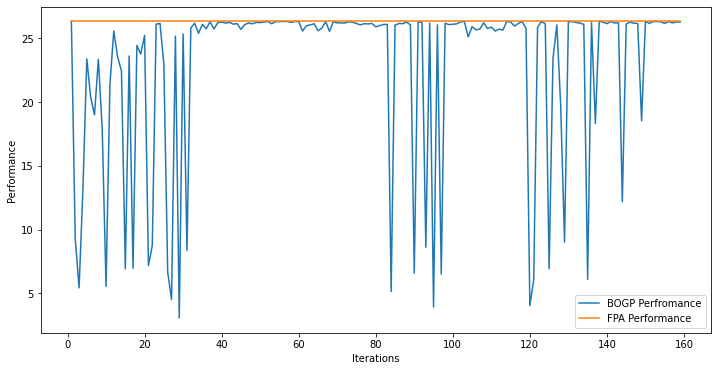

x_next is [-2.45648092e+00 -2.38715933e+01 -2.83533325e+01 -2.61499857e+00
 -8.66289122e-01 -2.26945269e+00 -8.12683915e+00 -4.96787863e+00
 -7.04375068e-01 -1.40376210e+00 -2.21873141e+01 -1.94564625e+01
 -9.70795588e-03 -6.16824584e+00 -6.06529075e+00 -5.06367982e-01
 -1.39709336e+00 -4.59439789e+00 -9.55101666e-01 -1.38158551e+00]
f()=20.739085, actual=21.312
158


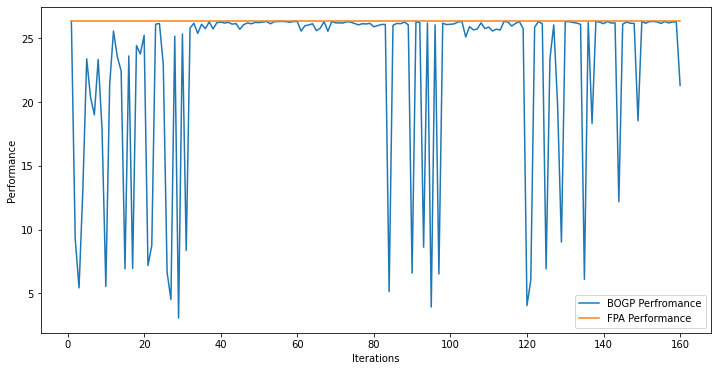

x_next is [-0.08300751 -1.05130302 -0.00721741 -0.01798227 -0.01645058 -0.00663021
 -0.00452969 -0.07473181 -0.92572132 -0.0779349  -0.56512826 -0.1358379
 -0.15444074 -0.02923307 -0.44128623 -0.03611646 -0.04702613 -0.00428692
 -0.0192355  -0.10889497]
f()=26.153426, actual=26.155
159


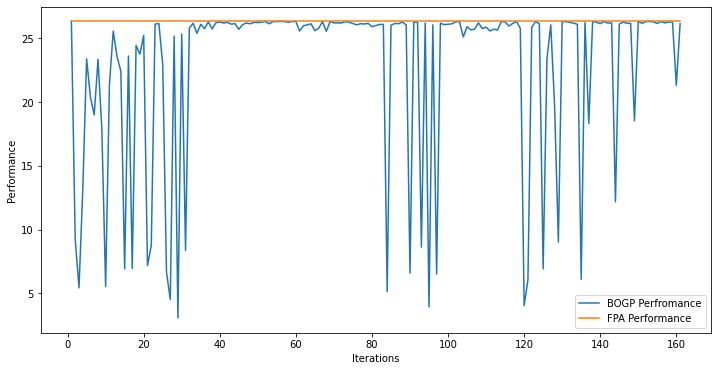

x_next is [-5.09929086e-02 -3.08918571e+01 -3.08646256e+01 -8.18561687e-02
 -2.57003111e-02 -8.05645285e-02 -4.23047793e-02 -5.36956816e-02
 -4.63764458e-02 -2.12835536e-03 -3.05746422e+01 -2.13407524e-01
 -2.35957051e-01 -6.55526418e-02 -4.50491912e-01 -1.88195969e-02
 -2.59125856e-02 -3.71958632e-02 -1.32028841e-02 -4.78598526e-02]
f()=26.180893, actual=26.018
160


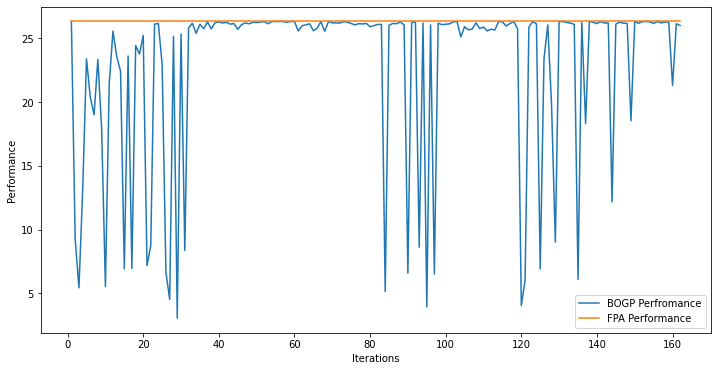

x_next is [-6.23742912e-04 -1.16868892e-03 -1.01843160e-02 -1.12609749e-03
 -1.07863378e-06 -5.72274280e-07 -6.00239411e-07 -5.00950714e-05
 -3.20388730e-03 -8.80219163e-02 -2.30444192e+00 -1.45598532e-01
 -1.72106734e-03 -2.06407769e-01 -1.11110931e-01 -4.84190792e-03
 -4.58595163e-02 -1.30608933e-03 -9.10697607e-05 -9.83161376e-05]
f()=26.267435, actual=26.267
161


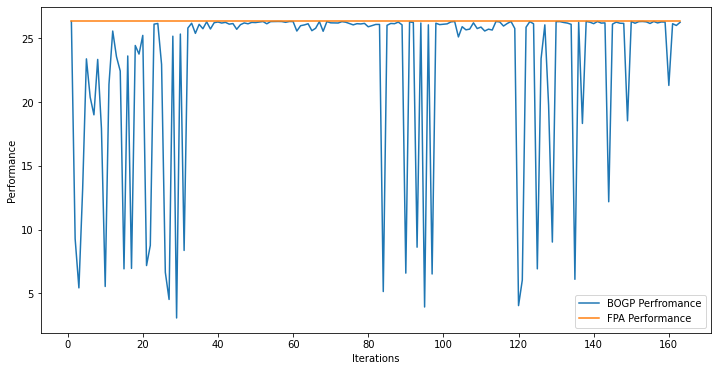

x_next is [-4.12599844e-06 -8.90646721e-02 -1.75672156e+00 -4.86541028e-02
 -3.53217462e-07 -3.04087471e-06 -2.79413832e-02 -3.75288693e-03
 -8.65968468e-01 -2.76069707e-06 -5.34062678e-01 -7.08681722e-08
 -1.09659839e-07 -2.73986126e-01 -5.21957610e-07 -3.42756148e-07
 -3.16739486e-07 -3.38469714e-07 -3.51806104e-07 -1.73755395e-06]
f()=26.286645, actual=26.287
162


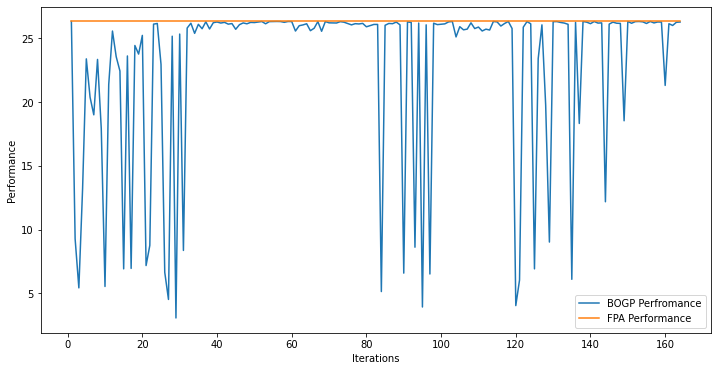

x_next is [ -7.03504485 -24.67092153 -12.33144007 -22.68416109  -9.87829032
  -7.45257993 -18.28797215 -16.58415258  -7.17286234 -13.71427142
  -6.85751511 -20.85460262 -30.43281046 -23.79203628 -30.66204808
 -28.88364612 -30.15632798  -3.29929108 -30.43231843 -12.84560606]
f()=22.944336, actual=2.984
163


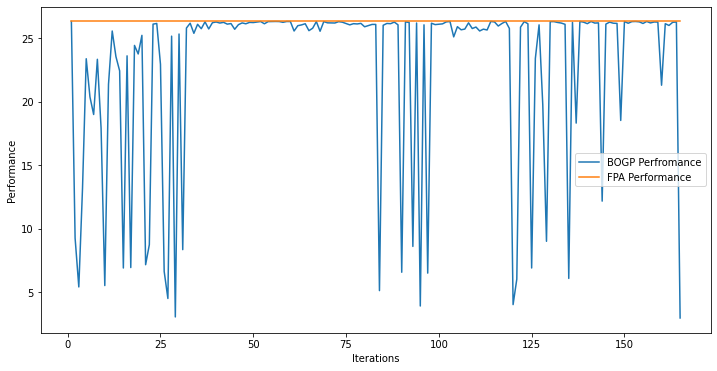

x_next is [ 0.          0.          0.          0.          0.          0.
  0.          0.         -0.74169328  0.         -1.53988676  0.
  0.          0.         -0.03869839  0.          0.          0.
  0.          0.        ]
f()=26.314956, actual=26.316
164


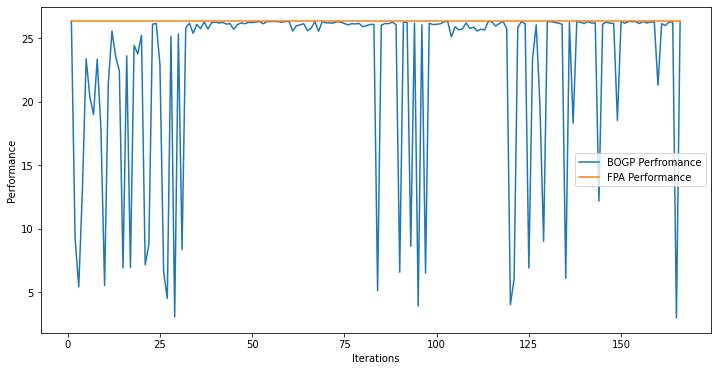

x_next is [-20.05723325 -17.83342878  -8.35240047 -13.45755288  -6.86031442
 -23.97735484  -8.47832963  -6.02242069  -2.70663633 -25.33620298
  -9.88536684 -20.2921365  -29.37545816  -3.51559063  -9.74074154
  -8.78707886 -24.58856788  -3.81603122  -0.22100786  -3.66660706]
f()=10.988460, actual=9.277
165


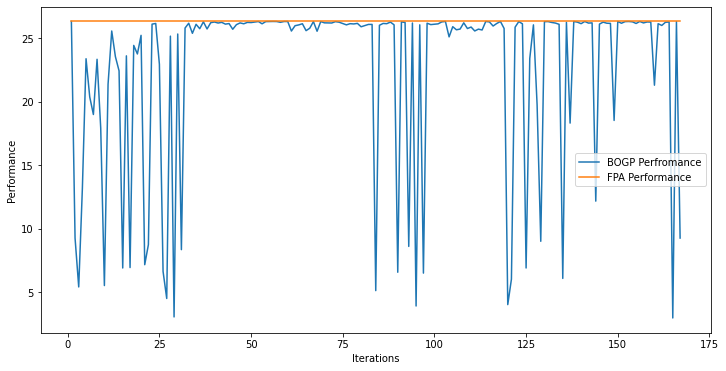

x_next is [-4.69460163e-02 -1.18517919e+00 -6.11622497e-01 -6.62471362e-04
 -1.88310194e-06 -7.97378905e-04 -1.13226421e-06 -5.24288094e-02
 -3.39617809e+00 -2.34790021e-02 -7.08302117e-07 -1.94555065e-06
 -2.03824873e-06 -1.25538027e-01 -4.23584557e-05 -1.95023957e-06
 -2.00271904e-06 -1.00784764e-01 -1.55184367e-03 -3.22959057e-06]
f()=26.240372, actual=26.238
166


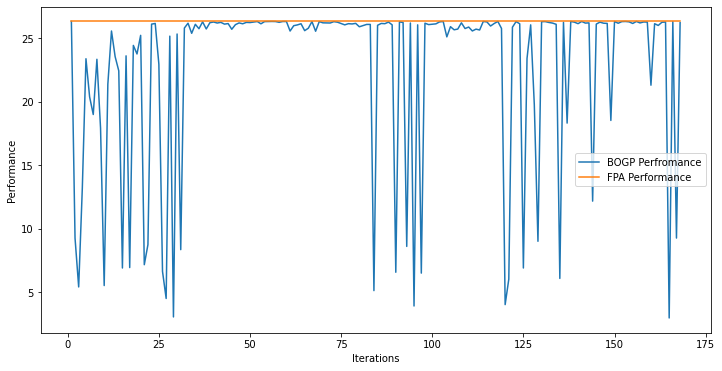

x_next is [-2.28607695e-02 -1.41449729e-01 -3.96286022e-01 -4.23958380e-02
 -4.93737471e-02 -6.84157953e-02 -1.61617649e-01 -5.14052665e-02
 -2.39874735e-01 -5.99955489e-02 -1.39335460e+00 -1.05996523e-01
 -1.14057501e-02 -9.49949906e-03 -2.22778888e-01 -7.35573548e-02
 -2.22250165e-02 -1.10051511e-03 -3.46886692e-02 -2.19317851e-03]
f()=26.203695, actual=26.204
167


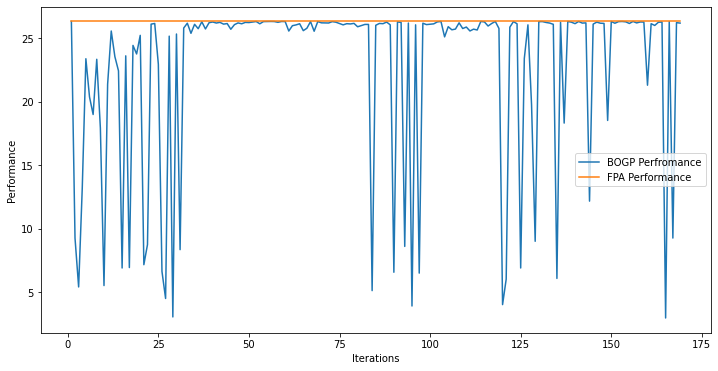

x_next is [-1.58734389e-03 -6.18646067e-01 -5.55022264e-01 -6.75931016e-02
 -1.38843991e-01 -2.05798963e-06 -4.87290354e-02 -6.67960306e-02
 -1.97625637e-06 -2.01034961e-06 -1.55366821e-01 -2.07062084e-06
 -3.03221476e-06 -8.78999546e-07 -1.94118410e-05 -3.16736234e-07
 -2.00814064e-06 -1.98778820e-03 -3.48058080e-05 -7.74178081e-03]
f()=26.264382, actual=26.265
168


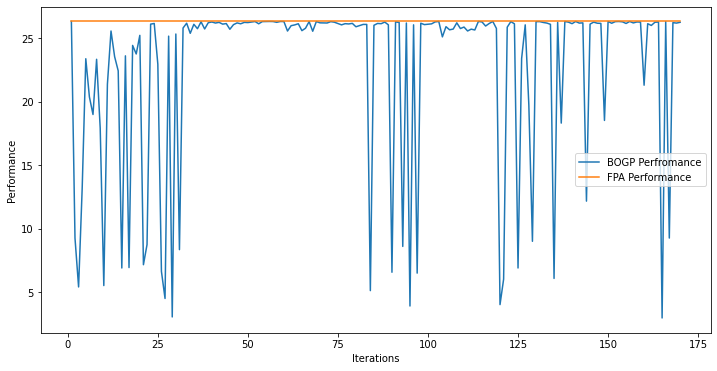

x_next is [-2.91875834e-02 -1.49511771e-01 -5.69329908e-01 -1.58478522e-02
 -2.58723047e-02 -4.38892253e-04 -1.93535705e-02 -9.32099705e-02
 -7.11320297e-01 -1.64552422e-02 -5.32874626e-01 -4.36139252e-03
 -6.46165172e-02 -8.79082143e-02 -7.19401322e-02 -1.62118606e-02
 -7.21312057e-03 -1.49163800e-03 -9.75648394e-03 -1.70216095e-02]
f()=26.255827, actual=26.255
169


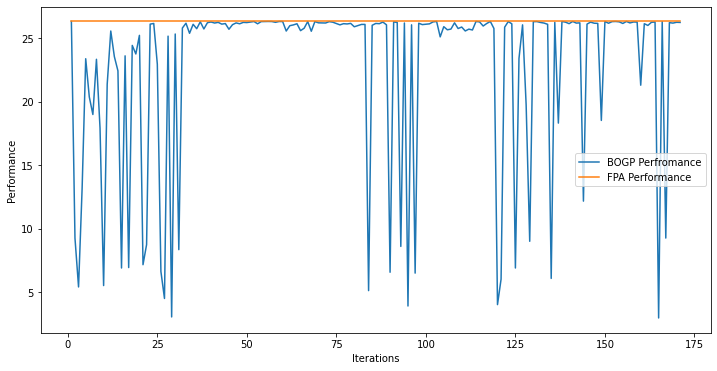

x_next is [-6.41155135e-02 -2.45412711e-01 -9.65627434e-01 -4.00331515e-02
 -7.74902645e-02 -1.36919315e-01 -4.14916635e-02 -2.47032214e-02
 -1.67761534e+00 -5.17452774e-02 -2.15613264e-01 -4.50462815e-02
 -3.80828300e-02 -4.73077527e-01 -1.85315727e-01 -3.20141989e-02
 -9.79855976e-02 -3.41725227e-02 -1.14906023e-03 -2.50186217e-02]
f()=26.162793, actual=26.161
170


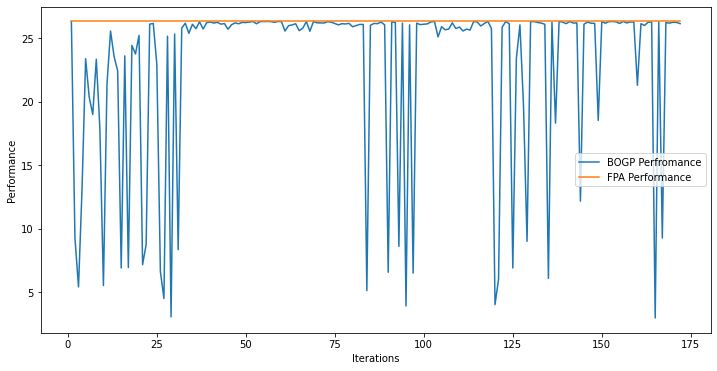

x_next is [-0.02542015 -0.37248737 -0.49738004 -0.01862122 -0.04530584 -0.00841706
 -0.04382138 -0.0087761  -0.02448781 -0.00874213 -0.14084964 -0.0262729
 -0.0429244  -0.06918302 -0.00933216 -0.05328772 -0.07912182 -0.00462451
 -0.02131381 -0.05216784]
f()=26.241811, actual=26.241
171


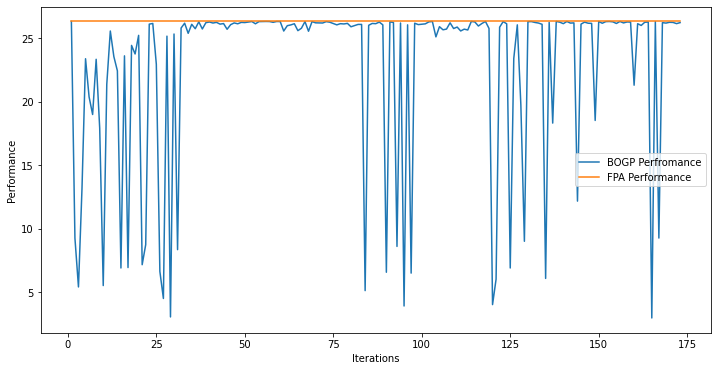

x_next is [-1.79908553e-02 -1.30417001e-02 -3.19570873e-01 -1.53524086e-01
 -7.47293460e-04 -1.90787889e-02 -6.34989087e-02 -5.48855301e-03
 -2.66335950e-01 -7.92897068e-03 -8.01592511e-01 -5.05181129e-02
 -6.85324121e-02 -1.03885704e-01 -7.70509050e-02 -3.17834655e-02
 -4.67360347e-02 -3.39697530e-02 -1.27347560e-02 -1.44321217e-02]
f()=26.246363, actual=26.247
172


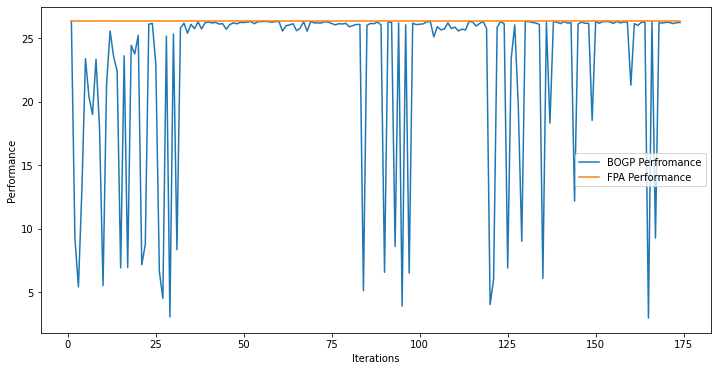

x_next is [-5.77077565e-08 -8.29610720e-06 -6.64035881e-03 -1.86362043e-08
 -4.80672053e-08 -4.32861519e-07 -5.33960691e-08 -2.52820117e-08
 -1.62727661e-08 -1.31806957e-08 -6.64201033e-07 -8.94531027e-08
 -1.83027977e-04 -3.18628317e-03 -3.66198695e-07 -4.29518393e-08
 -2.39567422e-08 -4.80235128e-07 -5.87085140e-08 -5.05810192e-08]
f()=26.331081, actual=26.331
173


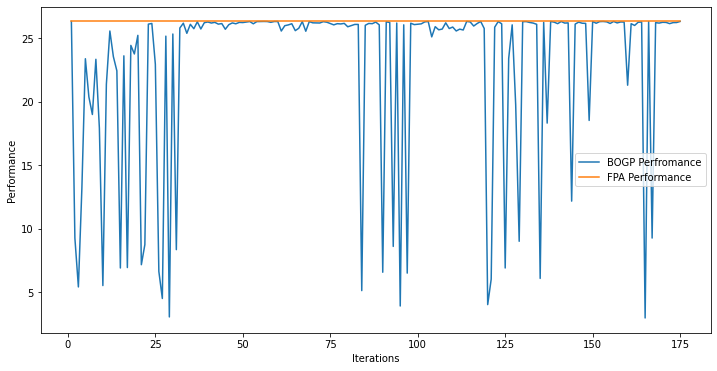

x_next is [-1.27854748e-03 -5.78383367e-02 -1.06071593e-01 -8.73653808e-03
 -4.24182937e-02 -2.30542444e-02 -8.88887714e-05 -5.17195830e-02
 -3.03514218e-01 -3.22056672e-03 -1.59049337e-01 -9.52216374e-02
 -7.19335674e-02 -5.57855307e-03 -9.92398006e-03 -4.85924701e-02
 -1.17718584e-01 -7.97192686e-02 -1.25688255e-03 -1.81915446e-04]
f()=26.243265, actual=26.243
174


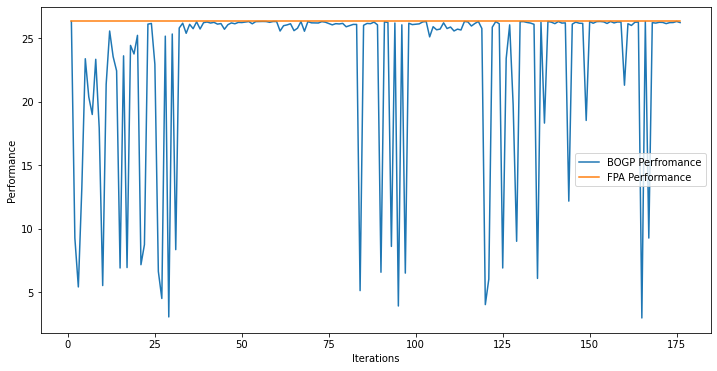

x_next is [-2.39335278e-08 -1.76022528e-01 -2.36220044e-06 -1.79132256e-05
 -2.07579160e-06 -6.27372082e-02 -9.18361332e-06 -4.14228735e-08
 -4.73068231e-08 -3.52299530e-07 -2.09450511e-01 -2.40305115e-06
 -6.77985182e-08 -1.39124699e-01 -5.19779999e-03 -6.09358318e-07
 -6.09801196e-08 -2.57337523e-06 -9.49669758e-08 -5.33043852e-08]
f()=26.309511, actual=26.310
175


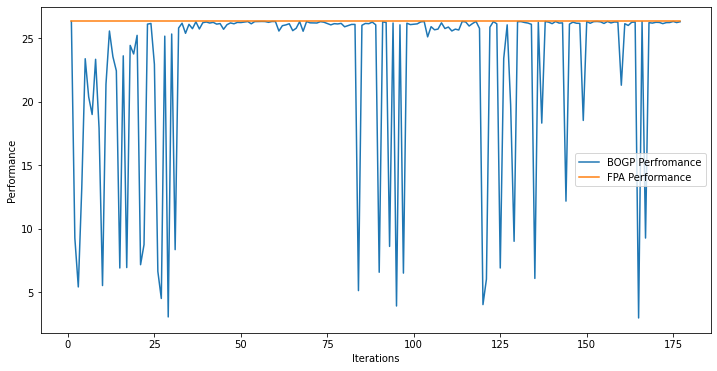

x_next is [-0.00836152 -0.00706594 -0.07624022 -0.00395246 -0.00079958 -0.00907726
 -0.00478532 -0.01053357 -0.10946914 -0.00517648 -0.01240747 -0.00550653
 -0.01131482 -0.05530272 -0.09201446 -0.00226247 -0.00417916 -0.00773421
 -0.00789775 -0.00092402]
f()=26.310455, actual=26.310
176


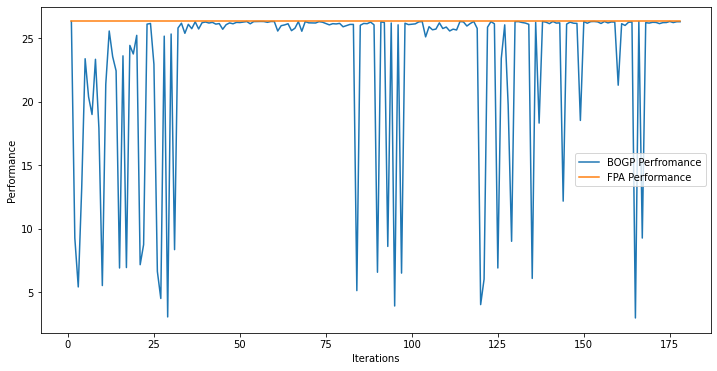

x_next is [ 0.00000000e+00  0.00000000e+00 -3.05859395e-01  0.00000000e+00
  0.00000000e+00 -1.24821012e-02  0.00000000e+00 -9.89975063e-05
 -6.58901180e-01  0.00000000e+00 -1.99493868e-01  0.00000000e+00
 -5.88590534e-03  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -1.22024292e-03]
f()=26.318010, actual=26.318
177


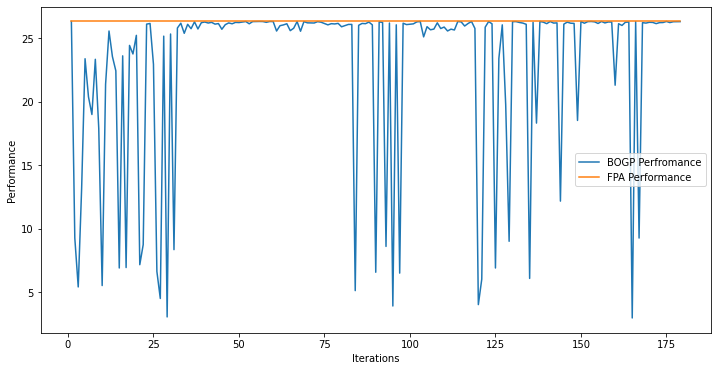

x_next is [-0.01101134 -0.03920539 -0.47160586 -0.0059815  -0.04217229 -0.00996277
 -0.02088378 -0.02739698 -0.08939737 -0.05975079 -0.54384198 -0.01297988
 -0.00649811 -0.0164241  -0.01148059 -0.01088161 -0.00983109 -0.02305403
 -0.02278227 -0.00409211]
f()=26.274227, actual=26.274
178


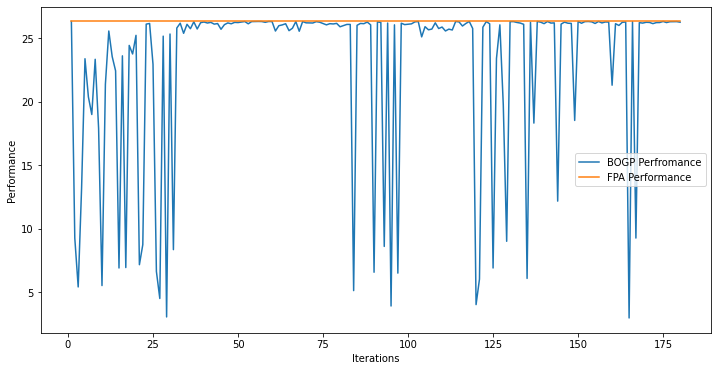

x_next is [ 0.00000000e+00 -1.93011761e+00  0.00000000e+00 -6.78705141e-10
  0.00000000e+00 -4.30993181e-11 -2.21427961e-10  0.00000000e+00
 -1.70550916e+01  0.00000000e+00 -5.80464131e-10  0.00000000e+00
 -4.28960422e-10 -1.83175644e-10 -6.70664186e-12 -1.41902824e-10
  0.00000000e+00  0.00000000e+00 -1.69683030e-10  0.00000000e+00]
f()=26.208405, actual=26.257
179


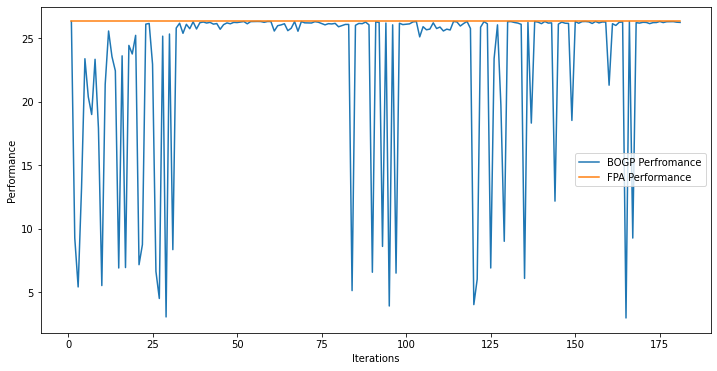

x_next is [-2.80813815e-08 -2.55333072e-07 -1.21799170e-01 -1.60300449e-03
 -2.87219536e-08 -2.88565266e-08 -2.48840826e-07 -2.50346123e-07
 -3.24968918e+00 -2.87060425e-08 -9.61752480e-01 -2.80813815e-08
 -2.87084904e-08 -2.74788275e-08 -2.85763064e-08 -3.11561375e-08
 -2.81034121e-08 -2.93408010e-08 -2.48228022e-07 -1.84585806e-02]
f()=26.298663, actual=26.299
180


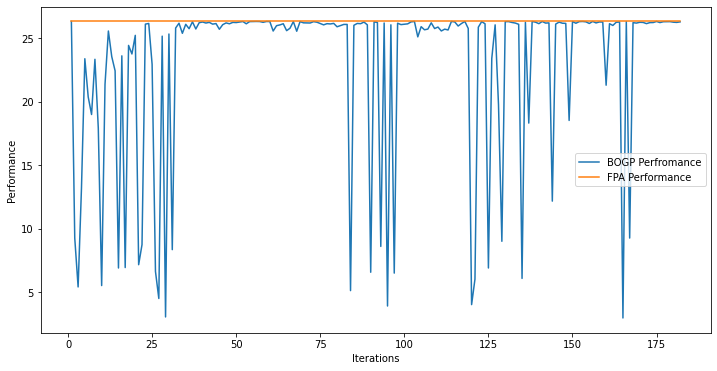

x_next is [ -0.92630047 -16.95615492 -20.97565281 -10.29398605  -0.54655255
  -1.84810794 -18.66971201  -2.58830253  -8.41072476  -2.36931243
  -6.22053181  -3.56008792  -2.80849991 -30.94447124  -2.13783604
  -2.43994766  -3.22748576  -0.56375815  -2.91513321  -9.4947957 ]
f()=18.527777, actual=17.910
181


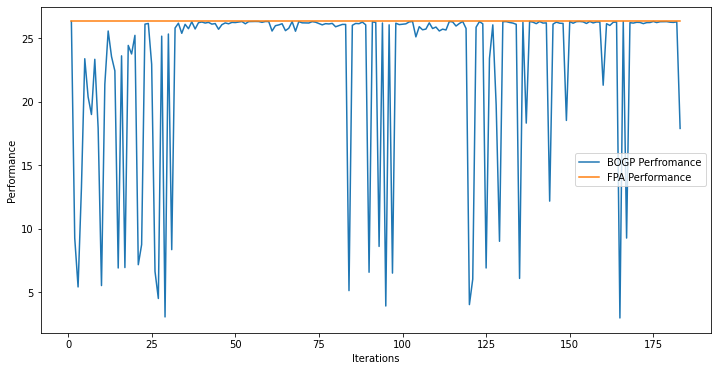

x_next is [-1.56913281e-04 -2.52245565e-02 -9.30989371e-03 -9.64566816e-09
 -1.33637266e-02 -1.70988570e-02 -1.07346869e-02 -1.54184039e-04
 -1.10437748e-01 -3.16395174e-04 -2.76665455e-01 -1.57687582e-02
 -8.54554096e-03 -2.54742891e-01 -1.23800926e-04 -1.55690094e-04
 -3.21666832e-04 -4.07743442e-02 -3.18214608e-08 -3.13279945e-04]
f()=26.303539, actual=26.303
182


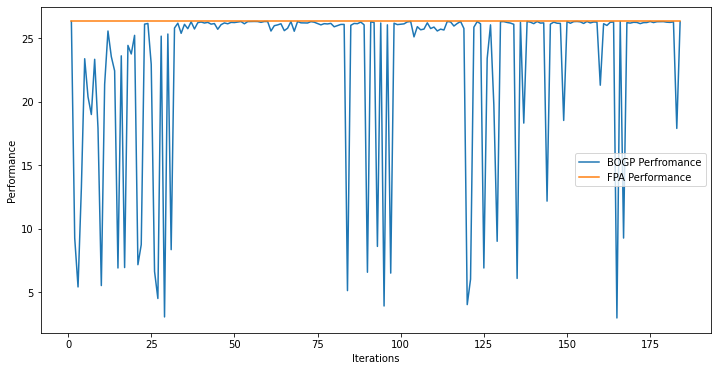

x_next is [-2.21524464e-02 -1.26807513e-01 -3.47924057e-01 -1.75230504e-01
 -1.57819040e-02 -3.23357506e-04 -7.43629583e-03 -8.84273348e-03
 -4.03392991e-01 -2.17519543e-03 -1.29901460e-01 -6.24484012e-02
 -4.46315515e-02 -2.54055701e-02 -7.28194614e-03 -1.39379103e-02
 -3.04203508e-02 -3.46914462e-02 -4.79742033e-03 -1.51695344e-02]
f()=26.266245, actual=26.267
183


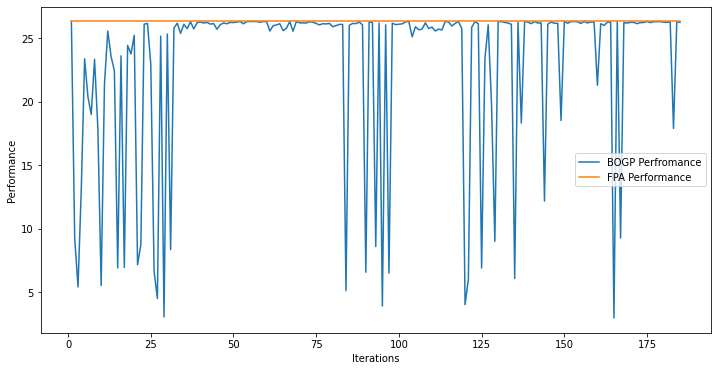

x_next is [-5.90287399e-07 -2.40829932e+01 -3.32854006e+00 -2.87289658e-07
 -7.07731619e-04 -5.80638993e-02 -1.49908921e+01 -2.89192421e-07
 -1.93738720e+01 -2.92093885e-07 -6.35691744e+00 -1.57115501e+01
 -8.18223847e+00 -1.37818416e+01 -4.52288105e-07 -4.20287011e-07
 -4.55923865e-07 -1.61061303e+01 -3.63377989e-07 -6.32859803e-07]
f()=30.960773, actual=23.598
184


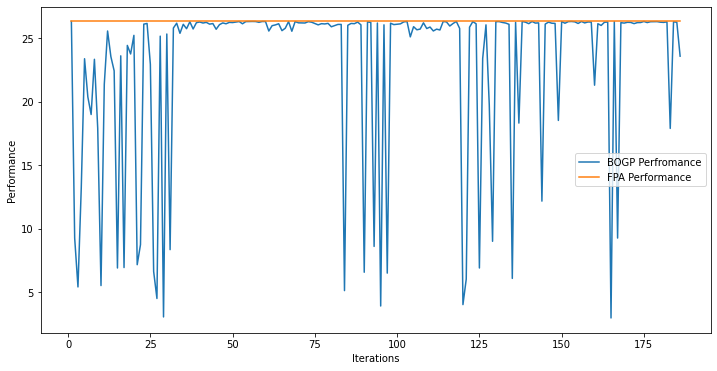

x_next is [-18.71105657 -17.83179142  -2.00307837 -12.00414603 -28.90753458
  -9.83071233  -5.65935295 -29.63575811 -17.56195493 -24.18361691
 -22.4977369  -10.06592032 -23.02732766 -17.8918597  -17.77468078
  -6.36763777 -13.3836493   -0.38013065 -30.44001996  -3.0379341 ]
f()=6.584152, actual=6.584
185


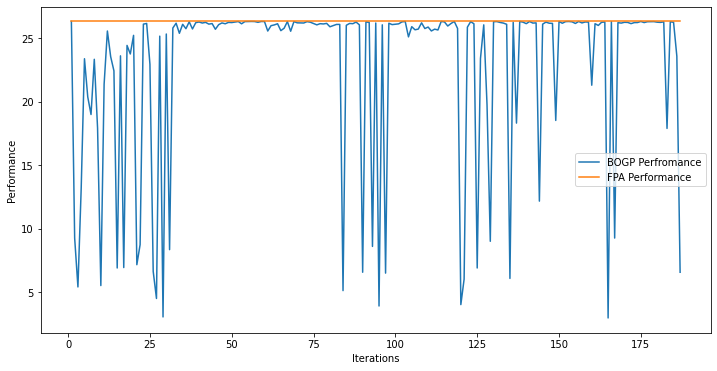

x_next is [ 0.00000000e+00 -2.43402866e-10  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -3.21718002e-10  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -2.06017373e-11  0.00000000e+00 -1.35238747e-10  0.00000000e+00]
f()=26.331294, actual=26.331
186


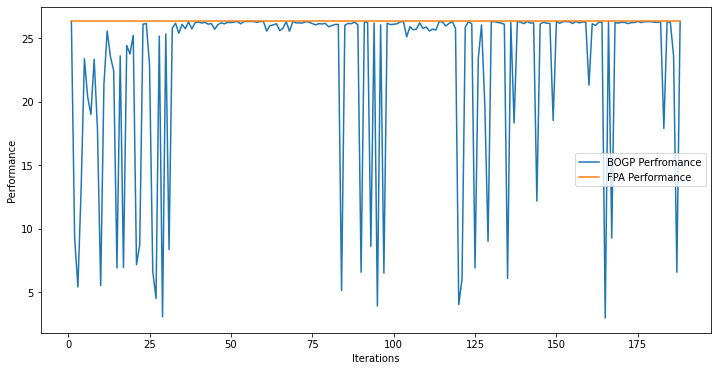

x_next is [-0.00407794 -0.0055175  -0.25583307 -0.0103499  -0.01890481 -0.02478721
 -0.00583518 -0.00663155 -0.37928503 -0.04491012 -0.24918979 -0.14464958
 -0.04493995 -0.0753559  -0.31677672 -0.00904002 -0.04382796 -0.02087237
 -0.02539896 -0.09886746]
f()=26.231455, actual=26.231
187


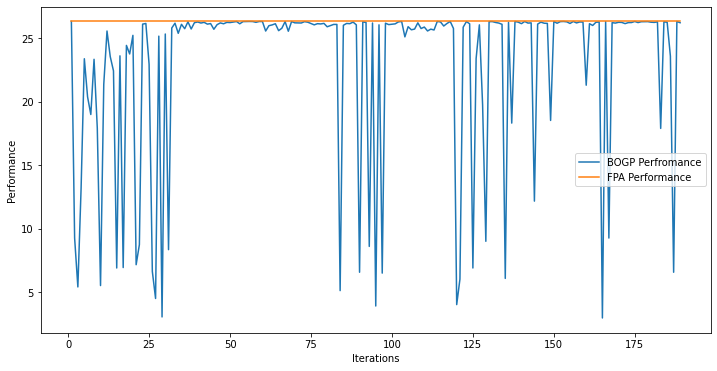

x_next is [ -0.85678747 -30.17605476 -10.18606092  -1.04306777  -3.07764963
  -2.43115157 -12.23718455  -4.28216181  -8.69420489  -0.25761299
  -0.60012198 -18.72449744 -29.98772011 -26.32141843  -3.6016072
  -3.30899941  -6.608949    -0.19679211  -0.30985891  -1.67990223]
f()=20.750276, actual=20.312
188


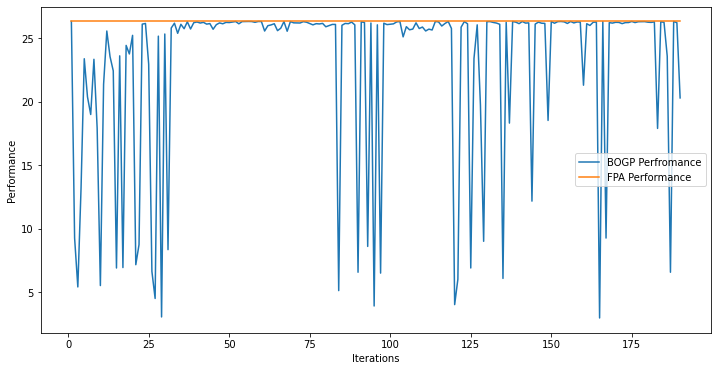

x_next is [-0.02227972 -0.15891642 -0.71350607 -0.15234929 -0.11117208 -0.00532618
 -0.01757824 -0.12251416 -0.34860417 -0.00379623 -0.3851479  -0.0125923
 -0.1187716  -0.09061263 -0.23720952 -0.02847974 -0.02945014 -0.01074699
 -0.00624055 -0.01218491]
f()=26.210372, actual=26.211
189


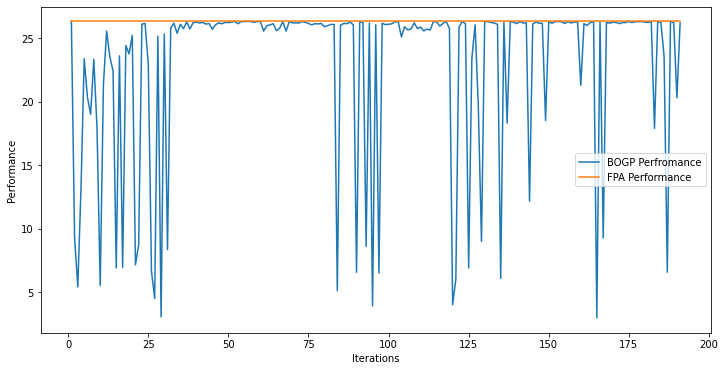

x_next is [-3.54457228e-02 -6.21679749e-03 -3.16172428e-01 -2.97740098e-09
 -1.96027605e-06 -1.30348963e-07 -5.22400870e-21 -2.52204616e-02
 -7.04465176e-01 -5.37653089e-07 -1.19937887e+00 -1.32149791e-07
 -2.13563662e-09 -2.25917494e-06 -4.57078426e-02 -2.79108979e-03
 -7.22114455e-02 -4.13395814e-02 -5.48381653e-12 -1.31299237e-07]
f()=26.283184, actual=26.283
190


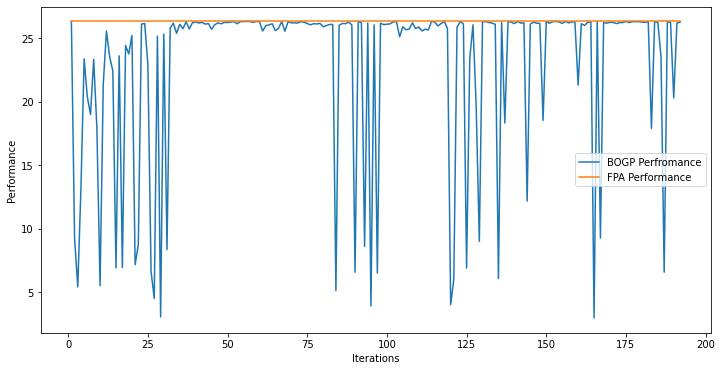

x_next is [-2.02264720e-06 -1.26775832e-01 -3.93313694e-01 -1.09483744e-06
 -1.32718986e-06 -1.99954509e-06 -1.22221926e-06 -3.54896109e-06
 -2.82843781e-01 -2.61735750e-06 -2.26386482e+00 -1.38468582e-06
 -1.01786760e-06 -8.44954991e-02 -1.91410323e-06 -4.76240515e-06
 -1.17302360e-06 -9.61391592e-02 -3.08750805e-06 -1.38293392e-06]
f()=26.294781, actual=26.295
191


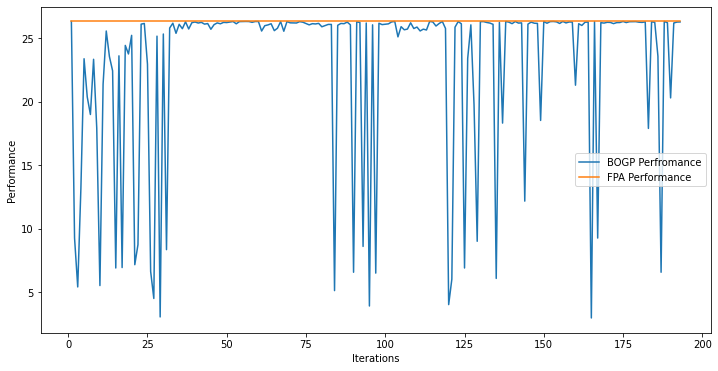

x_next is [-8.95906266e-08 -9.30937331e-02 -1.55869464e-01 -1.47693476e-07
 -2.56754084e-07 -1.61419981e-07 -1.16000366e-07 -1.03651816e-07
 -1.99844157e-02 -4.26718806e-07 -4.43585773e-01 -5.44188756e-02
 -3.10722400e-07 -1.81870041e-07 -1.85514991e-07 -1.16784041e-03
 -9.36312532e-08 -3.82516340e-07 -1.07326729e-03 -1.73356128e-07]
f()=26.320005, actual=26.320
192


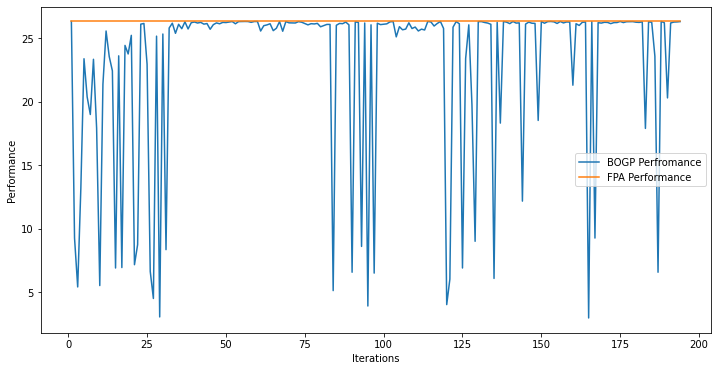

x_next is [-3.88562013e-08 -1.98336087e-07 -7.36220774e-08 -3.16832175e-08
 -2.92842927e-07 -3.96644901e-07 -2.43756061e-08 -7.18655142e-07
 -5.54727816e-04 -1.08216799e-07 -4.24129658e-06 -2.54887914e-08
 -3.73515858e-08 -9.32373996e-08 -3.16753074e-08 -1.08819773e-07
 -3.54580884e-07 -6.50960037e-08 -1.34832214e-07 -2.66832394e-08]
f()=26.331288, actual=26.331
193


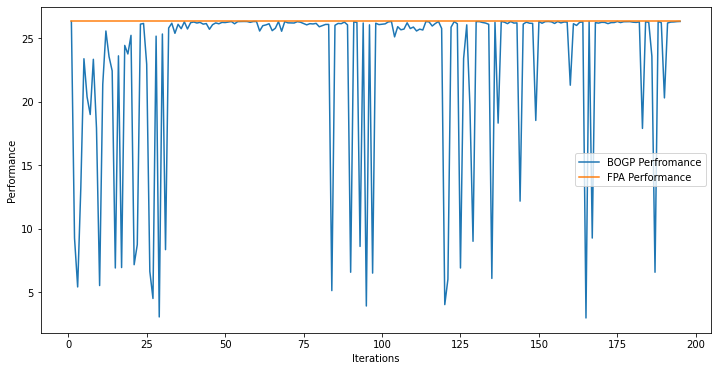

x_next is [-2.23214055e-11 -1.07064365e-10 -8.99766270e-11  0.00000000e+00
  0.00000000e+00 -5.26677475e-11  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -1.72345739e-10  0.00000000e+00
  0.00000000e+00 -7.83145595e-11  0.00000000e+00  0.00000000e+00
 -4.46431618e-11  0.00000000e+00 -5.32703588e-11  0.00000000e+00]
f()=26.331294, actual=26.331
194


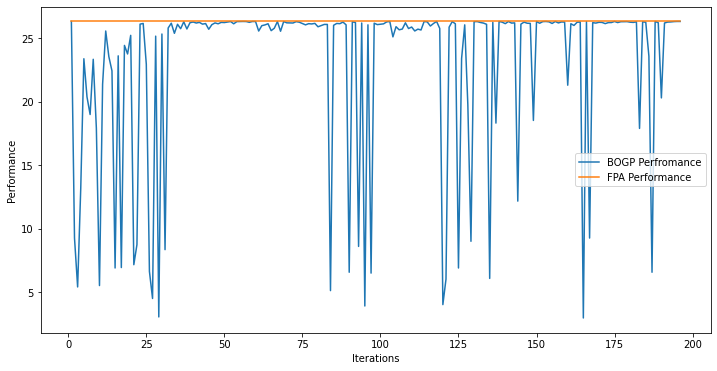

x_next is [-8.07914944e-03 -3.09715002e+01 -7.47107265e-02 -1.99564859e-02
 -8.51848906e-03 -2.86300623e-02 -3.11041325e-02 -2.52891296e-02
 -3.08573944e+01 -5.83771343e-02 -1.63168757e-01 -1.09166070e-01
 -5.56860033e-02 -3.09947362e+01 -2.16713718e-01 -2.66541686e-03
 -1.85825898e-03 -3.08689180e+01 -9.56835189e-03 -1.40998475e-02]
f()=26.152229, actual=25.098
195


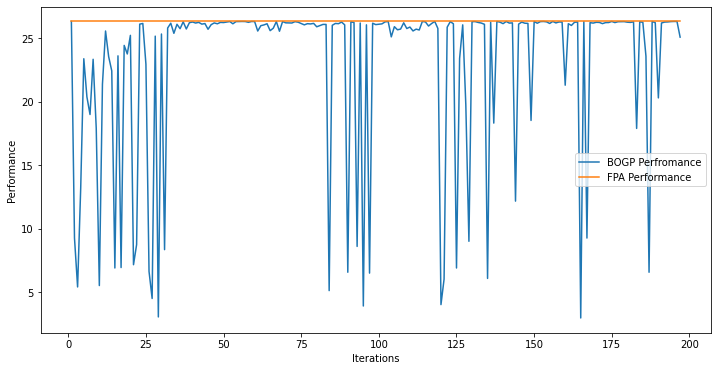

x_next is [ 0.          0.          0.          0.          0.          0.
  0.          0.         -0.90157071  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.        ]
f()=26.323522, actual=26.324
196


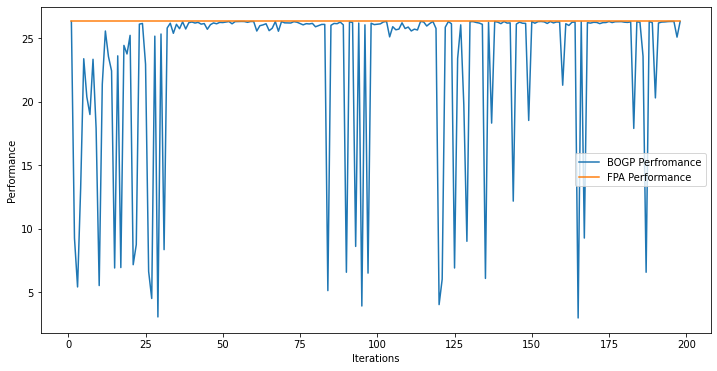

x_next is [-0.00255094 -0.08060991 -0.85288544 -0.10390036 -0.0077595  -0.02897319
 -0.0125529  -0.0158661  -0.66795883 -0.0145643  -0.31209998 -0.03092164
 -0.00450202 -0.00797778 -0.0340412  -0.00885462 -0.00298305 -0.01362378
 -0.02704757 -0.00211131]
f()=26.275733, actual=26.276
197


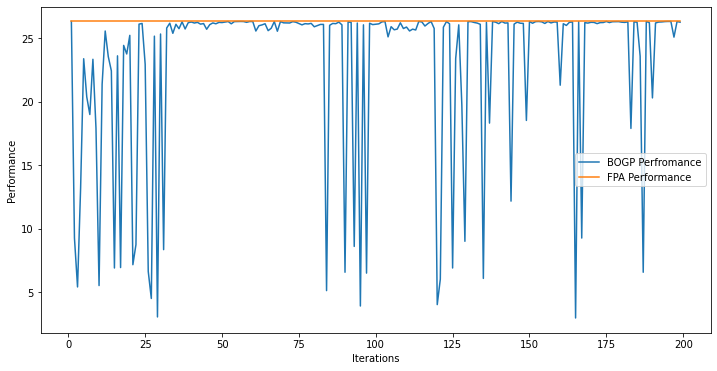

x_next is [-4.73077744e-03 -2.70941525e-01 -3.90090886e-02 -3.20707347e-03
 -2.04757146e-02 -3.78099972e-02 -4.53330428e-02 -7.76042353e-02
 -2.94729567e-02 -2.37612169e-02 -4.74854074e-02 -4.22488470e-02
 -1.36929333e-02 -6.07851229e-02 -2.54982731e-05 -1.52053436e-02
 -1.32509965e-02 -7.50967865e-02 -1.25022811e-02 -6.79908697e-02]
f()=26.279587, actual=26.251
198


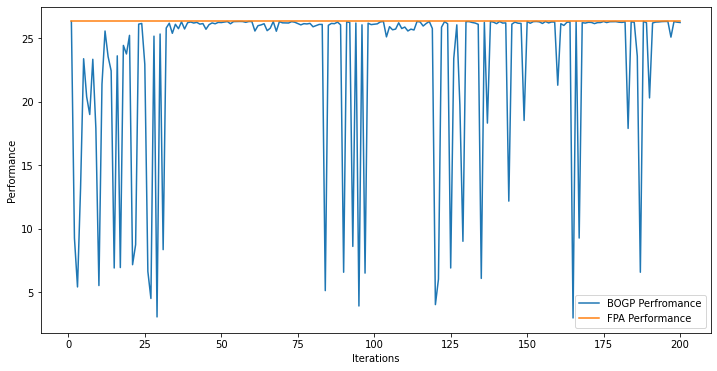

x_next is [-0.02533226 -0.40873586 -0.62450621 -0.03988526 -0.04811535 -0.06241544
 -0.05999534 -0.00063166 -0.05994537 -0.07051051 -0.54246703 -0.18900096
 -0.00526001 -0.05059632 -0.03688132 -0.08455044 -0.05570946 -0.14677931
 -0.04076906 -0.01056068]
f()=26.184918, actual=26.185
199


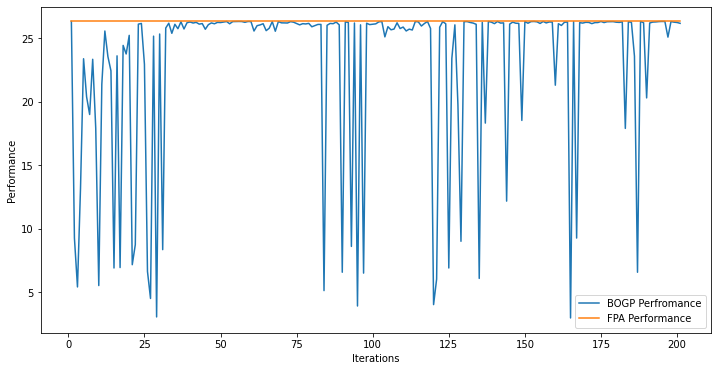

In [14]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel

X = 0 * np.ones([1,var], dtype = "float")
y = np.array([[objective_FPA(X[0].reshape((int)(var/number_of_cells), number_of_cells))]])

tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
y_FPA = np.array([[tr_FPA]])

kernels =  ConstantKernel(constant_value=200, constant_value_bounds = (1e-20, 1e20)) * Matern(length_scale=1, length_scale_bounds=(1e-20,1e20), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-20, 1e20)) 
model = GaussianProcessRegressor(kernel = kernels, n_restarts_optimizer=30)

model.fit(X, y)

for i in range(200):
  x_next = opt_acquisition(X, y, model, X.shape[0]+1)

  np.save("/content/drive/MyDrive/trainingx_BOGP_P=0_3.npy",X)
  np.save("/content/drive/MyDrive/trainingy_BOGP_P=0_3.npy",y)
  np.save("/content/drive/MyDrive/grad_trainingyFPA_BOGP_P=0_3.npy",y_FPA)
  
  tr = 0
  for l in range(1):
    tr = tr + objective_FPA(x_next.reshape((int)(var/number_of_cells), number_of_cells))
  tr = tr/1.0  
  actual = tr

  tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
  
  est, _ = surrogate(model, [x_next])
  print("x_next is", x_next)
  print('f()=%3f, actual=%.3f' % (est, actual))
  
  X = vstack((X, [x_next]))
  y = vstack((y, [[actual]]))
  y_FPA = vstack((y_FPA, [[tr_FPA]]))
  
  model.fit(X, y)
  
  print(i)
  pyplot.figure(figsize = (12, 6))

  pyplot.xlabel("Iterations")
  pyplot.ylabel("Performance")
  pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
  pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
  pyplot.legend(["BOGP Perfromance","FPA Performance"])
  pyplot.show()


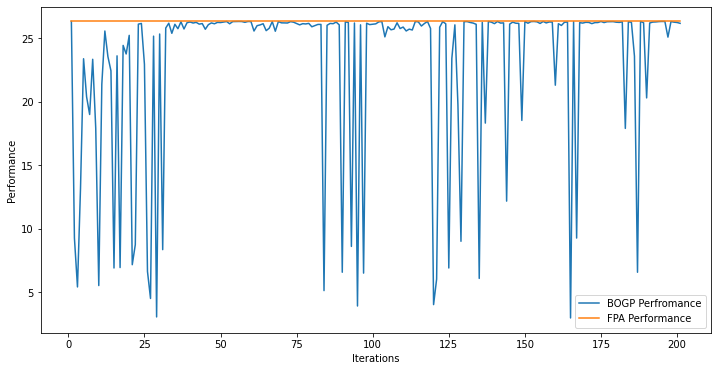

P_max = 0.000, Optimal_SE = 26.331
P_max = 0.000, Optimal_SE_FPA = 26.331


In [15]:
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show() 
ix = 0
ix = argmax(y)
print('P_max = %.3f, Optimal_SE = %.3f' % (P_max, y[ix]))

ix_FPA=0
ix_FPA=argmax(y_FPA)
print('P_max = %.3f, Optimal_SE_FPA = %.3f' % (P_max, y_FPA[ix_FPA]))

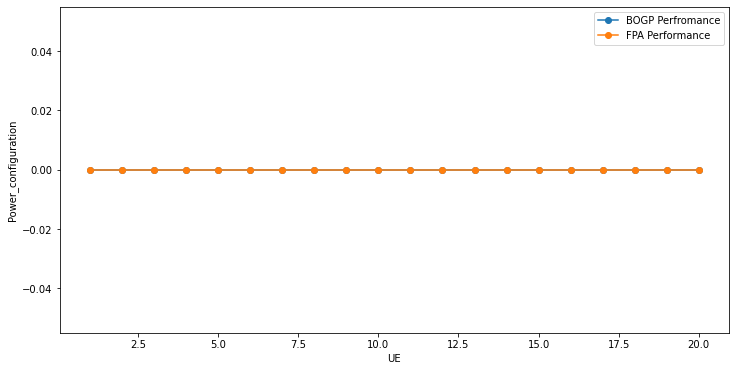

Power_configuration_BOGP is [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [16]:
X_FPA = P_max * np.ones([1,var], dtype = "float").reshape((int)(20), 1)
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("UE")
pyplot.ylabel("Power_configuration")
pyplot.plot(np.arange(1,21),X[ix][:], '-o')
pyplot.plot(np.arange(1,21),X_FPA[:], '-o')
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show()
print("Power_configuration_BOGP is", X[ix])

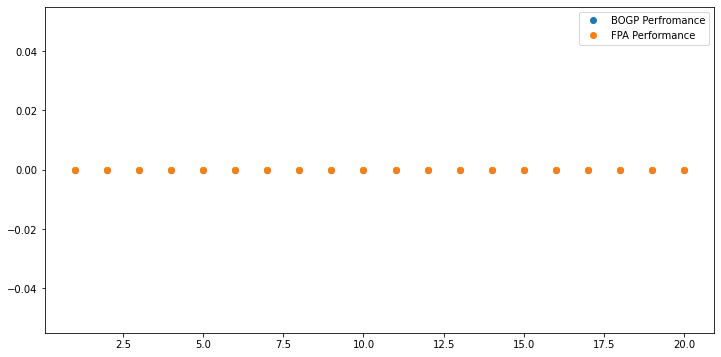

Power_configuration_BOGP is [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [17]:
import matplotlib.pyplot as plt
X_FPA=np.linspace(P_max,P_max,20)
plt.figure(figsize = (12, 6)) 
plt.plot(np.arange(1,21),X[ix][:], 'o')
plt.plot(np.arange(1,21),X_FPA[:], 'o')
plt.legend(["BOGP Perfromance","FPA Performance"])
plt.show()
print("Power_configuration_BOGP is", X[ix])